In [1]:
# bootstrap: raiz do projeto
import os, pathlib
_r = pathlib.Path.cwd()
while not (_r / 'CLAUDE.md').exists() and _r != _r.parent:
    _r = _r.parent
os.chdir(_r)

# Experimento — Seleção de Modelo: Quantidade de Propostas

**Objetivo:** Comparar modelos fixos e abordagens avançadas usando validação cruzada por séries temporais, para substituir o TPOT com um modelo confiável e rápido.

- **Parte 1:** Modelos simples com hiperparâmetros padrão (TimeSeriesSplit, 20 folds)
- **Parte 2:** Seleção de variáveis, tuning, ensembles e pipelines com pré-processamento
- **Resultado:** Tabela + gráficos comparativos → escolha do melhor modelo para produção

## Imports e Preparação

### 1

In [2]:
import pandas as pd
import numpy as np
import warnings
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from datetime import datetime, timedelta

import clickhouse_connect
from workadays import workdays as wd
from sklearn.base import clone
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from sklearn.linear_model import LinearRegression, Ridge, HuberRegressor
from sklearn.ensemble import (
    RandomForestRegressor, GradientBoostingRegressor,
    ExtraTreesRegressor, VotingRegressor, StackingRegressor
)
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_regression
from xgboost import XGBRegressor

warnings.filterwarnings('ignore')

In [3]:
# ==================== CONFIGURAÇÃO ====================
HOST        = '10.101.150.150'
PORT        = 8123
USER        = 'daniel_ramazzotte'
PASS        = 'O9pLTAv*yVz0lGP^#M'
JANELA_DIAS    = 45
N_SPLITS_INNER = 5    # folds para inner CV no tuning

_bkp = pd.read_excel(r"resultados\backup_qtd.xlsx")
_dp  = _bkp['Data previsao'].dropna()
DATA_REFERENCIA     = pd.Timestamp(_dp.max().date())
DATA_REFERENCIA_MIN = pd.Timestamp(_dp.min().date())
N_SPLITS_CV = len(_dp)   # 1 fold por dia previsto no backup
# buffer de 70 dias calendário (~45 dias úteis) antes do primeiro teste
DIAS_QUERY  = (datetime.today() - DATA_REFERENCIA_MIN).days + 70 + 10
print(f'Período backup : {DATA_REFERENCIA_MIN.date()} → {DATA_REFERENCIA.date()}')
print(f'N_SPLITS_CV    : {N_SPLITS_CV}  |  intervalo query: {DIAS_QUERY} dias')

Período backup : 2025-02-18 → 2026-04-22
N_SPLITS_CV    : 295  |  intervalo query: 580 dias


In [4]:
DATA_REFERENCIA = pd.Timestamp(_bkp['Data previsao'].dropna().max().date())
DIAS_QUERY = (datetime.today() - DATA_REFERENCIA).days + JANELA_DIAS + N_SPLITS_CV + 15

In [5]:
DATA_REFERENCIA

Timestamp('2026-04-22 00:00:00')

In [6]:
DIAS_QUERY

427

In [7]:
# ==================== DADOS ====================
import hashlib, pickle, os
_cache_dir = 'cache'
os.makedirs(_cache_dir, exist_ok=True)

query = f"""
SELECT
    toStartOfFifteenMinutes(ultimaalteracao) AS Intervalo,
    SUM(valor) AS valor,
    COUNT(propostaid) AS qntd
FROM crefaz.ft_proposta fp
WHERE
    propostaetapaid = 16
    AND propostadecisaoid IS NULL
    AND toDate(ultimaalteracao) BETWEEN toDate(today() - INTERVAL {DIAS_QUERY} DAY) AND toDate(today() - INTERVAL 1 DAY)
GROUP BY Intervalo
"""

# ---- Cache da query (refaz no maximo 1x por dia) ----
_key_q   = hashlib.md5(f"{pd.Timestamp.today().date()}|{DIAS_QUERY}|{query}".encode()).hexdigest()[:12]
_cache_q = os.path.join(_cache_dir, f'query_qtd_{_key_q}.pkl')

_loaded_q = False
if os.path.exists(_cache_q):
    try:
        with open(_cache_q, 'rb') as _f:
            df = pickle.load(_f)
        _loaded_q = True
        print(f'[cache hit] DADOS <- {_cache_q}')
    except Exception as e:
        print(f'[cache invalido] {e} - refazendo query...')

if not _loaded_q:
    client = clickhouse_connect.get_client(host=HOST, port=PORT, username=USER, password=PASS)
    df = client.query_df(query)
    try:
        with open(_cache_q, 'wb') as _f:
            pickle.dump(df, _f)
        print(f'[cache saved] DADOS -> {_cache_q}')
    except Exception as e:
        print(f'[cache erro ao salvar] {e}')

df['Intervalo'] = df['Intervalo'].astype(str)
df['data_hora'] = pd.to_datetime(df['Intervalo'].str.split('+').str[0])
df['data'] = pd.to_datetime(df['data_hora'].dt.date)
print(f'Registros carregados: {len(df)}')

[cache hit] DADOS <- cache\query_qtd_d21b5e828561.pkl
Registros carregados: 14760


In [8]:
# ==================== FEATURE ENGINEERING ====================
INCLUIR_SABADO_TREINO = True  # sábado incluso no treino, nunca na predição/test

data_referencia = DATA_REFERENCIA
data_min = DATA_REFERENCIA_MIN - timedelta(days=70)  # ~45 dias úteis antes do 1º fold
print(f'Período: {data_min.date()} → {data_referencia.date()}')

df_ag = df[(df['data'] <= data_referencia) & (df['data'] >= data_min)].copy()
df_ag = df_ag.groupby('data').agg({'qntd': 'sum', 'valor': 'sum'}).reset_index()
df_ag['qntd'] = df_ag['qntd'].astype(int)
df_ag['dia_semana'] = df_ag['data'].dt.day_of_week
df_ag['lag_0'] = df_ag['valor'].shift(1)
df_ag['lag_1'] = df_ag['qntd'].shift(1)
df_ag['lag_2'] = df_ag['qntd'].shift(2)
df_ag['lag_3'] = df_ag['qntd'].shift(3)
df_ag['lag_4'] = df_ag['qntd'].shift(4)
df_ag['lag_5'] = df_ag['qntd'].shift(5)
df_ag['lag_6'] = df_ag['qntd'].shift(6)
df_ag.dropna(inplace=True)
df_ag.reset_index(drop=True, inplace=True)

# Domingos e feriados: sempre excluídos de treino e predição
mask_invalido = df_ag['data'].apply(
    lambda d: d.dayofweek == 6 or bool(wd.is_holiday(d.date(), country='BR'))
)

# Dataset de PREDIÇÃO/TEST: seg–sex, sem feriados
mask_pred = ~mask_invalido & (df_ag['data'].dt.dayofweek < 5)
df_pred = df_ag[mask_pred].reset_index(drop=True)
dates = df_pred['data'].reset_index(drop=True)
X = df_pred.drop(columns=['data', 'valor', 'qntd']).astype(float)
y = df_pred['qntd'].astype(float)

# Dataset de TREINO: inclui sábados se INCLUIR_SABADO_TREINO=True
mask_train = ~mask_invalido if INCLUIR_SABADO_TREINO else mask_pred
df_train_all = df_ag[mask_train].reset_index(drop=True)
dates_train = df_train_all['data'].reset_index(drop=True)
X_train = df_train_all.drop(columns=['data', 'valor', 'qntd']).astype(float)
y_train = df_train_all['qntd'].astype(float)

print(f'Dataset pred  : {len(X)} amostras (seg–sex, não feriado)')
print(f'Dataset treino: {len(X_train)} amostras (inclui sábado={INCLUIR_SABADO_TREINO})')
print(f'Features: {list(X.columns)}')

Período: 2024-12-10 → 2026-04-22


Dataset pred  : 241 amostras (seg–sex, não feriado)
Dataset treino: 290 amostras (inclui sábado=True)
Features: ['dia_semana', 'lag_0', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6']


### Dias especiais — por que cada dia é excluído da base (outliers)

Antes de comparar os modelos, alguns dias são **removidos da base de realizados e preditos**.
O motivo é sempre o mesmo: nesses dias o realizado **não reflete a demanda normal** — ou houve
falha/instabilidade operacional que interrompeu ou represou a captação de propostas, ou é um dia
de atividade atipicamente baixa. Mantê-los penalizaria (ou premiaria) os modelos por **ruído
operacional**, não por capacidade preditiva, distorcendo o MAPE/RMSPE da comparação.

A remoção efetiva acontece na consolidação do ranking, via `mask_dias_excluir(...)`. São três
critérios:

#### (a) Log de Erro operacional — `logs/Log_Erro.xlsx`
Cada evento registra a **data** da falha, o **sistema/causa** e o **Impacto/dias**. A janela de
impacto é contada em **dias úteis** (seg–sex, exclui feriado BR): o 1º dia é o do evento e os
demais são os dias úteis seguintes (a fila represada costuma "vazar" para o(s) dia(s) seguinte(s),
inflando-os). Cada dia da janela é retirado da comparação.

| Data do evento | Sistema / causa | Impacto (dias úteis) | Dias removidos | Por quê |
|---|---|---|---|---|
| 06/02/2025 | BrSCAM | 3 | 06, 07 e 10/02/2025 | Instabilidade do BrSCAM interrompeu a originação; captação represada vaza p/ os dias úteis seguintes. |
| 26/02/2025 | CrefazOn | 2 | 26 e 27/02/2025 | Queda da plataforma interna CrefazOn — propostas não entram normalmente. |
| 05/03/2025 | Carnaval | 2 | 05 e 06/03/2025 | Período de Carnaval: dias úteis, mas com atividade atipicamente baixa. |
| 07/03/2025 | Bacen – Fila Pagamento | 2 | 07 e 10/03/2025 | Falha na fila de pagamento/averbação (Bacen) trava a conclusão das propostas. |
| 24/03/2025 | Enel – Mega | 3 | 24, 25 e 26/03/2025 | Indisponibilidade da integração Enel/Mega (crédito por conta de energia). |
| 22/04/2025 | CrefazOn | 2 | 22 e 23/04/2025 | Instabilidade do CrefazOn. |
| 22/05/2025 | Kamunda – Enel | 2 | 22 e 23/05/2025 | Falha na integração Kamunda/Enel. |
| 12/06/2025 | Unico – CrefazOn | 2 | 12 e 13/06/2025 | Falha na validação de identidade (Unico) integrada ao CrefazOn. |
| 23/06/2025 | Code – Mega | 1 | 23/06/2025 | Indisponibilidade do sistema Mega/Code. |
| 27/06/2025 | CrefazOn | 1 | 27/06/2025 | Instabilidade do CrefazOn. |
| 03/07/2025 | CrefazOn – Cobrança | 1 | 03/07/2025 | Falha no módulo de cobrança do CrefazOn. |
| 13/10/2025 | CrefazOn | 2 | 13 e 14/10/2025 | Queda do CrefazOn. |
| 24/10/2025 | E-Consulter | 2 | 24 e 27/10/2025 | Indisponibilidade da consulta/bureau E-Consulter. |
| 29/10/2025 | Microsoft | 1 | 29/10/2025 | Indisponibilidade de serviços Microsoft que afetou a operação. |
| 04/12/2025 | Crivo | 1 | 04/12/2025 | Falha no motor de crédito/score Crivo. |
| 05/02/2026 | RBM | 2 | 05 e 06/02/2026 | Indisponibilidade do RBM. |
| 02/04/2026 | RBM | 2 | 02 e 06/04/2026 | Indisponibilidade do RBM (06/04 é o próximo dia útil após o feriado). |

> Total de **31 dias úteis** marcados por erro operacional no `Log_Erro` (alguns podem estar fora
> da janela de comparação atual; só são efetivamente descontados os que caem no período avaliado).
> A função `sistema_erro(dia)` devolve o sistema responsável por um dia (ou `'Sem Erro'`).

#### (b) Vésperas atípicas (fixas)
**24/dez** (véspera de Natal) e **31/dez** (véspera de ano novo) são sempre removidas: expediente
reduzido e demanda muito abaixo do normal, sem relação com a qualidade do modelo.

#### (c) Outliers manuais — `DIAS_EXCLUIR_OUTLIERS`
Lista para datas adicionais a remover caso se identifique um dia anômalo não coberto por (a)/(b).
**No momento está vazia** (`[]`).


In [9]:
# ==================== DIAS ESPECIAIS / LOG DE ERRO ====================
# Conjunto de dias REMOVIDOS da base de realizados/preditos (aplicado na consolidacao):
#   (a) Log_Erro: dia do evento + (Impacto/dias - 1) dias UTEIS seguintes (dias de impacto).
#   (b) Vespera de Natal (24/dez), ano novo (31/dez) e de Carnaval -- dias atipicos de baixa atividade.
#   (c) DIAS_EXCLUIR_OUTLIERS: datas adicionais manuais.

def _bdays_from(_start, _n):
    """Primeiros _n dias UTEIS (seg-sex, exclui feriado BR) a partir de _start (inclusive)."""
    _out, _d = [], pd.Timestamp(_start).normalize()
    while len(_out) < _n:
        if _d.weekday() < 5 and not wd.is_holiday(_d.date(), country='BR'):
            _out.append(_d)
        _d += pd.Timedelta(days=1)
    return _out

# ---- Log de erros operacionais (logs/Log_Erro.xlsx) ----
LOG_ERRO_PATH = r'logs\Log_Erro.xlsx'
_mapa_erro = {}   # dia (Timestamp normalizado) -> sistema(s) em erro
try:
    _log_erro = pd.read_excel(LOG_ERRO_PATH)
    _log_erro['Data'] = pd.to_datetime(_log_erro['Data'], errors='coerce').dt.normalize()
    _log_erro['Impacto/dias'] = pd.to_numeric(_log_erro['Impacto/dias'], errors='coerce').fillna(1).astype(int)
    for _, _r in _log_erro.dropna(subset=['Data']).iterrows():
        _nome = str(_r['Sistema Erro']).strip()
        for _d in _bdays_from(_r['Data'], max(int(_r['Impacto/dias']), 1)):   # janela em dias UTEIS
            _mapa_erro[_d] = _nome if _d not in _mapa_erro else f'{_mapa_erro[_d]} + {_nome}'
    print(f'Log_Erro: {len(_log_erro)} eventos | dias de impacto (uteis): {len(_mapa_erro)}')
except Exception as _e:
    print(f'[Log_Erro indisponivel] {_e} -- seguindo sem remocao por erro operacional')

DIAS_ERRO = set(_mapa_erro)   # dias uteis impactados por erro operacional

def sistema_erro(d):
    """Sistema em erro no dia (1o dia = coluna Data; janela = Impacto/dias dias UTEIS). 'Sem Erro' se nao houver."""
    if d is None or pd.isna(d):
        return 'Sem Erro'
    return _mapa_erro.get(pd.Timestamp(d).normalize(), 'Sem Erro')

# Datas adicionais manuais a remover da base (alem de Log_Erro e vesperas)
DIAS_EXCLUIR_OUTLIERS = []

# ---- Vespera de Carnaval (Carnaval seg = Pascoa - 48 dias; NAO e feriado formal) ----
def _pascoa(_ano):
    a = _ano % 19; b = _ano // 100; c = _ano % 100; d = b // 4; e = b % 4
    f = (b + 8) // 25; g = (b - f + 1) // 3
    h = (19 * a + b - d - g + 15) % 30; i = c // 4; k = c % 4
    l = (32 + 2 * e + 2 * i - h - k) % 7; m = (a + 11 * h + 22 * l) // 451
    _mes = (h + l - 7 * m + 114) // 31; _dia = ((h + l - 7 * m + 114) % 31) + 1
    return pd.Timestamp(_ano, _mes, _dia)

def _vespera_carnaval(_ano):
    """Ultimo dia UTIL antes da segunda-feira de Carnaval (a sexta anterior, em geral)."""
    _d = _pascoa(_ano) - pd.Timedelta(days=48) - pd.Timedelta(days=1)
    while _d.weekday() >= 5 or wd.is_holiday(_d.date(), country='BR'):
        _d -= pd.Timedelta(days=1)
    return _d.normalize()

DIAS_VESPERA_CARNAVAL = {_vespera_carnaval(_y) for _y in range(2020, 2036)}

def mask_dias_excluir(serie_datas):
    """Mask booleana p/ remover da base de realizados/preditos E do TREINO:
    Log_Erro (dias de impacto) + vespera de Natal/ano novo (24 e 31/dez)
    + vespera de Carnaval + DIAS_EXCLUIR_OUTLIERS."""
    _dn = pd.to_datetime(serie_datas).dt.normalize()
    _m  = ((_dn.dt.month == 12) & (_dn.dt.day.isin([24, 31]))) | _dn.isin(DIAS_ERRO)
    _m  = _m | _dn.isin(DIAS_VESPERA_CARNAVAL)
    if DIAS_EXCLUIR_OUTLIERS:
        _m = _m | _dn.isin(set(pd.to_datetime(DIAS_EXCLUIR_OUTLIERS).normalize()))
    return _m

print(f'Dias especiais definidos | dias de erro={len(DIAS_ERRO)} | vesperas: 24, 31/dez e Carnaval')

Log_Erro: 17 eventos | dias de impacto (uteis): 31
Dias especiais definidos | dias de erro=31 | vesperas: 24, 31/dez e Carnaval


---
## PARTE 1 — Modelos Simples
Cada modelo avaliado com `TimeSeriesSplit(n_splits=20, test_size=1)` — 20 pontos de teste independentes.

In [10]:
MODELOS = {
    'LinearRegression': LinearRegression(),
    'Ridge':            Ridge(alpha=1.0),
    'HuberRegressor':   Pipeline([('scaler', StandardScaler()), ('huber', HuberRegressor(max_iter=300))]),
    'RandomForest':     RandomForestRegressor(n_estimators=200, random_state=42),
    'GradientBoosting': GradientBoostingRegressor(n_estimators=200, random_state=42),
    'ExtraTrees':       ExtraTreesRegressor(n_estimators=200, random_state=42),
    'XGBoost':          XGBRegressor(n_estimators=200, random_state=42, verbosity=0),
    'SVR':              Pipeline([('scaler', StandardScaler()), ('svr', SVR(C=10, epsilon=0.1))]),
    'KNN':              KNeighborsRegressor(n_neighbors=5),
}

In [11]:
tscv = TimeSeriesSplit(n_splits=min(N_SPLITS_CV, len(X) - 1), test_size=1, max_train_size=JANELA_DIAS)

def get_train(train_idx):
    """Retorna X_tr, y_tr: inclui sábados se INCLUIR_SABADO_TREINO=True."""
    if INCLUIR_SABADO_TREINO:
        d0, d1 = dates.iloc[train_idx[0]], dates.iloc[train_idx[-1]]
        # remove dias atipicos (Log_Erro + vesperas 24/31/Carnaval) TAMBEM do treino
        mask = (dates_train >= d0) & (dates_train <= d1) & (~mask_dias_excluir(dates_train))
        return X_train.loc[mask].reset_index(drop=True), y_train.loc[mask].reset_index(drop=True)
    _sel = np.asarray(train_idx)[~mask_dias_excluir(dates.iloc[list(train_idx)]).values]
    return X.iloc[_sel], y.iloc[_sel]

resultados_p1 = {}
detalhes_p1   = []

In [12]:
import hashlib, pickle, os

_cache_dir = 'cache'
os.makedirs(_cache_dir, exist_ok=True)

_key_p1   = hashlib.md5(
    f"{DATA_REFERENCIA.date()}|{JANELA_DIAS}|{N_SPLITS_CV}|{INCLUIR_SABADO_TREINO}|rmatip|{sorted(MODELOS)}".encode()
).hexdigest()[:12]
_cache_p1 = os.path.join(_cache_dir, f'p1_{_key_p1}.pkl')

_loaded = False
if os.path.exists(_cache_p1):
    try:
        with open(_cache_p1, 'rb') as _f:
            resultados_p1, detalhes_p1 = pickle.load(_f)
        _loaded = True
        print(f'[cache hit] P1 ← {_cache_p1}')
        for nome, mapes in resultados_p1.items():
            print(f'{nome:<25} MAPE médio={np.mean(mapes):6.2f}%  desvio={np.std(mapes):5.2f}%')
    except Exception as e:
        print(f'[cache inválido] {e} — retreinando...')

if not _loaded:
    # ==================== PARTE 1 ====================
    resultados_p1 = {}
    detalhes_p1   = []
    for nome, modelo in MODELOS.items():
        mapes = []
        for train_idx, test_idx in tscv.split(X):
            X_tr, y_tr = get_train(train_idx)
            X_te, y_te = X.iloc[test_idx], y.iloc[test_idx]
            if len(X_tr) < 8:
                continue
            try:
                m = clone(modelo)
                m.fit(X_tr, y_tr)
                y_pred_fold = m.predict(X_te)
            except Exception:
                continue
            mape_fold = mean_absolute_percentage_error(y_te, y_pred_fold) * 100
            mapes.append(mape_fold)
            detalhes_p1.append({
                'Modelo':          nome,
                'Dia Prevista':    dates.iloc[test_idx[0]].date(),
                'Treino Início':   dates.iloc[train_idx[0]].date(),
                'Treino Fim':      dates.iloc[train_idx[-1]].date(),
                'Valor Previsto':  round(float(y_pred_fold[0]), 1),
                'Valor Realizado': int(y_te.values[0]),
                'MAPE (%)':        round(mape_fold, 2),
            })
        if mapes:
            resultados_p1[nome] = mapes
            print(f'{nome:<25} MAPE médio={np.mean(mapes):6.2f}%  desvio={np.std(mapes):5.2f}%')
    try:
        with open(_cache_p1, 'wb') as _f:
            pickle.dump((resultados_p1, detalhes_p1), _f)
        print(f'\n[cache saved] P1 → {_cache_p1}')
    except Exception as e:
        print(f'[cache erro ao salvar] {e}')

[cache hit] P1 ← cache\p1_6abb6d6df9c6.pkl
LinearRegression          MAPE médio= 14.54%  desvio=22.92%
Ridge                     MAPE médio= 14.64%  desvio=22.83%
HuberRegressor            MAPE médio= 14.51%  desvio=21.05%
RandomForest              MAPE médio=  9.64%  desvio=15.26%
GradientBoosting          MAPE médio= 10.26%  desvio=16.21%
ExtraTrees                MAPE médio= 10.06%  desvio=14.89%
XGBoost                   MAPE médio=  9.68%  desvio=14.79%
SVR                       MAPE médio= 10.13%  desvio=13.49%
KNN                       MAPE médio= 19.99%  desvio=13.98%


In [13]:
df_detalhes_p1 = pd.DataFrame(detalhes_p1)
df_detalhes_p1['Intervalo Treinamento'] = (
    df_detalhes_p1['Treino Início'].astype(str) + ' → ' + df_detalhes_p1['Treino Fim'].astype(str)
)
df_detalhes_p1 = (
    df_detalhes_p1[['Modelo', 'Dia Prevista', 'Intervalo Treinamento', 'Valor Previsto', 'Valor Realizado', 'MAPE (%)']]
    .sort_values(['Dia Prevista', 'MAPE (%)'])
    .reset_index(drop=True)
)
df_detalhes_p1

,Modelo,Dia Prevista,Intervalo Treinamento,Valor Previsto,Valor Realizado,MAPE (%)
0,SVR,2025-05-20,2025-05-09 → 2025-05-19,2351.6,2327,1.06
1,XGBoost,2025-05-20,2025-05-09 → 2025-05-19,2352.6,2327,1.10
2,RandomForest,2025-05-20,2025-05-09 → 2025-05-19,2280.5,2327,2.00
3,ExtraTrees,2025-05-20,2025-05-09 → 2025-05-19,2434.5,2327,4.62
4,GradientBoosting,2025-05-20,2025-05-09 → 2025-05-19,2440.0,2327,4.85
...,...,...,...,...,...,...
2101,LinearRegression,2026-04-22,2026-02-12 → 2026-04-20,2975.2,3097,3.93
2102,SVR,2026-04-22,2026-02-12 → 2026-04-20,2970.0,3097,4.10
2103,XGBoost,2026-04-22,2026-02-12 → 2026-04-20,2934.6,3097,5.24
2104,HuberRegressor,2026-04-22,2026-02-12 → 2026-04-20,2926.6,3097,5.50


In [14]:
def build_table(resultados):
    rows = {}
    for nome, mapes in resultados.items():
        n = len(mapes)
        rows[nome] = {
            'MAPE Médio (%)': round(np.mean(mapes), 2),
            'Mediana (%)':    round(np.median(mapes), 2),
            'Q1 (%)':         round(np.percentile(mapes, 25), 2),
            'Q3 (%)':         round(np.percentile(mapes, 75), 2),
            'Desvio (%)':     round(np.std(mapes), 2),
            'Mín (%)':        round(np.min(mapes), 2),
            'Máx (%)':        round(np.max(mapes), 2),
            '< 1%':           f"{sum(m < 1 for m in mapes)}/{n}",
            '< 2%':           f"{sum(m < 2 for m in mapes)}/{n}",
            '< 3%':           f"{sum(m < 3 for m in mapes)}/{n}",
            '< 5%':           f"{sum(m < 5 for m in mapes)}/{n}",
            '< 10%':          f"{sum(m < 10 for m in mapes)}/{n}",
            '< 50%':          f"{sum(m < 50 for m in mapes)}/{n}",
            '< 100%':          f"{sum(m < 100 for m in mapes)}/{n}",
            '< 300%':          f"{sum(m < 300 for m in mapes)}/{n}",
        }
    return pd.DataFrame(rows).T.sort_values('MAPE Médio (%)').rename_axis('Pipeline').reset_index()

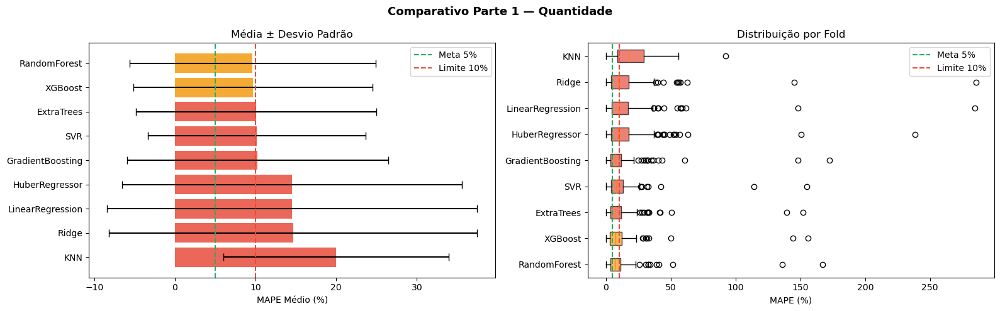

In [15]:
def plot_comparativo(resultados, titulo):
    df_plot = build_table(resultados)
    nomes   = df_plot['Pipeline'].tolist()
    medias  = df_plot['MAPE Médio (%)'].values
    desvios = df_plot['Desvio (%)'].values
    cores   = ['#2ecc71' if m < 5 else '#f39c12' if m < 10 else '#e74c3c' for m in medias]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, max(5, len(nomes) * 0.5)))
    fig.suptitle(titulo, fontsize=13, fontweight='bold')

    ax1.barh(nomes, medias, xerr=desvios, color=cores, alpha=0.85, capsize=4)
    ax1.axvline(5,  color='#27ae60', linestyle='--', lw=1.5, label='Meta 5%')
    ax1.axvline(10, color='#e74c3c', linestyle='--', lw=1.5, label='Limite 10%')
    ax1.set_xlabel('MAPE Médio (%)')
    ax1.set_title('Média ± Desvio Padrão')
    ax1.legend()
    ax1.invert_yaxis()

    bp = ax2.boxplot([resultados[n] for n in nomes], labels=nomes, vert=False, patch_artist=True)
    for patch, cor in zip(bp['boxes'], cores):
        patch.set_facecolor(cor)
        patch.set_alpha(0.7)
    ax2.axvline(5,  color='#27ae60', linestyle='--', lw=1.5, label='Meta 5%')
    ax2.axvline(10, color='#e74c3c', linestyle='--', lw=1.5, label='Limite 10%')
    ax2.set_xlabel('MAPE (%)')
    ax2.set_title('Distribuição por Fold')
    ax2.legend()

    plt.tight_layout()
    plt.show()

plot_comparativo(resultados_p1, 'Comparativo Parte 1 — Quantidade')

In [16]:
df_p1     = build_table(resultados_p1)
melhor_p1 = df_p1['Pipeline'].iloc[0]
top3      = [n for n in df_p1['Pipeline'][:3].tolist() if n in MODELOS]

print(f'Melhor modelo P1 : {melhor_p1}   MAPE={df_p1["MAPE Médio (%)"].iloc[0]:.2f}%')
print(f'Top-3            : {top3}')

Melhor modelo P1 : RandomForest   MAPE=9.64%
Top-3            : ['RandomForest', 'XGBoost', 'ExtraTrees']


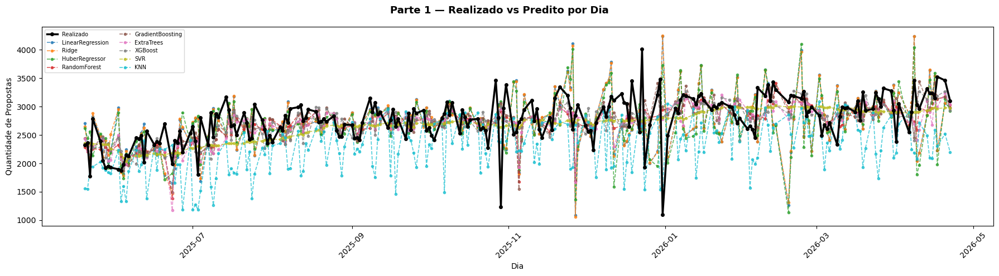

In [17]:
# ==================== SÉRIE TEMPORAL PARTE 1 ====================
df_detalhes_p1_plot = pd.DataFrame(detalhes_p1)

fig, ax = plt.subplots(figsize=(18, 5))
fig.suptitle('Parte 1 — Realizado vs Predito por Dia', fontsize=13, fontweight='bold')

realizado = (
    df_detalhes_p1_plot.drop_duplicates('Dia Prevista')
    .sort_values('Dia Prevista')
    .set_index('Dia Prevista')['Valor Realizado']
)
ax.plot(realizado.index, realizado.values, color='black', lw=2.5, marker='o', ms=4, label='Realizado', zorder=5)

modelos_unicos = df_detalhes_p1_plot['Modelo'].unique()
cmap_p1 = plt.cm.get_cmap('tab10', len(modelos_unicos))
for i, nome_m in enumerate(modelos_unicos):
    df_m = df_detalhes_p1_plot[df_detalhes_p1_plot['Modelo'] == nome_m].sort_values('Dia Prevista')
    ax.plot(df_m['Dia Prevista'], df_m['Valor Previsto'], '--', marker='o', ms=3, lw=1.2,
            color=cmap_p1(i), label=nome_m, alpha=0.75)

ax.set_xlabel('Dia')
ax.set_ylabel('Quantidade de Propostas')
ax.tick_params(axis='x', rotation=45)
ax.legend(fontsize=7, loc='upper left', ncol=2)
plt.tight_layout()
plt.show()

---
## PARTE 2 — Abordagens Avançadas
Replica o que o TPOT faz de forma transparente e controlada:
- **Seleção de variáveis** — SelectKBest com diferentes k
- **Tuning de hiperparâmetros** — RandomizedSearchCV com CV interno
- **Ensembles** — VotingRegressor e StackingRegressor
- **Pipelines** — pré-processamento + modelo

In [18]:
detalhes_p2 = []

In [19]:
resultados_p2 = {}

In [20]:
# ---- Definições para tuning (usadas na avaliação segmentada) ----
param_grids = {
    'GradientBoosting': {
        'n_estimators':     [100, 200, 300, 500],
        'max_depth':        [2, 3, 4, 5],
        'learning_rate':    [0.03, 0.05, 0.1, 0.2],
        'subsample':        [0.7, 0.8, 0.9, 1.0],
        'min_samples_leaf': [1, 2, 3],
    },
    'XGBoost': {
        'n_estimators':     [100, 200, 300, 500],
        'max_depth':        [2, 3, 4, 5],
        'learning_rate':    [0.03, 0.05, 0.1, 0.2],
        'subsample':        [0.7, 0.8, 0.9, 1.0],
        'colsample_bytree': [0.7, 0.8, 0.9, 1.0],
        'reg_alpha':        [0, 0.1, 0.5],
    },
    'RandomForest': {
        'n_estimators':     [100, 200, 300, 500],
        'max_depth':        [None, 3, 5, 7, 10],
        'min_samples_split': [2, 4, 6],
        'min_samples_leaf': [1, 2, 3],
        'max_features':     ['sqrt', 'log2', None],
    },
}

In [21]:
# ---- Definição de pipelines (usados na avaliação segmentada) ----
pipelines_adv = {
    'Poly(2) + Ridge':           Pipeline([('poly', PolynomialFeatures(degree=2, include_bias=False)), ('scaler', StandardScaler()), ('ridge', Ridge(alpha=1.0))]),
    'Scaler + XGBoost':          Pipeline([('scaler', StandardScaler()), ('xgb', XGBRegressor(n_estimators=200, random_state=42, verbosity=0))]),
    'Scaler + GradientBoosting': Pipeline([('scaler', StandardScaler()), ('gbm', GradientBoostingRegressor(n_estimators=200, random_state=42))]),
    'PCA(5) + GradientBoosting': Pipeline([('scaler', StandardScaler()), ('pca', PCA(n_components=5)), ('gbm', GradientBoostingRegressor(n_estimators=200, random_state=42))]),
}

In [22]:
import hashlib, pickle, os

_cache_dir = 'cache'
os.makedirs(_cache_dir, exist_ok=True)

n_features   = X.shape[1]
cands_tuning = [n for n in top3 if n in param_grids]

_key_p2   = hashlib.md5(
    f"{DATA_REFERENCIA.date()}|{JANELA_DIAS}|{N_SPLITS_CV}|{INCLUIR_SABADO_TREINO}|rmatip|{top3}|{n_features}|{sorted(pipelines_adv)}".encode()
).hexdigest()[:12]
_cache_p2 = os.path.join(_cache_dir, f'p2_{_key_p2}.pkl')

_loaded = False
if os.path.exists(_cache_p2):
    try:
        with open(_cache_p2, 'rb') as _f:
            resultados_p2, detalhes_p2 = pickle.load(_f)
        _loaded = True
        print(f'[cache hit] P2 ← {_cache_p2}')
        for nome, mapes in resultados_p2.items():
            print(f'{nome:<50} {np.mean(mapes):6.2f}% ± {np.std(mapes):5.2f}%')
    except Exception as e:
        print(f'[cache inválido] {e} — retreinando...')

if not _loaded:
    # ==================== PARTE 2 ====================
    resultados_p2 = {}
    detalhes_p2   = []

    # -- SelectKBest --
    for k in range(3, n_features):
        for modelo_nome in top3[:2]:
            nome  = f'SelectKBest(k={k})+{modelo_nome}'
            mapes = []
            for train_idx, test_idx in tscv.split(X):
                X_tr, y_tr = get_train(train_idx)
                X_te, y_te = X.iloc[test_idx], y.iloc[test_idx]
                if len(X_tr) < 8:
                    continue
                try:
                    sel   = SelectKBest(f_regression, k=k)
                    X_tr2 = sel.fit_transform(X_tr, y_tr)
                    X_te2 = sel.transform(X_te)
                    m     = clone(MODELOS[modelo_nome])
                    m.fit(X_tr2, y_tr)
                    y_pred_fold = m.predict(X_te2)
                except Exception:
                    continue
                mapes.append(mean_absolute_percentage_error(y_te, y_pred_fold) * 100)
                detalhes_p2.append({'Modelo': nome, 'Dia Prevista': dates.iloc[test_idx[0]].date(), 'Valor Previsto': round(float(y_pred_fold[0]), 1), 'Valor Realizado': int(y_te.values[0])})
            if mapes:
                resultados_p2[nome] = mapes
                print(f'{nome:<50} {np.mean(mapes):6.2f}% ± {np.std(mapes):5.2f}%')

    # -- Tuning --
    for modelo_nome in cands_tuning:
        nome  = f'{modelo_nome} (tuned)'
        mapes = []
        for train_idx, test_idx in tscv.split(X):
            X_tr, y_tr = get_train(train_idx)
            X_te, y_te = X.iloc[test_idx], y.iloc[test_idx]
            if len(X_tr) < 12:
                continue
            try:
                n_inner = min(N_SPLITS_INNER, len(X_tr) - 1)
                search  = RandomizedSearchCV(
                    clone(MODELOS[modelo_nome]), param_grids[modelo_nome],
                    n_iter=20, cv=TimeSeriesSplit(n_splits=n_inner, test_size=1),
                    scoring='neg_mean_absolute_percentage_error', random_state=42, n_jobs=-1,
                )
                search.fit(X_tr, y_tr)
                y_pred_fold = search.best_estimator_.predict(X_te)
            except Exception:
                continue
            mapes.append(mean_absolute_percentage_error(y_te, y_pred_fold) * 100)
            detalhes_p2.append({'Modelo': nome, 'Dia Prevista': dates.iloc[test_idx[0]].date(), 'Valor Previsto': round(float(y_pred_fold[0]), 1), 'Valor Realizado': int(y_te.values[0])})
        if mapes:
            resultados_p2[nome] = mapes
            print(f'{nome:<50} {np.mean(mapes):6.2f}% ± {np.std(mapes):5.2f}%')

    # -- Pipelines --
    for nome_pipe, pipe in pipelines_adv.items():
        nome  = nome_pipe
        mapes = []
        for train_idx, test_idx in tscv.split(X):
            X_tr, y_tr = get_train(train_idx)
            X_te, y_te = X.iloc[test_idx], y.iloc[test_idx]
            if len(X_tr) < 8:
                continue
            try:
                p = clone(pipe)
                p.fit(X_tr, y_tr)
                y_pred_fold = p.predict(X_te)
            except Exception:
                continue
            mapes.append(mean_absolute_percentage_error(y_te, y_pred_fold) * 100)
            detalhes_p2.append({'Modelo': nome, 'Dia Prevista': dates.iloc[test_idx[0]].date(), 'Valor Previsto': round(float(y_pred_fold[0]), 1), 'Valor Realizado': int(y_te.values[0])})
        if mapes:
            resultados_p2[nome] = mapes
            print(f'{nome:<50} {np.mean(mapes):6.2f}% ± {np.std(mapes):5.2f}%')

    # -- VotingRegressor --
    if len(top3) >= 2:
        nome  = f'VotingRegressor ({" + ".join(top3)})'
        mapes = []
        for train_idx, test_idx in tscv.split(X):
            X_tr, y_tr = get_train(train_idx)
            X_te, y_te = X.iloc[test_idx], y.iloc[test_idx]
            if len(X_tr) < 8:
                continue
            try:
                v = VotingRegressor([(n, clone(MODELOS[n])) for n in top3])
                v.fit(X_tr, y_tr)
                y_pred_fold = v.predict(X_te)
            except Exception:
                continue
            mapes.append(mean_absolute_percentage_error(y_te, y_pred_fold) * 100)
            detalhes_p2.append({'Modelo': nome, 'Dia Prevista': dates.iloc[test_idx[0]].date(), 'Valor Previsto': round(float(y_pred_fold[0]), 1), 'Valor Realizado': int(y_te.values[0])})
        if mapes:
            resultados_p2[nome] = mapes
            print(f'{nome:<50} {np.mean(mapes):6.2f}% ± {np.std(mapes):5.2f}%')

    # -- StackingRegressor --
    if len(top3) >= 2:
        nome  = 'StackingRegressor (top3 + Ridge)'
        mapes = []
        for train_idx, test_idx in tscv.split(X):
            X_tr, y_tr = get_train(train_idx)
            X_te, y_te = X.iloc[test_idx], y.iloc[test_idx]
            if len(X_tr) < 12:
                continue
            try:
                stk = StackingRegressor(
                    estimators=[(n, clone(MODELOS[n])) for n in top3],
                    final_estimator=Ridge(),
                    cv=TimeSeriesSplit(n_splits=3, test_size=1),
                )
                stk.fit(X_tr, y_tr)
                y_pred_fold = stk.predict(X_te)
            except Exception:
                continue
            mapes.append(mean_absolute_percentage_error(y_te, y_pred_fold) * 100)
            detalhes_p2.append({'Modelo': nome, 'Dia Prevista': dates.iloc[test_idx[0]].date(), 'Valor Previsto': round(float(y_pred_fold[0]), 1), 'Valor Realizado': int(y_te.values[0])})
        if mapes:
            resultados_p2[nome] = mapes
            print(f'{nome:<50} {np.mean(mapes):6.2f}% ± {np.std(mapes):5.2f}%')

    try:
        with open(_cache_p2, 'wb') as _f:
            pickle.dump((resultados_p2, detalhes_p2), _f)
        print(f'\n[cache saved] P2 → {_cache_p2}')
    except Exception as e:
        print(f'[cache erro ao salvar] {e}')

[cache hit] P2 ← cache\p2_427baaa5ab3f.pkl
SelectKBest(k=3)+RandomForest                       10.07% ± 14.22%
SelectKBest(k=3)+XGBoost                            10.81% ± 14.35%
SelectKBest(k=4)+RandomForest                        9.85% ± 14.88%
SelectKBest(k=4)+XGBoost                            10.08% ± 16.14%
SelectKBest(k=5)+RandomForest                        9.93% ± 15.06%
SelectKBest(k=5)+XGBoost                             9.98% ± 14.86%
SelectKBest(k=6)+RandomForest                        9.63% ± 15.25%
SelectKBest(k=6)+XGBoost                             9.97% ± 14.80%
SelectKBest(k=7)+RandomForest                        9.57% ± 14.98%
SelectKBest(k=7)+XGBoost                             9.89% ± 14.23%
RandomForest (tuned)                                 9.82% ± 15.27%
XGBoost (tuned)                                      9.90% ± 15.50%
Poly(2) + Ridge                                     11.38% ± 15.97%
Scaler + XGBoost                                     9.68% ± 14.79%
Scale

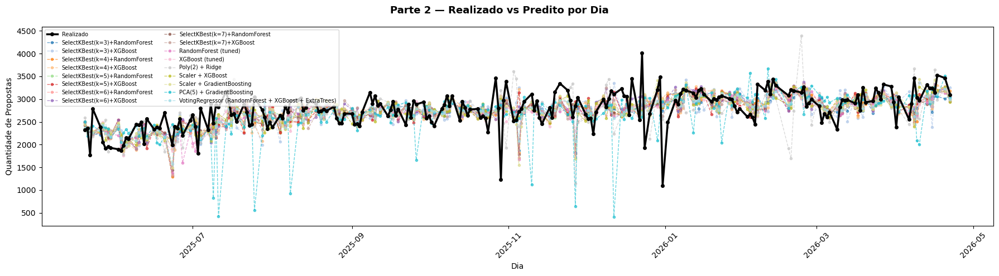

In [23]:
# ==================== SÉRIE TEMPORAL PARTE 2 ====================
df_detalhes_p2 = pd.DataFrame(detalhes_p2)

fig, ax = plt.subplots(figsize=(18, 5))
fig.suptitle('Parte 2 — Realizado vs Predito por Dia', fontsize=13, fontweight='bold')

if not df_detalhes_p2.empty:
    realizado = (
        df_detalhes_p2.drop_duplicates('Dia Prevista')
        .sort_values('Dia Prevista')
        .set_index('Dia Prevista')['Valor Realizado']
    )
    ax.plot(realizado.index, realizado.values, color='black', lw=2.5, marker='o', ms=4, label='Realizado', zorder=5)

    modelos_unicos = df_detalhes_p2['Modelo'].unique()
    cmap_p2 = plt.cm.get_cmap('tab20', len(modelos_unicos))
    for i, nome_m in enumerate(modelos_unicos):
        df_m = df_detalhes_p2[df_detalhes_p2['Modelo'] == nome_m].sort_values('Dia Prevista')
        ax.plot(df_m['Dia Prevista'], df_m['Valor Previsto'], '--', marker='o', ms=3, lw=1.0,
                color=cmap_p2(i), label=nome_m, alpha=0.65)

    ax.set_xlabel('Dia')
    ax.set_ylabel('Quantidade de Propostas')
    ax.tick_params(axis='x', rotation=45)
    ax.legend(fontsize=7, loc='upper left', ncol=2)

plt.tight_layout()
plt.show()

---
## PARTE 3 — Deep Learning e Séries Temporais

### 3a — Deep Learning (PyTorch): LSTM, CNN 1D, Transformer

Modelos neurais com early stopping e normalização por fold.  
**Dependência:** `pip install torch`

In [24]:
try:
    import torch
    import torch.nn as nn
    from torch.utils.data import DataLoader, TensorDataset
    TORCH_AVAILABLE = True
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f'PyTorch {torch.__version__}  |  device: {device}')
except ImportError:
    TORCH_AVAILABLE = False
    print('[aviso] PyTorch não encontrado — instale com: pip install torch')
    print('PARTE 3 será pulada e resultados_p3 = {} será usado no ranking.')

PyTorch 2.12.0+cpu  |  device: cpu


In [25]:
if TORCH_AVAILABLE:
    class _LSTMNet(nn.Module):
        """LSTM: extrai hidden state final e concatena contexto."""
        def __init__(self, seq_len=6, input_size=1, hidden=64, layers=2, ctx_size=2, dropout=0.2):
            super().__init__()
            self.lstm = nn.LSTM(input_size, hidden, layers, batch_first=True,
                                dropout=dropout if layers > 1 else 0.0)
            self.head = nn.Sequential(
                nn.Linear(hidden + ctx_size, 32), nn.ReLU(), nn.Linear(32, 1)
            )
        def forward(self, seq, ctx):
            _, (h, _) = self.lstm(seq)
            return self.head(torch.cat([h[-1], ctx], dim=1)).squeeze(-1)

    class _CNN1DNet(nn.Module):
        """CNN 1D: duas camadas conv com average pooling global + contexto."""
        def __init__(self, seq_len=6, n_filters=32, ctx_size=2):
            super().__init__()
            self.conv = nn.Sequential(
                nn.Conv1d(1, n_filters, kernel_size=3, padding=1), nn.ReLU(),
                nn.Conv1d(n_filters, n_filters, kernel_size=3, padding=1), nn.ReLU(),
                nn.AdaptiveAvgPool1d(1),
            )
            self.head = nn.Sequential(
                nn.Linear(n_filters + ctx_size, 32), nn.ReLU(), nn.Linear(32, 1)
            )
        def forward(self, seq, ctx):
            # seq: (batch, seq_len, 1) → permuta para (batch, 1, seq_len) antes do Conv1d
            x = self.conv(seq.permute(0, 2, 1)).squeeze(-1)
            return self.head(torch.cat([x, ctx], dim=1)).squeeze(-1)

    class _TransformerNet(nn.Module):
        """TransformerEncoder com positional embedding aprendível + pooling + contexto."""
        def __init__(self, seq_len=6, d_model=32, nhead=4, num_layers=2, ctx_size=2, dropout=0.1):
            super().__init__()
            self.proj = nn.Linear(1, d_model)
            self.pos  = nn.Parameter(torch.zeros(1, seq_len, d_model))
            enc = nn.TransformerEncoderLayer(d_model, nhead, dim_feedforward=64,
                                             dropout=dropout, batch_first=True)
            self.transformer = nn.TransformerEncoder(enc, num_layers)
            self.head = nn.Sequential(
                nn.Linear(d_model + ctx_size, 32), nn.ReLU(), nn.Linear(32, 1)
            )
        def forward(self, seq, ctx):
            x = self.proj(seq) + self.pos          # (batch, seq_len, d_model)
            x = self.transformer(x).mean(dim=1)    # average pooling temporal
            return self.head(torch.cat([x, ctx], dim=1)).squeeze(-1)

In [26]:
if TORCH_AVAILABLE:
    class _DeepTSWrapper:
        """Wrapper sklearn-compatível para regressores PyTorch de séries temporais."""

        # Sequência: lag_6 (mais antigo) → lag_1 (mais recente) — ordem cronológica
        SEQ_COLS = ['lag_6', 'lag_5', 'lag_4', 'lag_3', 'lag_2', 'lag_1']
        CTX_COLS = ['dia_semana', 'lag_0']

        def __init__(self, model_fn, epochs=150, lr=2e-3, batch_size=16, patience=20):
            self.model_fn   = model_fn
            self.epochs     = epochs
            self.lr         = lr
            self.batch_size = batch_size
            self.patience   = patience

        def _extract(self, X, y=None, fit=False):
            X = X.reset_index(drop=True) if hasattr(X, 'reset_index') else X
            seq_cols = [c for c in self.SEQ_COLS if c in X.columns]
            ctx_cols = [c for c in self.CTX_COLS if c in X.columns]
            seq = X[seq_cols].values.astype(np.float32)
            ctx = X[ctx_cols].values.astype(np.float32)
            if fit:
                seq = self._ss.fit_transform(seq)
                ctx = self._sc.fit_transform(ctx)
            else:
                seq = self._ss.transform(seq)
                ctx = self._sc.transform(ctx)
            seq_t = torch.tensor(seq, device=device).unsqueeze(-1)  # (n, seq_len, 1)
            ctx_t = torch.tensor(ctx, device=device)
            if y is not None:
                y_arr = np.array(y, dtype=np.float32).reshape(-1, 1)
                y_arr = self._sy.fit_transform(y_arr).flatten() if fit else self._sy.transform(y_arr).flatten()
                return seq_t, ctx_t, torch.tensor(y_arr, device=device)
            return seq_t, ctx_t

        def fit(self, X, y):
            self._ss = StandardScaler()
            self._sc = StandardScaler()
            self._sy = StandardScaler()
            seq_t, ctx_t, y_t = self._extract(X, y, fit=True)

            self.model_ = self.model_fn().to(device)
            opt     = torch.optim.Adam(self.model_.parameters(), lr=self.lr)
            loss_fn = nn.HuberLoss()
            ds = TensorDataset(seq_t, ctx_t, y_t)
            dl = DataLoader(ds, batch_size=self.batch_size, shuffle=True)

            best_loss, no_imp, best_w = float('inf'), 0, None
            self.model_.train()
            for _ in range(self.epochs):
                ep_loss = 0.0
                for sb, cb, yb in dl:
                    opt.zero_grad()
                    l = loss_fn(self.model_(sb, cb), yb)
                    l.backward()
                    nn.utils.clip_grad_norm_(self.model_.parameters(), 1.0)
                    opt.step()
                    ep_loss += l.item()
                ep_loss /= len(dl)
                if ep_loss < best_loss - 1e-5:
                    best_loss, no_imp = ep_loss, 0
                    best_w = {k: v.clone() for k, v in self.model_.state_dict().items()}
                else:
                    no_imp += 1
                    if no_imp >= self.patience:
                        break
            if best_w:
                self.model_.load_state_dict(best_w)
            return self

        def predict(self, X):
            seq_t, ctx_t = self._extract(X, fit=False)
            self.model_.eval()
            with torch.no_grad():
                p = self.model_(seq_t, ctx_t).cpu().numpy().reshape(-1, 1)
            return self._sy.inverse_transform(p).flatten()

In [27]:
import hashlib, pickle, os

resultados_p3 = {}
detalhes_p3   = []

if not TORCH_AVAILABLE:
    print('[skip] PyTorch indisponível — PARTE 3 vazia.')
else:
    _modelos_p3 = {
        'LSTM':        lambda: _DeepTSWrapper(lambda: _LSTMNet()),
        'CNN1D':       lambda: _DeepTSWrapper(lambda: _CNN1DNet()),
        'Transformer': lambda: _DeepTSWrapper(lambda: _TransformerNet()),
    }

    _key_p3   = hashlib.md5(
        f"{DATA_REFERENCIA.date()}|{JANELA_DIAS}|{N_SPLITS_CV}|{INCLUIR_SABADO_TREINO}|rmatip|p3v1".encode()
    ).hexdigest()[:12]
    _cache_p3 = os.path.join(_cache_dir, f'p3_{_key_p3}.pkl')

    _loaded_p3 = False
    if os.path.exists(_cache_p3):
        try:
            with open(_cache_p3, 'rb') as _f:
                resultados_p3, detalhes_p3 = pickle.load(_f)
            _loaded_p3 = True
            print(f'[cache hit] P3 ← {_cache_p3}')
            for nome, mapes in resultados_p3.items():
                print(f'{nome:<25} MAPE médio={np.mean(mapes):6.2f}%  desvio={np.std(mapes):5.2f}%  n={len(mapes)}')
        except Exception as e:
            print(f'[cache inválido] {e} — retreinando...')

    if not _loaded_p3:
        torch.manual_seed(42)
        for nome, factory in _modelos_p3.items():
            mapes = []
            for train_idx, test_idx in tscv.split(X):
                X_tr, y_tr = get_train(train_idx)
                X_te, y_te = X.iloc[test_idx], y.iloc[test_idx]
                if len(X_tr) < 10:
                    continue
                try:
                    modelo = factory()
                    modelo.fit(X_tr, y_tr)
                    y_pred_fold = modelo.predict(X_te)
                except Exception:
                    continue
                mape_fold = mean_absolute_percentage_error(y_te, y_pred_fold) * 100
                mapes.append(mape_fold)
                detalhes_p3.append({
                    'Modelo':          nome,
                    'Dia Prevista':    dates.iloc[test_idx[0]].date(),
                    'Treino Início':   dates.iloc[train_idx[0]].date(),
                    'Treino Fim':      dates.iloc[train_idx[-1]].date(),
                    'Valor Previsto':  round(float(y_pred_fold[0]), 1),
                    'Valor Realizado': int(y_te.values[0]),
                    'MAPE (%)':        round(mape_fold, 2),
                })
            if mapes:
                resultados_p3[nome] = mapes
                print(f'{nome:<25} MAPE médio={np.mean(mapes):6.2f}%  desvio={np.std(mapes):5.2f}%  n={len(mapes)}')
        try:
            with open(_cache_p3, 'wb') as _f:
                pickle.dump((resultados_p3, detalhes_p3), _f)
            print(f'\n[cache saved] P3 → {_cache_p3}')
        except Exception as e:
            print(f'[cache erro ao salvar] {e}')

[cache hit] P3 ← cache\p3_b1e40da249ec.pkl
LSTM                      MAPE médio= 10.90%  desvio=15.72%  n=233
CNN1D                     MAPE médio= 12.09%  desvio=18.28%  n=233
Transformer               MAPE médio= 11.83%  desvio=14.70%  n=233


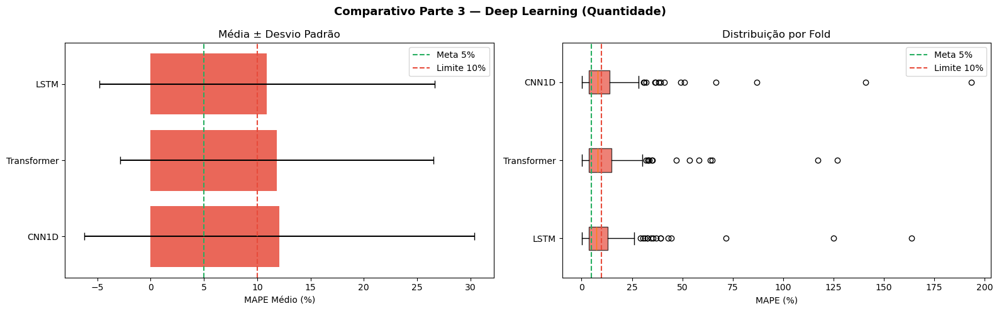

,Pipeline,MAPE Médio (%),Mediana (%),Q1 (%),Q3 (%),Desvio (%),Mín (%),Máx (%),< 1%,< 2%,< 3%,< 5%,< 10%,< 50%,< 100%,< 300%
0,LSTM,10.9,7.33,3.58,13.1,15.72,0.07,163.77,23/233,37/233,52/233,84/233,149/233,230/233,231/233,233/233
1,Transformer,11.83,8.1,3.75,14.85,14.7,0.06,126.83,13/233,30/233,44/233,80/233,138/233,227/233,231/233,233/233
2,CNN1D,12.09,7.99,3.74,13.89,18.28,0.02,193.6,16/233,26/233,43/233,72/233,145/233,228/233,231/233,233/233


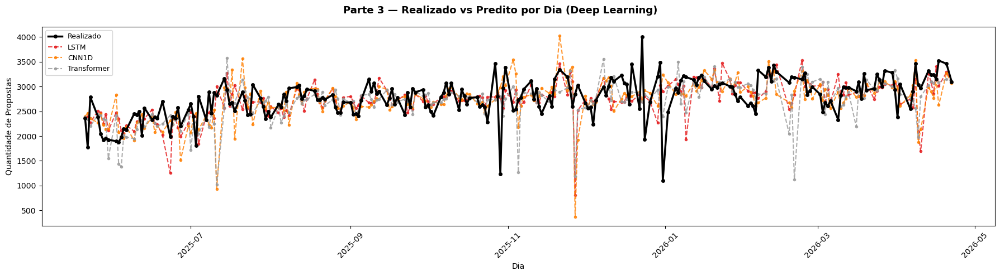

In [28]:
if resultados_p3:
    plot_comparativo(resultados_p3, 'Comparativo Parte 3 — Deep Learning (Quantidade)')
    display(build_table(resultados_p3))

    df_detalhes_p3 = pd.DataFrame(detalhes_p3)
    fig, ax = plt.subplots(figsize=(18, 5))
    fig.suptitle('Parte 3 — Realizado vs Predito por Dia (Deep Learning)', fontsize=13, fontweight='bold')
    realizado = (
        df_detalhes_p3.drop_duplicates('Dia Prevista')
        .sort_values('Dia Prevista').set_index('Dia Prevista')['Valor Realizado']
    )
    ax.plot(realizado.index, realizado.values, color='black', lw=2.5, marker='o', ms=4, label='Realizado', zorder=5)
    cmap_p3 = plt.cm.get_cmap('Set1', len(resultados_p3))
    for i, nome_m in enumerate(resultados_p3):
        df_m = df_detalhes_p3[df_detalhes_p3['Modelo'] == nome_m].sort_values('Dia Prevista')
        ax.plot(df_m['Dia Prevista'], df_m['Valor Previsto'], '--', marker='o', ms=3, lw=1.5,
                color=cmap_p3(i), label=nome_m, alpha=0.8)
    ax.set_xlabel('Dia')
    ax.set_ylabel('Quantidade de Propostas')
    ax.tick_params(axis='x', rotation=45)
    ax.legend(fontsize=9, loc='upper left')
    plt.tight_layout()
    plt.show()
else:
    print('Sem resultados P3 para plotar.')

---
### 3b — Séries Temporais Clássicas: Auto-ARIMA, Prophet, NeuralProphet

Modelos baseados em dependência temporal explícita — cada fold treina um modelo do zero na janela de treino, sem features de lag pré-computadas.

| Modelo | Exógenas | Observações |
|---|---|---|
| **Auto-ARIMA** | `dia_semana` | Seleção automática de ordem via AIC; stepwise search |
| **Prophet** | `dia_semana` (regressor) | Datas reais de calendário; sazonalidade semanal |
| **NeuralProphet** | — | Índice sequencial sintético (evita gaps de feriados); n_lags=5 |

In [29]:
import hashlib, pickle, os, logging as _logging
_logging.getLogger('prophet').setLevel(_logging.ERROR)
_logging.getLogger('cmdstanpy').setLevel(_logging.ERROR)
_logging.getLogger('NP').setLevel(_logging.ERROR)
_logging.getLogger('neuralprophet').setLevel(_logging.ERROR)

_cache_dir = 'cache'
os.makedirs(_cache_dir, exist_ok=True)
_folds_p3    = list(tscv.split(X))
_n_folds_p3  = len(_folds_p3)
_key_base_p3 = f"{DATA_REFERENCIA.date()}|{JANELA_DIAS}|{N_SPLITS_CV}"
print(f'Folds disponíveis para P3b: {_n_folds_p3}')

Folds disponíveis para P3b: 240


In [30]:
try:
    from pmdarima import auto_arima
    _pmdarima_ok = True
    print('pmdarima OK')
except ImportError:
    print('[aviso] pmdarima não instalado. Execute: pip install pmdarima')
    _pmdarima_ok = False

resultados_p3_arima = {}
detalhes_p3_arima   = []

if _pmdarima_ok:
    _key_p3a   = hashlib.md5(f"{_key_base_p3}|AutoARIMA|diaSemana|stepwise".encode()).hexdigest()[:12]
    _cache_p3a = os.path.join(_cache_dir, f'p3_arima_{_key_p3a}.pkl')

    _loaded_p3a = False
    if os.path.exists(_cache_p3a):
        try:
            with open(_cache_p3a, 'rb') as _f:
                resultados_p3_arima, detalhes_p3_arima = pickle.load(_f)
            _loaded_p3a = True
            print(f'[cache hit] AutoARIMA ← {_cache_p3a}')
            for nome, mapes in resultados_p3_arima.items():
                print(f'{nome:<25} MAPE médio={np.mean(mapes):6.2f}%  desvio={np.std(mapes):5.2f}%  n={len(mapes)}')
        except Exception as e:
            print(f'[cache inválido] {e} — retreinando...')

    if not _loaded_p3a:
        _mapes_arima = []
        for _i, (train_idx, test_idx) in enumerate(_folds_p3):
            X_tr, y_tr = get_train(train_idx)
            X_te, y_te = X.iloc[test_idx], y.iloc[test_idx]
            if len(X_tr) < 8:
                continue
            try:
                _exog_tr = X_tr[['dia_semana']].values
                _exog_te = X_te[['dia_semana']].values
                _model_arima = auto_arima(
                    y_tr.values, exogenous=_exog_tr,
                    seasonal=False, stepwise=True,
                    suppress_warnings=True, error_action='ignore',
                    information_criterion='aic',
                    max_p=3, max_q=3, max_d=2, n_jobs=1,
                )
                _yhat = max(0.0, float(_model_arima.predict(n_periods=1, exogenous=_exog_te)[0]))
            except Exception:
                continue
            _mape_f = mean_absolute_percentage_error(y_te, [_yhat]) * 100
            _mapes_arima.append(_mape_f)
            detalhes_p3_arima.append({
                'Modelo':          'AutoARIMA',
                'Dia Prevista':    dates.iloc[test_idx[0]].date(),
                'Treino Início':   dates.iloc[train_idx[0]].date(),
                'Treino Fim':      dates.iloc[train_idx[-1]].date(),
                'Valor Previsto':  round(_yhat, 1),
                'Valor Realizado': int(y_te.values[0]),
                'MAPE (%)':        round(_mape_f, 2),
            })
            if (_i + 1) % 50 == 0 or (_i + 1) == _n_folds_p3:
                print(f'  AutoARIMA: fold {_i+1}/{_n_folds_p3}  MAPE até agora={np.mean(_mapes_arima):.2f}%')
        if _mapes_arima:
            resultados_p3_arima['AutoARIMA'] = _mapes_arima
            print(f'\nAutoARIMA  MAPE médio={np.mean(_mapes_arima):.2f}%  desvio={np.std(_mapes_arima):.2f}%  n={len(_mapes_arima)}')
            try:
                with open(_cache_p3a, 'wb') as _f:
                    pickle.dump((resultados_p3_arima, detalhes_p3_arima), _f)
                print(f'[cache saved] AutoARIMA → {_cache_p3a}')
            except Exception as e:
                print(f'[cache erro ao salvar] {e}')

pmdarima OK
[cache hit] AutoARIMA ← cache\p3_arima_01519bd4bfdb.pkl
AutoARIMA                 MAPE médio= 22.84%  desvio=16.59%  n=234


In [31]:
try:
    import logging as _logging
    _logging.getLogger('prophet').setLevel(_logging.ERROR)
    _logging.getLogger('cmdstanpy').setLevel(_logging.ERROR)
    from prophet import Prophet
    _prophet_ok = True
    print('Prophet OK')
except ImportError:
    print('[aviso] Prophet não instalado. Execute: pip install prophet')
    _prophet_ok = False

resultados_p3_prophet = {}
detalhes_p3_prophet   = []

if _prophet_ok:
    _key_p3p   = hashlib.md5(f"{_key_base_p3}|Prophet|diasemana_reg".encode()).hexdigest()[:12]
    _cache_p3p = os.path.join(_cache_dir, f'p3_prophet_{_key_p3p}.pkl')

    _loaded_p3p = False
    if os.path.exists(_cache_p3p):
        try:
            with open(_cache_p3p, 'rb') as _f:
                resultados_p3_prophet, detalhes_p3_prophet = pickle.load(_f)
            _loaded_p3p = True
            print(f'[cache hit] Prophet ← {_cache_p3p}')
            for nome, mapes in resultados_p3_prophet.items():
                print(f'{nome:<25} MAPE médio={np.mean(mapes):6.2f}%  desvio={np.std(mapes):5.2f}%  n={len(mapes)}')
        except Exception as e:
            print(f'[cache inválido] {e} — retreinando...')

    if not _loaded_p3p:
        _mapes_prophet = []
        for _i, (train_idx, test_idx) in enumerate(_folds_p3):
            X_tr, y_tr = get_train(train_idx)
            X_te, y_te = X.iloc[test_idx], y.iloc[test_idx]
            if len(X_tr) < 8:
                continue
            try:
                _dates_tr  = dates.iloc[train_idx].reset_index(drop=True)
                _dates_te  = dates.iloc[test_idx].reset_index(drop=True)
                _prophet_df = pd.DataFrame({
                    'ds':         pd.to_datetime(_dates_tr),
                    'y':          y_tr.values.astype(float),
                    'dia_semana': X_tr['dia_semana'].values,
                })
                _model_prophet = Prophet(
                    weekly_seasonality=True, yearly_seasonality=False,
                    daily_seasonality=False, uncertainty_samples=0,
                )
                _model_prophet.add_regressor('dia_semana')
                _model_prophet.fit(_prophet_df)
                _future_df = pd.DataFrame({
                    'ds':         pd.to_datetime(_dates_te),
                    'dia_semana': X_te['dia_semana'].values,
                })
                _forecast = _model_prophet.predict(_future_df)
                _yhat = max(0.0, float(_forecast['yhat'].values[0]))
            except Exception:
                continue
            _mape_f = mean_absolute_percentage_error(y_te, [_yhat]) * 100
            _mapes_prophet.append(_mape_f)
            detalhes_p3_prophet.append({
                'Modelo':          'Prophet',
                'Dia Prevista':    dates.iloc[test_idx[0]].date(),
                'Treino Início':   dates.iloc[train_idx[0]].date(),
                'Treino Fim':      dates.iloc[train_idx[-1]].date(),
                'Valor Previsto':  round(_yhat, 1),
                'Valor Realizado': int(y_te.values[0]),
                'MAPE (%)':        round(_mape_f, 2),
            })
            if (_i + 1) % 50 == 0 or (_i + 1) == _n_folds_p3:
                print(f'  Prophet: fold {_i+1}/{_n_folds_p3}  MAPE até agora={np.mean(_mapes_prophet):.2f}%')
        if _mapes_prophet:
            resultados_p3_prophet['Prophet'] = _mapes_prophet
            print(f'\nProphet  MAPE médio={np.mean(_mapes_prophet):.2f}%  desvio={np.std(_mapes_prophet):.2f}%  n={len(_mapes_prophet)}')
            try:
                with open(_cache_p3p, 'wb') as _f:
                    pickle.dump((resultados_p3_prophet, detalhes_p3_prophet), _f)
                print(f'[cache saved] Prophet → {_cache_p3p}')
            except Exception as e:
                print(f'[cache erro ao salvar] {e}')

Prophet OK


09:02:07 - cmdstanpy - INFO - Chain [1] start processing


09:02:08 - cmdstanpy - INFO - Chain [1] done processing



Prophet  MAPE médio=15.85%  desvio=0.00%  n=1
[cache saved] Prophet → cache\p3_prophet_5df1f917aa44.pkl


In [32]:
try:
    from neuralprophet import NeuralProphet, set_log_level
    set_log_level("ERROR")
    _neuralprophet_ok = True
    print('NeuralProphet OK')
except ImportError:
    print('[aviso] NeuralProphet não instalado. Execute: pip install neuralprophet')
    _neuralprophet_ok = False

resultados_p3_neural = {}
detalhes_p3_neural   = []

# Chave e caminho do cache fora do if — leitura funciona mesmo sem o pacote
_key_p3n   = hashlib.md5(f"{_key_base_p3}|NeuralProphet|nlags5|ep30|v2".encode()).hexdigest()[:12]
_cache_p3n = os.path.join(_cache_dir, f'p3_neuralprophet_{_key_p3n}.pkl')

_loaded_p3n = False
if os.path.exists(_cache_p3n):
    try:
        with open(_cache_p3n, 'rb') as _f:
            resultados_p3_neural, detalhes_p3_neural = pickle.load(_f)
        _loaded_p3n = True
        print(f'[cache hit] NeuralProphet ← {_cache_p3n}')
        for nome, mapes in resultados_p3_neural.items():
            print(f'{nome:<25} MAPE médio={np.mean(mapes):6.2f}%  desvio={np.std(mapes):5.2f}%  n={len(mapes)}')
    except Exception as e:
        print(f'[cache inválido] {e} — retreinando...')

if not _loaded_p3n:
    if not _neuralprophet_ok:
        print('[aviso] Cache não encontrado e NeuralProphet não instalado — pulando.')
    else:
        _N_LAGS_NP  = 5
        _REF_DATE   = pd.Timestamp('2020-01-01')
        _mapes_neural = []
        for _i, (train_idx, test_idx) in enumerate(_folds_p3):
            X_tr, y_tr = get_train(train_idx)
            X_te, y_te = X.iloc[test_idx], y.iloc[test_idx]
            if len(X_tr) < _N_LAGS_NP + 2:
                continue
            try:
                _n_tr     = len(X_tr)
                _synth_tr = pd.date_range(_REF_DATE, periods=_n_tr, freq='D')
                _np_df    = pd.DataFrame({'ds': _synth_tr, 'y': y_tr.values.astype(float)})
                _model_np = NeuralProphet(
                    n_forecasts=1, n_lags=_N_LAGS_NP,
                    yearly_seasonality=False, weekly_seasonality=False, daily_seasonality=False,
                    epochs=30, batch_size=16, learning_rate=0.1,
                )
                _model_np.fit(_np_df, freq='D')
                try:
                    _fut = _model_np.make_future_dataframe(_np_df, periods=1)
                except TypeError:
                    _fut = _model_np.make_future_dataframe(_np_df, future_periods=1)
                _fc       = _model_np.predict(_fut)
                _yhat_col = 'yhat1' if 'yhat1' in _fc.columns else _fc.filter(like='yhat').columns[0]
                _yhat     = max(0.0, float(_fc[_yhat_col].dropna().iloc[-1]))
            except Exception:
                continue
            _mape_f = mean_absolute_percentage_error(y_te, [_yhat]) * 100
            _mapes_neural.append(_mape_f)
            detalhes_p3_neural.append({
                'Modelo':          'NeuralProphet',
                'Dia Prevista':    dates.iloc[test_idx[0]].date(),
                'Treino Início':   dates.iloc[train_idx[0]].date(),
                'Treino Fim':      dates.iloc[train_idx[-1]].date(),
                'Valor Previsto':  round(_yhat, 1),
                'Valor Realizado': int(y_te.values[0]),
                'MAPE (%)':        round(_mape_f, 2),
            })
            if (_i + 1) % 30 == 0 or (_i + 1) == _n_folds_p3:
                print(f'  NeuralProphet: fold {_i+1}/{_n_folds_p3}  MAPE até agora={np.mean(_mapes_neural):.2f}%')
        if _mapes_neural:
            resultados_p3_neural['NeuralProphet'] = _mapes_neural
            print(f'\nNeuralProphet  MAPE médio={np.mean(_mapes_neural):.2f}%  desvio={np.std(_mapes_neural):.2f}%  n={len(_mapes_neural)}')
            try:
                with open(_cache_p3n, 'wb') as _f:
                    pickle.dump((resultados_p3_neural, detalhes_p3_neural), _f)
                print(f'[cache saved] NeuralProphet → {_cache_p3n}')
            except Exception as e:
                print(f'[cache erro ao salvar] {e}')

[aviso] NeuralProphet não instalado. Execute: pip install neuralprophet
[aviso] Cache não encontrado e NeuralProphet não instalado — pulando.


In [33]:
import sys, types, joblib, glob, os, hashlib, pickle, copy
import warnings; warnings.filterwarnings('ignore')

# ---- Patch sklearn._loss._loss: __getattr__ generico para qualquer __pyx_unpickle_Cy* ----
try:
    import sklearn._loss._loss as _sll
    def _sll_getattr(name):
        if name.startswith('__pyx_unpickle_'):
            def _unpickle(cls, checksum, state, **kw):
                try:
                    kw2 = {k: v for k, v in state.items()} if isinstance(state, dict) else {}
                    return cls(**kw2)
                except Exception:
                    try:    return cls.__new__(cls)
                    except Exception: return object.__new__(cls)
            return _unpickle
        raise AttributeError(name)
    _sll.__getattr__ = _sll_getattr
except Exception:
    pass

# ---- Shim tpot.builtins / tpot.builtin_modules ----
class _ZeroCount:
    def fit(self, X, y=None): return self
    def transform(self, X):
        Xa = X.values if hasattr(X, 'values') else np.asarray(X)
        n0 = (Xa == 0).sum(axis=1, keepdims=True).astype(float)
        n1 = (Xa != 0).sum(axis=1, keepdims=True).astype(float)
        return np.hstack([Xa, n0, n1])
    def fit_transform(self, X, y=None): return self.fit(X, y).transform(X)

class _OHE:
    def __init__(self, minimum_fraction=0.05, sparse=True, threshold=10, **kw):
        self.threshold = threshold; self._cat = []; self._ohe = None
    def fit(self, X, y=None):
        from sklearn.preprocessing import OneHotEncoder as _SOHE
        Xa = X.values if hasattr(X, 'values') else np.asarray(X)
        self._cat = [i for i in range(Xa.shape[1])
                     if len(np.unique(Xa[:, i])) <= self.threshold]
        self._num = [i for i in range(Xa.shape[1]) if i not in self._cat]
        if self._cat:
            self._ohe = _SOHE(sparse_output=False, handle_unknown='ignore')
            self._ohe.fit(Xa[:, self._cat])
        return self
    def transform(self, X):
        Xa = X.values if hasattr(X, 'values') else np.asarray(X)
        parts = [Xa[:, self._num]] if self._num else []
        if self._cat and self._ohe:
            parts.append(self._ohe.transform(Xa[:, self._cat]))
        return np.hstack(parts) if parts else Xa
    def fit_transform(self, X, y=None): return self.fit(X, y).transform(X)

class _SE:
    def __init__(self, estimator=None, **kw): self.estimator = estimator
    def fit(self, X, y=None):
        if self.estimator: self.estimator.fit(X, y)
        return self
    def transform(self, X):
        Xa = X.values if hasattr(X, 'values') else np.asarray(X, dtype=float)
        if self.estimator:
            p = np.atleast_1d(self.estimator.predict(Xa)).reshape(-1, 1)
            return np.hstack([Xa, p])
        return Xa
    def fit_transform(self, X, y=None): return self.fit(X, y).transform(X)

class _Pass:
    def fit(self,X,y=None): return self
    def transform(self,X): return X
    def fit_transform(self,X,y=None): return X

class _FSS:
    def __init__(self, sel_subset=0, feat_list=None, feat_dict=None, **kw):
        self.sel_subset = sel_subset
        self.feat_list  = feat_list or []
        self.feat_dict  = feat_dict or {}
    def fit(self, X, y=None): return self
    def transform(self, X):
        Xa = np.array(X.values if hasattr(X, 'values') else X, dtype=float)
        if not self.feat_dict:
            return Xa
        keys = list(self.feat_dict.keys())
        if isinstance(self.sel_subset, int) and self.sel_subset < len(keys):
            indices = self.feat_dict[keys[self.sel_subset]]
        elif isinstance(self.sel_subset, str) and self.sel_subset in self.feat_dict:
            indices = self.feat_dict[self.sel_subset]
        elif isinstance(self.sel_subset, (list, tuple)):
            indices = list(self.sel_subset)
        else:
            return Xa
        indices = [i for i in indices if i < Xa.shape[1]]
        return Xa[:, indices] if indices else Xa
    def fit_transform(self, X, y=None): return self.fit(X, y).transform(X)

class _PassThru:
    'Passthrough generico para qualquer transformer desconhecido do TPOT.'
    def __init__(self, **kw): pass
    def fit(self, X, y=None): return self
    def transform(self, X):
        return X.values if hasattr(X, 'values') else np.asarray(X, dtype=float)
    def fit_transform(self, X, y=None): return self.fit(X, y).transform(X)

_shim_defs = {
    'tpot.builtins':                                            {'StackingEstimator': _SE, 'ZeroCount': _ZeroCount, 'OneHotEncoder': _OHE},
    'tpot.builtins.stacking_estimator':                         {'StackingEstimator': _SE},
    'tpot.builtins.zero_count':                                 {'ZeroCount': _ZeroCount},
    'tpot.builtins.one_hot_encoder':                            {'OneHotEncoder': _OHE},
    'tpot.builtin_modules':                                     {'FeatureSetSelector': _FSS},
    'tpot.builtin_modules.passthrough':                         {'Passthrough': _Pass, 'SkipTransformer': _Pass},
    'tpot.builtin_modules.feature_set_selector':                {'FeatureSetSelector': _FSS},
    'tpot.builtin_modules.arithmetic_transformer':              {'ArithmeticTransformer': _PassThru, 'AddTransformer': _PassThru, 'mul_neg_1_Transformer': _PassThru},
    'tpot.builtin_modules.genetic_encoders':                    {'GeneticEncoderClassification': _PassThru, 'GeneticEncoderRegression': _PassThru, 'GeneticEncoder': _PassThru},
    'tpot.builtin_modules.feature_encoding_frequency_selector': {'FeatureEncodingFrequencySelector': _PassThru},
    'tpot.builtin_modules.nn':                                  {'PytorchLRClassifier': _PassThru, 'PytorchMLPClassifier': _PassThru},
    'tpot.builtin_modules.feature_transformers':                {'ContinuousSelector': _PassThru, 'CategoricalSelector': _PassThru},
}
for _mn, _attrs in _shim_defs.items():
    if _mn not in sys.modules:
        _m = types.ModuleType(_mn); _m.__path__ = []
        sys.modules[_mn] = _m
    else:
        _m = sys.modules[_mn]
    for _k, _v in _attrs.items():
        setattr(_m, _k, _v)
    # PEP 562: __getattr__ em TODOS os modulos shim — cobre qualquer nome desconhecido
    _m.__getattr__ = lambda name: _PassThru

# Submódulos acessíveis como atributos do módulo pai
_bm = sys.modules['tpot.builtin_modules']
for _sub in ['passthrough', 'feature_set_selector', 'arithmetic_transformer',
             'genetic_encoders', 'feature_encoding_frequency_selector',
             'nn', 'feature_transformers']:
    setattr(_bm, _sub, sys.modules[f'tpot.builtin_modules.{_sub}'])

# ---- Enumera PKL files ----
_cache_dir  = 'cache'
os.makedirs(_cache_dir, exist_ok=True)
_pasta_mod  = r'modelos\quantidade'
_pkls_raw   = sorted(glob.glob(os.path.join(_pasta_mod, 'modelo_treinado-*.pkl')))

_pkl_entries = []
for _p in _pkls_raw:
    _stem = os.path.basename(_p).replace('modelo_treinado-', '').replace('.pkl', '').strip()
    if 'opia' in _stem:
        continue
    try:
        _pkl_entries.append((pd.Timestamp(_stem), _p, f'TPOT-{_stem}'))
    except Exception:
        pass
_pkl_entries.sort(key=lambda x: x[0])
print(f'PKL encontrados: {len(_pkl_entries)}')

# ---- Cache ----
_key_p4   = hashlib.md5(
    f"{DATA_REFERENCIA.date()}|{JANELA_DIAS}|{N_SPLITS_CV}|{INCLUIR_SABADO_TREINO}|rmatip|{[n for _,_,n in _pkl_entries]}|refit_folds|shim_v6".encode()
).hexdigest()[:12]
_cache_p4 = os.path.join(_cache_dir, f'p4_{_key_p4}.pkl')

_loaded_p4 = False
if os.path.exists(_cache_p4):
    try:
        with open(_cache_p4, 'rb') as _f:
            resultados_p4, detalhes_p4 = pickle.load(_f)
        _loaded_p4 = True
        print(f'[cache hit] P4 <- {_cache_p4}')
        for _n, _m in resultados_p4.items():
            print(f'  {_n:<35} MAPE medio={np.mean(_m):6.2f}%  desvio={np.std(_m):5.2f}%  n={len(_m)}')
    except Exception as e:
        print(f'[cache invalido] {e} - recarregando...')

if not _loaded_p4:
    # ---- Carrega modelos em memoria ----
    _pkls_mem  = {}
    _skip_load = []
    for _dt, _path, _nome in _pkl_entries:
        try:
            _pkls_mem[_nome] = (_dt, joblib.load(_path))
        except Exception as e:
            _skip_load.append((_nome, str(e)[:80]))
    print(f'Carregados: {len(_pkls_mem)}  |  Pulados: {len(_skip_load)}')
    for _n, _e in _skip_load:
        print(f'  [skip] {_n}: {_e}')

    # ---- Avaliacao: retreina cada pipeline nos mesmos folds de P1/P2 ----
    resultados_p4 = {}
    detalhes_p4   = []

    for _nome, (_dt_mod, _pipeline) in _pkls_mem.items():
        mapes = []
        for train_idx, test_idx in tscv.split(X):
            X_tr, y_tr = get_train(train_idx)
            X_te, y_te = X.iloc[test_idx], y.iloc[test_idx]
            if len(X_tr) < 8:
                continue
            _pred = None
            for _drop in [[], ['lag_0']]:
                try:
                    _p    = copy.deepcopy(_pipeline)
                    _Xtr2 = X_tr.drop(columns=_drop, errors='ignore')
                    _Xte2 = X_te.drop(columns=_drop, errors='ignore')
                    _p.fit(_Xtr2, y_tr)
                    _pred = float(_p.predict(_Xte2)[0])
                    break
                except Exception:
                    continue
            if _pred is None:
                continue
            _mape = mean_absolute_percentage_error(y_te, [_pred]) * 100
            mapes.append(_mape)
            detalhes_p4.append({
                'Modelo':          _nome,
                'Dia Prevista':    dates.iloc[test_idx[0]].date(),
                'Treino Inicio':   dates.iloc[train_idx[0]].date(),
                'Treino Fim':      dates.iloc[train_idx[-1]].date(),
                'Valor Previsto':  round(_pred, 1),
                'Valor Realizado': int(y_te.values[0]),
                'MAPE (%)':        round(_mape, 2),
            })
        if mapes:
            resultados_p4[_nome] = mapes
            print(f'{_nome:<35} MAPE medio={np.mean(mapes):6.2f}%  desvio={np.std(mapes):5.2f}%  n={len(mapes)}')

    print(f'\nPredicoes coletadas: {len(detalhes_p4)}  |  PKLs com resultado: {len(resultados_p4)}')

    try:
        with open(_cache_p4, 'wb') as _f:
            pickle.dump((resultados_p4, detalhes_p4), _f)
        print(f'\n[cache saved] P4 -> {_cache_p4}')
    except Exception as e:
        print(f'[cache erro ao salvar] {e}')


# ==================== TPOT Rename: data -> siglas de metodos ====================
def _pipeline_sigla(pipeline, _S={
    'GradientBoostingRegressor': 'GBR', 'XGBRegressor': 'XGB',
    'RandomForestRegressor': 'RFR',     'ExtraTreesRegressor': 'ETR',
    'Ridge': 'RID', 'Lasso': 'LAS',    'ElasticNet': 'EN',
    'LinearRegression': 'LR',           'HuberRegressor': 'HUB',
    'SVR': 'SVR', 'KNeighborsRegressor': 'KNR',
    'DecisionTreeRegressor': 'DTR',     'AdaBoostRegressor': 'ABR',
    'BaggingRegressor': 'BAG',          'ARDRegression': 'ARD',
    'StandardScaler': 'SS',             'RobustScaler': 'RS',
    'MaxAbsScaler': 'MAS',              'MinMaxScaler': 'MMS',
    'Normalizer': 'NRM', 'PCA': 'PCA', 'SelectKBest': 'SKB',
    'SelectPercentile': 'SPct',         'PolynomialFeatures': 'POLY',
    'FastICA': 'ICA', 'VarianceThreshold': 'VT', 'Binarizer': 'BIN',
    '_SE': 'SE',   'StackingEstimator': 'SE',
    '_ZeroCount': 'ZC', 'ZeroCount': 'ZC',
    '_OHE': 'OHE', 'OneHotEncoder': 'OHE',
    '_FSS': 'FSS', 'FeatureSetSelector': 'FSS',
    '_Pass': 'PASS', 'Passthrough': 'PASS', '_PassThru': 'PASS',
}):
    def _cls(est):
        c = type(est).__name__
        s = _S.get(c, c[:4].upper())
        if c in ('_SE', 'StackingEstimator') and getattr(est, 'estimator', None) is not None:
            ic = type(est.estimator).__name__
            s  = f"SE({_S.get(ic, ic[:4].upper())})"
        return s
    if hasattr(pipeline, 'steps'):
        return '+'.join(_cls(e) for _, e in pipeline.steps)
    return _cls(pipeline)

_tpot_rename_map = {}
_seen_siglas     = {}
for _dt_r, _path_r, _old_nome in _pkl_entries:
    if _old_nome not in resultados_p4:
        continue
    try:
        _pip_r = joblib.load(_path_r)
        _sigla = _pipeline_sigla(_pip_r)
    except Exception:
        _sigla = _old_nome.replace('TPOT-', 'TPOT')
    _cnt = _seen_siglas.get(_sigla, 0) + 1
    _seen_siglas[_sigla] = _cnt
    _tpot_rename_map[_old_nome] = _sigla if _cnt == 1 else f"{_sigla}-{_cnt}"

resultados_p4 = {_tpot_rename_map.get(k, k): v for k, v in resultados_p4.items()}
for _d in detalhes_p4:
    _d['Modelo'] = _tpot_rename_map.get(_d['Modelo'], _d['Modelo'])

print('\n[TPOT rename]')
for _old_r, _new_r in _tpot_rename_map.items():
    print(f'  {_old_r}  ->  {_new_r}')


PKL encontrados: 103
[cache hit] P4 <- cache\p4_600208885a2d.pkl
  TPOT-2025-05-19                     MAPE medio= 11.16%  desvio=14.56%  n=234
  TPOT-2025-06-16                     MAPE medio= 10.88%  desvio=17.85%  n=234
  TPOT-2025-06-17                     MAPE medio= 10.29%  desvio=14.19%  n=234
  TPOT-2025-06-25                     MAPE medio= 10.08%  desvio=16.16%  n=234
  TPOT-2025-07-02                     MAPE medio=  9.54%  desvio=14.85%  n=234
  TPOT-2025-07-07                     MAPE medio= 10.05%  desvio=15.92%  n=234
  TPOT-2025-07-15                     MAPE medio=  9.48%  desvio=15.11%  n=234
  TPOT-2025-07-16                     MAPE medio=  9.49%  desvio=15.81%  n=234
  TPOT-2025-07-23                     MAPE medio=  9.58%  desvio=14.54%  n=234
  TPOT-2025-07-29                     MAPE medio=  9.73%  desvio=14.41%  n=234
  TPOT-2025-07-30                     MAPE medio=  9.77%  desvio=14.81%  n=234
  TPOT-2025-08-07                     MAPE medio=  9.79%  desvio=1


[TPOT rename]
  TPOT-2025-05-19  ->  SELE+OHE+ABR
  TPOT-2025-06-16  ->  POLY+NRM+ABR
  TPOT-2025-06-17  ->  FEAT+RFR
  TPOT-2025-06-25  ->  RS+ABR
  TPOT-2025-07-02  ->  SE(DTR)+MMS+OHE+ABR
  TPOT-2025-07-07  ->  FEAT+DTR
  TPOT-2025-07-15  ->  RS+ABR-2
  TPOT-2025-07-16  ->  MAS+SE(DTR)+SE(ABR)+ABR
  TPOT-2025-07-23  ->  SE(ETR)+MMS+BIN+SE(ELAS)+ABR
  TPOT-2025-07-29  ->  ABR
  TPOT-2025-07-30  ->  SE(ETR)+MMS+SE(XGB)+ZC+ABR
  TPOT-2025-08-07  ->  SE(ETR)+SE(DTR)+SE(DTR)+ABR
  TPOT-2025-08-12  ->  FEAT+ABR
  TPOT-2025-08-18  ->  PCA+ABR
  TPOT-2025-08-25  ->  FEAT+RFR-2
  TPOT-2025-08-27  ->  SPct+SS+PCA+POLY+SE(DTR)+ABR
  TPOT-2025-09-01  ->  FEAT+ABR-2
  TPOT-2025-09-04  ->  FEAT+SE(ABR)+DTR
  TPOT-2025-09-11  ->  SE(ELAS)+SE(ETR)+NRM+SE(ABR)+ABR
  TPOT-2025-09-27  ->  ZC+NRM+NRM+ABR
  TPOT-2025-10-09  ->  FEAT+ABR-3
  TPOT-2025-10-18  ->  SELE+ICA+SELE+ICA+ABR
  TPOT-2025-10-20  ->  ABR-2
  TPOT-2025-10-21  ->  SPct+SE(DTR)+ABR
  TPOT-2025-12-01  ->  MMS+OHE+OHE+SELE+OHE+SELE+RFR

Predicoes coletadas: 13806  |  PKLs avaliados: 59

Ranking P4 -- Pipelines TPOT retreinadas nos folds (ordenado por MAPE medio):


,Pipeline,MAPE Médio (%),Mediana (%),Q1 (%),Q3 (%),Desvio (%),Mín (%),Máx (%),< 1%,< 2%,< 3%,< 5%,< 10%,< 50%,< 100%,< 300%
0,SE(LINE)+SE(SGDR)+ABR,9.25,6.83,2.93,11.05,14.57,0.08,154.14,15/234,36/234,61/234,92/234,168/234,232/234,232/234,234/234
1,SPct+ABR,9.3,6.81,2.96,11.21,14.54,0.07,155.07,28/234,42/234,59/234,88/234,162/234,232/234,232/234,234/234
2,FEAT+SE(ABR)+DTR,9.33,6.33,2.21,11.14,14.74,0.0,156.58,26/234,52/234,71/234,98/234,157/234,231/234,232/234,234/234
3,POLY+ABR,9.43,6.58,3.21,11.05,14.32,0.21,154.45,17/234,36/234,56/234,90/234,164/234,232/234,232/234,234/234
4,SE(ABR)+MAS+OHE+ABR,9.45,6.2,2.44,11.12,15.94,0.05,172.53,25/234,48/234,66/234,102/234,165/234,231/234,232/234,234/234
5,RS+ABR-2,9.48,6.84,3.23,11.06,15.11,0.03,157.53,21/234,40/234,53/234,91/234,163/234,231/234,232/234,234/234
6,MAS+SE(DTR)+SE(ABR)+ABR,9.49,6.23,2.73,11.58,15.81,0.02,164.28,22/234,45/234,64/234,100/234,163/234,231/234,232/234,234/234
7,FEAT+ABR-3,9.51,7.3,3.52,11.35,14.33,0.0,168.15,12/234,38/234,51/234,84/234,158/234,232/234,232/234,234/234
8,SPct+SE(ETR)+SE(DTR)+ABR,9.51,6.76,3.1,11.0,14.95,0.0,156.63,24/234,38/234,56/234,93/234,162/234,231/234,232/234,234/234
9,SE(DTR)+MMS+OHE+ABR,9.54,6.84,3.06,11.2,14.85,0.1,155.54,19/234,42/234,58/234,94/234,160/234,231/234,232/234,234/234


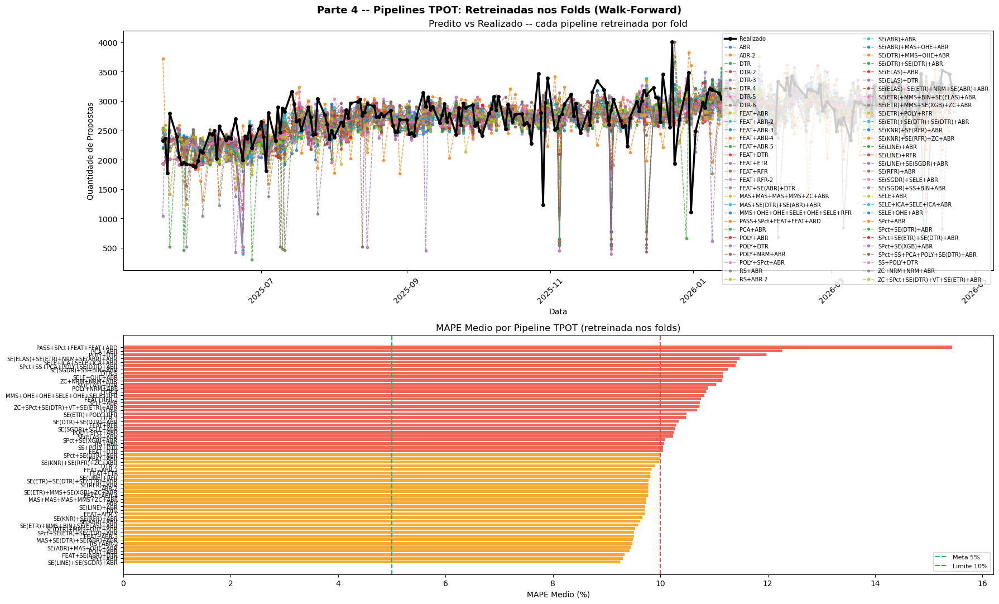

In [34]:
# ==================== P4 -- RESULTADOS: TPOT Retreinado nos Folds ====================
df_p4 = pd.DataFrame(detalhes_p4)
df_p4['Dia Prevista'] = pd.to_datetime(df_p4['Dia Prevista'])

if not df_p4.empty:
    _resumo_p4 = build_table(resultados_p4)
    print(f"Predicoes coletadas: {len(df_p4)}  |  PKLs avaliados: {df_p4['Modelo'].nunique()}")
    print("\nRanking P4 -- Pipelines TPOT retreinadas nos folds (ordenado por MAPE medio):")
    display(_resumo_p4)

    fig, axes = plt.subplots(2, 1, figsize=(18, 11))
    fig.suptitle('Parte 4 -- Pipelines TPOT: Retreinadas nos Folds (Walk-Forward)', fontsize=13, fontweight='bold')

    # Painel superior: realizado + predito por pipeline
    _df_sorted   = df_p4.sort_values('Dia Prevista')
    _real_unique = _df_sorted.drop_duplicates('Dia Prevista').set_index('Dia Prevista')
    axes[0].plot(_real_unique.index, _real_unique['Valor Realizado'],
                 color='black', lw=2.5, marker='o', ms=4, label='Realizado', zorder=5)
    
    _cmap_lines = plt.cm.tab10
    for _j, _nome_pipe in enumerate(sorted(resultados_p4)):
        _sub = _df_sorted[_df_sorted['Modelo'] == _nome_pipe].sort_values('Dia Prevista')
        axes[0].plot(_sub['Dia Prevista'], _sub['Valor Previsto'],
                     lw=1.0, linestyle='--', marker='o', ms=3, alpha=0.75,
                     color=_cmap_lines(_j % 10),
                     label=_nome_pipe)
    axes[0].set_ylabel('Quantidade de Propostas')
    axes[0].set_xlabel('Data')
    axes[0].tick_params(axis='x', rotation=45)
    axes[0].legend(fontsize=7, ncol=2)
    axes[0].set_title('Predito vs Realizado -- cada pipeline retreinada por fold')

    # Painel inferior: MAPE medio por PKL como barras horizontais
    _mape_med  = pd.Series({k: np.mean(v) for k, v in resultados_p4.items()}).sort_values()
    _cores_bar = ['#2ecc71' if m < 5 else '#f39c12' if m < 10 else '#e74c3c'
                  for m in _mape_med.values]
    _labels_bar = list(_mape_med.index)
    axes[1].barh(_labels_bar, _mape_med.values, color=_cores_bar, alpha=0.85)
    axes[1].axvline(5,  color='#27ae60', linestyle='--', lw=1.5, label='Meta 5%')
    axes[1].axvline(10, color='#e74c3c', linestyle='--', lw=1.5, label='Limite 10%')
    axes[1].set_xlabel('MAPE Medio (%)')
    axes[1].set_title('MAPE Medio por Pipeline TPOT (retreinada nos folds)')
    axes[1].tick_params(axis='y', labelsize=7)
    axes[1].legend(fontsize=8)

    plt.tight_layout()
    plt.show()


---
## Secao 4 - Comparacao e Selecao (sem correcao de vies)

**Metodologia:** todos os candidatos entram na comparacao com as previsoes **originais/cruas** -- nenhuma correcao de vies (debias) e aplicada em nenhum momento. O ranking e os graficos (5.A-5.C) usam a mesma base comum de datas (comparacao justa), apos a remocao dos dias especiais (Log_Erro + vesperas de Natal/ano novo/Carnaval + outliers manuais, ver secao de preparacao). A Pipeline Antiga entra como referencia, com o MAPE recomputado de forma consistente.


### 4.A - Todos os Modelos vs Pipeline Antiga (`backup_qtd`)


In [35]:
# ============================================================
# P3 CONSOLIDACAO (Deep Learning + Series Temporais)
# ============================================================
_res_p3_dl = dict(globals().get('resultados_p3', {}))
_det_p3_dl = list(globals().get('detalhes_p3', []))
_res_p3_ts, _det_p3_ts = {}, []
for _r3, _d3 in [
    (globals().get('resultados_p3_arima',   {}), globals().get('detalhes_p3_arima',   [])),
    (globals().get('resultados_p3_prophet', {}), globals().get('detalhes_p3_prophet', [])),
    (globals().get('resultados_p3_neural',  {}), globals().get('detalhes_p3_neural',  [])),
]:
    _res_p3_ts.update(_r3)
    _det_p3_ts.extend(_d3)
resultados_p3 = {**_res_p3_dl, **_res_p3_ts}
detalhes_p3   = _det_p3_dl + _det_p3_ts
print(f'P3 consolidado: {list(resultados_p3.keys())}')

# ============================================================
# CARREGA PIPELINE ANTIGA EM PRODUCAO (backup_qtd)
# ============================================================
bkp = pd.read_excel(r'resultados\backup_qtd.xlsx')
bkp['Map'] = (
    bkp['Map'].astype(str)
    .str.replace(',', '.', regex=False)
    .str.replace(r'[^0-9\.-]', '', regex=True)
)
bkp['Map']           = pd.to_numeric(bkp['Map'], errors='coerce')
bkp['Data previsao'] = pd.to_datetime(bkp['Data previsao'], errors='coerce')
_col_vp = 'Valor Previsto' if 'Valor Previsto' in bkp.columns else 'Valor previsto'
bkp['_vp_num'] = pd.to_numeric(bkp[_col_vp], errors='coerce')
bkp = bkp.dropna(subset=['Data previsao', 'Map', '_vp_num']).copy()

realizados  = df_ag.set_index('data')['qntd'].to_dict()
NOME_ANTIGO = 'Pipeline Antiga em Producao'

df_antigo = pd.DataFrame({
    'Modelo':                NOME_ANTIGO,
    'Dia Prevista':          pd.to_datetime(bkp['Data previsao'].dt.date.values.astype(str)),
    'Intervalo Treinamento': [
        f"{(d - timedelta(days=45)).date()} -> {(d - timedelta(days=1)).date()}"
        for d in bkp['Data previsao']
    ],
    'Valor Previsto':        bkp['_vp_num'].round(1).values,
    'Valor Realizado':       [
        int(realizados[pd.Timestamp(d.date())]) if pd.Timestamp(d.date()) in realizados else np.nan
        for d in bkp['Data previsao']
    ],
    'MAPE (%)':              np.nan,   # recalculado abaixo (NAO usa bkp['Map'], enviesado)
})
# MAPE da antiga recomputado de forma consistente: |Previsto - Realizado| / Realizado.
# bkp['Map'] foi gravado em producao contra o realizado incompleto do proprio dia -> enviesado.
# ClickHouse devolve Decimal -> coage p/ float antes de operar (evita TypeError float - Decimal)
_prev_f = pd.to_numeric(df_antigo['Valor Previsto'], errors='coerce').astype(float)
_real_f = pd.to_numeric(df_antigo['Valor Realizado'], errors='coerce').astype(float)
with np.errstate(divide='ignore', invalid='ignore'):
    _mape_ant = (_prev_f - _real_f).abs() / _real_f.abs().replace(0, np.nan) * 100
df_antigo['MAPE (%)'] = _mape_ant.round(2)
_res_antigo = _mape_ant.dropna().tolist()
print(f'{NOME_ANTIGO}: {len(df_antigo)} previsoes')

# ============================================================
# CONSOLIDA TODOS OS DETALHES EM UM UNICO DATAFRAME
# ============================================================
def _to_df_det(det):
    if not det:
        return pd.DataFrame()
    df = pd.DataFrame(det)
    if 'Dia Prevista' in df.columns:
        df['Dia Prevista'] = pd.to_datetime(df['Dia Prevista'])
    return df

_df_todos = pd.concat(
    [d for d in [
        _to_df_det(detalhes_p1),
        _to_df_det(detalhes_p2),
        _to_df_det(detalhes_p3),
        _to_df_det(detalhes_p4),
        _to_df_det(globals().get('detalhes_p5', [])),
        df_antigo,
    ] if not d.empty],
    ignore_index=True, sort=False
)
_df_todos['Dia Prevista'] = pd.to_datetime(_df_todos['Dia Prevista'])
_df_todos['MAPE (%)']     = pd.to_numeric(_df_todos['MAPE (%)'], errors='coerce')
# Alguns detalhes (ex.: P2) nao salvam MAPE (%) no dict — recalcula onde NaN
_mask_nan = _df_todos['MAPE (%)'].isna()
if _mask_nan.any():
    _vp = pd.to_numeric(_df_todos.loc[_mask_nan, 'Valor Previsto'],  errors='coerce')
    _vr = pd.to_numeric(_df_todos.loc[_mask_nan, 'Valor Realizado'], errors='coerce')
    _df_todos.loc[_mask_nan, 'MAPE (%)'] = ((_vp - _vr).abs() / _vr.abs().replace(0, np.nan) * 100).round(2)
    print(f'[MAPE recalculado] {_mask_nan.sum()} linhas sem MAPE preenchidas a partir de Previsto/Realizado')
_df_todos['Erro']         = (
    pd.to_numeric(_df_todos['Valor Previsto'],  errors='coerce') -
    pd.to_numeric(_df_todos['Valor Realizado'], errors='coerce')
)
print(f'Total linhas consolidadas: {len(_df_todos)} | Modelos: {_df_todos["Modelo"].nunique()}')

# Alinha periodos: intersecao de datas onde Pipeline Antiga E candidatos tem previsao
_datas_ant  = set(_df_todos.loc[_df_todos["Modelo"] == NOME_ANTIGO, "Dia Prevista"])
_datas_cand = set(_df_todos.loc[_df_todos["Modelo"] != NOME_ANTIGO, "Dia Prevista"])
_datas_comuns = _datas_ant & _datas_cand
_n_antes = len(_df_todos)
_df_todos = _df_todos[_df_todos["Dia Prevista"].isin(_datas_comuns)].copy()
print(f"Periodo alinhado: {len(_datas_comuns)} datas comuns | Pipeline Antiga: {len(_datas_ant)} | Candidatos: {len(_datas_cand)} | {_n_antes} -> {len(_df_todos)} linhas")

# ============================================================
# SEM CORRECAO DE VIES -- as previsoes originais/cruas de cada candidato sao usadas
# diretamente. Toda a Secao 5 (rankings e graficos 5.A-5.C) usa a mesma base comum
# de datas (comparacao justa), apos a remocao dos dias especiais abaixo.
# ============================================================
_UNID       = 'Quantidade de Propostas'

# Salvaguarda: descarta modelos com cobertura < 50% do maximo (evita que 1 modelo
# esparso colapse a intersecao de datas comuns)
_todos_mod = list(_df_todos['Modelo'].unique())
_cov = (_df_todos[_df_todos['Modelo'].isin(_todos_mod)]
        .dropna(subset=['Valor Previsto', 'Valor Realizado'])
        .groupby('Modelo')['Dia Prevista'].nunique())
_cov_max = _cov.max() if len(_cov) else 0
_drop = _cov[_cov < 0.5 * _cov_max].index.tolist()
if _drop:
    print(f'Descartados por baixa cobertura (<50% de {_cov_max} dias): {_drop}')
_todos_mod = [m for m in _todos_mod if m not in _drop]

# Base comum: todos os modelos restantes, restritos aos dias comuns a TODOS
_base = _df_todos[_df_todos['Modelo'].isin(_todos_mod)].dropna(
    subset=['Valor Previsto', 'Valor Realizado']).copy()
_cnt      = _base.groupby('Dia Prevista')['Modelo'].nunique()
_datas_ok = _cnt[_cnt == len(_todos_mod)].index
_base     = _base[_base['Dia Prevista'].isin(_datas_ok)].copy()
print(f'Base comum (sem correcao de vies): {len(_todos_mod)} modelos | {len(_datas_ok)} datas comuns')

# --- Remocao de dias especiais (outliers + Log_Erro) -------------------------
# Remove da base de realizados/preditos os dias definidos na secao de preparacao:
# Log_Erro (dias de impacto) + vespera de Natal/ano novo + DIAS_EXCLUIR_OUTLIERS.
_dp_norm  = _base['Dia Prevista'].dt.normalize()
_mask_out = mask_dias_excluir(_base['Dia Prevista'])
if _mask_out.any():
    _n0_out   = _base['Dia Prevista'].nunique()
    _dias_rm  = set(_dp_norm[_mask_out])
    _n_erro   = len(_dias_rm & DIAS_ERRO)
    _base     = _base[~_mask_out].copy()
    _datas_ok = _base['Dia Prevista'].unique()
    print(f'[outliers] removidos {int(_mask_out.sum())} registros ({len(_dias_rm)} dias atipicos; '
          f'{_n_erro} por Log_Erro) | datas {_n0_out} -> {_base["Dia Prevista"].nunique()}')

# Exporta as datas efetivamente avaliadas (base comum pos-atipicos) p/ alinhar o sarimax
os.makedirs('resultados', exist_ok=True)
_datas_avaliadas = pd.Series(sorted(pd.to_datetime(_base['Dia Prevista'].unique())))
_datas_avaliadas.to_pickle(r'resultados\datas_avaliadas_qtd.pkl')
print(f'[datas avaliadas -> sarimax] {len(_datas_avaliadas)} dias | '
      f'periodo {_datas_avaliadas.min().date()} -> {_datas_avaliadas.max().date()} | '
      f'resultados/datas_avaliadas_qtd.pkl')

# _df_db = previsoes cruas (sem correcao de vies) -- alias de _base
_df_db = _base.copy()

# ============================================================
# RANKING FINAL INTEGRADO -- SEM CORRECAO DE VIES (base comum a todos)
# ============================================================
_parte_map = (
    {n: 'P1' for n in resultados_p1} |
    {n: 'P2' for n in resultados_p2} |
    {n: 'P3' for n in resultados_p3} |
    {n: 'P4' for n in resultados_p4} |
    {n: 'P5' for n in globals().get('resultados_p5', {})} |
    {NOME_ANTIGO: 'REF'}
)
_todos_int = {}
_parte_int = {}
for _nome_r, _grp_r in _df_db.groupby('Modelo'):
    _mapes_r = _grp_r['MAPE (%)'].dropna().tolist()
    if _mapes_r:
        _todos_int[_nome_r] = _mapes_r
        _parte_int[_nome_r] = _parte_map.get(_nome_r, '?')

_rows_int = {}
for _nome_r, _mapes_r in _todos_int.items():
    _n_r = len(_mapes_r)
    _rows_int[_nome_r] = {
        'Parte':          _parte_int[_nome_r],
        'MAPE Medio (%)': round(np.mean(_mapes_r), 2),
        'Mediana (%)':    round(np.median(_mapes_r), 2),
        'Desvio (%)':     round(np.std(_mapes_r), 2),
        'Min (%)':        round(np.min(_mapes_r), 2),
        'Max (%)':        round(np.max(_mapes_r), 2),
        '< 5%':           f"{sum(m <   5 for m in _mapes_r)}/{_n_r}",
        '< 10%':          f"{sum(m <  10 for m in _mapes_r)}/{_n_r}",
        '< 50%':          f"{sum(m <  50 for m in _mapes_r)}/{_n_r}",
        '< 100%':         f"{sum(m < 100 for m in _mapes_r)}/{_n_r}",
        'N':              _n_r,
    }

df_ranking_int = pd.DataFrame(_rows_int).T
print('\nRanking Final Integrado (P1 + P2 + P3 + P4 + Pipeline Antiga) -- SEM correcao de vies:')

# Vies e MAE por modelo, derivados de _df_db
_err_aug = _df_db.dropna(subset=['Valor Previsto', 'Valor Realizado']).copy()
_err_aug['_rmp'] = (
    pd.to_numeric(_err_aug['Valor Realizado'], errors='coerce') -
    pd.to_numeric(_err_aug['Valor Previsto'],  errors='coerce')
)
_vies_aug = _err_aug.groupby('Modelo')['_rmp'].mean().round(1)
_mae_aug  = _err_aug.groupby('Modelo')['_rmp'].apply(lambda s: s.abs().mean()).round(1)
df_ranking_int['Vies (real-prev)'] = df_ranking_int.index.map(_vies_aug)
df_ranking_int['|Vies|']           = df_ranking_int['Vies (real-prev)'].abs().round(1)
df_ranking_int['MAE']              = df_ranking_int.index.map(_mae_aug)
def _r2_grp(s):
    _r = pd.to_numeric(s['Valor Realizado'], errors='coerce').astype(float)
    _p = pd.to_numeric(s['Valor Previsto'],  errors='coerce').astype(float)
    _sr = float(((_r - _p) ** 2).sum()); _st = float(((_r - _r.mean()) ** 2).sum())
    return round(1 - _sr / _st, 3) if _st != 0 else np.nan
_r2_aug = _err_aug.groupby('Modelo')[['Valor Realizado', 'Valor Previsto']].apply(_r2_grp)
df_ranking_int['R2']               = df_ranking_int.index.map(_r2_aug)
_var_aug = _err_aug.groupby('Modelo')['_rmp'].var(ddof=0).round(1)
_dp_aug  = _err_aug.groupby('Modelo')['_rmp'].std(ddof=0).round(1)
df_ranking_int['Var Erro']         = df_ranking_int.index.map(_var_aug)
df_ranking_int['DP Erro']          = df_ranking_int.index.map(_dp_aug)
# Vies percentual (MPE) e coef. de variacao do erro (DP do erro / nivel da serie)
def _mpe_grp(s):
    _r = pd.to_numeric(s['Valor Realizado'], errors='coerce').astype(float)
    _p = pd.to_numeric(s['Valor Previsto'],  errors='coerce').astype(float)
    return float(((_r - _p) / _r.replace(0, np.nan)).mean() * 100)
_mpe_aug   = _err_aug.groupby('Modelo')[['Valor Realizado', 'Valor Previsto']].apply(_mpe_grp).round(2)
_mreal_aug = _err_aug.groupby('Modelo')['Valor Realizado'].apply(lambda s: pd.to_numeric(s, errors='coerce').astype(float).mean())
_cv_aug    = (_err_aug.groupby('Modelo')['_rmp'].std(ddof=0) / _mreal_aug * 100).round(2)
df_ranking_int['Vies % (MPE)']     = df_ranking_int.index.map(_mpe_aug)
df_ranking_int['CV Erro (%)']      = df_ranking_int.index.map(_cv_aug)
_rmspe_int = _df_db.groupby('Modelo')['MAPE (%)'].apply(lambda s: float(np.sqrt(np.mean(np.square(s.dropna()))))).round(2)
df_ranking_int['RMSPE (%)']        = df_ranking_int.index.map(_rmspe_int)
_front = ['Parte', 'MAPE Medio (%)', 'RMSPE (%)', 'R2', 'Vies (real-prev)', '|Vies|', 'Vies % (MPE)', 'MAE', 'DP Erro', 'CV Erro (%)', 'Var Erro', 'Mediana (%)']
df_ranking_int = df_ranking_int[
    [c for c in _front if c in df_ranking_int.columns] +
    [c for c in df_ranking_int.columns if c not in _front]
]

df_ranking_int = df_ranking_int.sort_values(['RMSPE (%)', '|Vies|', 'DP Erro'])


def _com_modelo(df, nome='Modelo'):
    """Move o indice (nome do modelo) p/ uma coluna -- preferencia de exibicao das tabelas de ranking."""
    out = df.copy()
    out.index.name = nome
    return out.reset_index()


P3 consolidado: ['LSTM', 'CNN1D', 'Transformer', 'AutoARIMA', 'Prophet']
Pipeline Antiga em Producao: 295 previsoes
[MAPE recalculado] 4021 linhas sem MAPE preenchidas a partir de Previsto/Realizado
Total linhas consolidadas: 21109 | Modelos: 91
Periodo alinhado: 234 datas comuns | Pipeline Antiga: 294 | Candidatos: 234 | 21109 -> 21049 linhas
Descartados por baixa cobertura (<50% de 234 dias): ['Prophet']
Base comum (sem correcao de vies): 90 modelos | 229 datas comuns
[outliers] removidos 1621 registros (18 dias atipicos; 15 por Log_Erro) | datas 229 -> 211
[datas avaliadas -> sarimax] 211 dias | periodo 2025-05-27 -> 2026-04-22 | resultados/datas_avaliadas_qtd.pkl



Ranking Final Integrado (P1 + P2 + P3 + P4 + Pipeline Antiga) -- SEM correcao de vies:


In [36]:
print('\nRanking Final Integrado -- SEM correcao de vies:')
display(_com_modelo(df_ranking_int))



Ranking Final Integrado -- SEM correcao de vies:


,Modelo,Parte,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,...,Var Erro,Mediana (%),Desvio (%),Min (%),Max (%),< 5%,< 10%,< 50%,< 100%,N
0,DTR,P4,7.44,9.36,0.338,85.6,85.6,2.41,212.6,259.3,...,67230.3,6.28,5.68,0.0,28.64,81/211,146/211,211/211,211/211,211
1,SE(LINE)+SE(SGDR)+ABR,P4,7.41,9.49,0.345,59.6,59.6,1.38,208.4,264.9,...,70195.7,6.31,5.94,0.08,31.26,88/211,158/211,211/211,211/211,211
2,SS+POLY+DTR,P4,7.71,9.54,0.318,70.5,70.5,1.82,219.3,268.1,...,71853.8,7.2,5.61,0.01,31.0,73/211,153/211,211/211,211/211,211
3,SPct+ABR,P4,7.47,9.59,0.336,61.0,61.0,1.39,209.5,266.6,...,71062.7,6.34,6.02,0.07,31.26,85/211,154/211,211/211,211/211,211
4,SE(ABR)+MAS+OHE+ABR,P4,7.32,9.62,0.328,43.7,43.7,0.86,205.4,271.6,...,73760.6,5.7,6.25,0.05,34.42,96/211,156/211,211/211,211/211,211
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,HuberRegressor,P1,12.13,16.83,-1.156,96.8,96.8,2.53,349.0,483.2,...,233452.6,8.6,11.67,0.13,62.98,67/211,118/211,207/211,211/211,211
86,PASS+SPct+FEAT+FEAT+ARD,P4,13.38,17.41,-1.233,145.0,145.0,4.34,379.2,480.1,...,230494.2,10.63,11.14,0.03,58.08,53/211,102/211,209/211,211/211,211
87,PCA(5) + GradientBoosting,P2,11.37,18.35,-1.545,154.5,154.5,4.61,323.9,512.6,...,262736.3,7.68,14.39,0.03,86.6,75/211,134/211,204/211,211/211,211
88,KNN,P1,19.18,23.31,-3.126,498.0,498.0,17.04,551.1,465.5,...,216684.9,17.07,13.24,0.05,55.99,31/211,63/211,209/211,211/211,211


In [37]:
_com_modelo(df_ranking_int[['MAPE Medio (%)', 'RMSPE (%)', 'R2', 'Vies (real-prev)', 'DP Erro', 'Max (%)', '< 5%', '< 10%', '< 50%']].sort_values('MAPE Medio (%)'))

,Modelo,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),DP Erro,Max (%),< 5%,< 10%,< 50%
0,FEAT+SE(ABR)+DTR,7.3,9.87,0.275,46.7,281.9,36.37,97/211,151/211,211/211
1,SE(ABR)+MAS+OHE+ABR,7.32,9.62,0.328,43.7,271.6,34.42,96/211,156/211,211/211
2,SE(LINE)+SE(SGDR)+ABR,7.41,9.49,0.345,59.6,264.9,31.26,88/211,158/211,211/211
3,MAS+SE(DTR)+SE(ABR)+ABR,7.41,9.74,0.312,42.9,275.0,33.31,94/211,154/211,211/211
4,DTR,7.44,9.36,0.338,85.6,259.3,28.64,81/211,146/211,211/211
...,...,...,...,...,...,...,...,...,...,...
85,LinearRegression,12.17,16.64,-1.040,67.9,474.6,61.92,59/211,116/211,207/211
86,Ridge,12.28,16.66,-1.032,65.7,473.8,62.68,59/211,115/211,207/211
87,PASS+SPct+FEAT+FEAT+ARD,13.38,17.41,-1.233,145.0,480.1,58.08,53/211,102/211,209/211
88,KNN,19.18,23.31,-3.126,498.0,465.5,55.99,31/211,63/211,209/211


In [38]:
# ============================================================
# TABELA P/ POWERPOINT -- Pipeline Antiga + modelos pre-selecionados
# (ordem fixa) com a posicao no Ranking Final Integrado
# ------------------------------------------------------------
# A posicao e a colocacao de cada modelo em df_ranking_int, que ja vem
# ordenado (RMSPE -> |Vies| -> DP Erro) entre TODOS os modelos avaliados.
# ============================================================
MODELOS_ADICIONAIS = [
    'SE(ETR)+MMS+BIN+SE(ELAS)+ABR',
]
_top5_pptx = df_ranking_int[df_ranking_int.index != NOME_ANTIGO].head(5).index.tolist()
MODELOS_PRESELECIONADOS = _top5_pptx + [m for m in MODELOS_ADICIONAIS if m not in _top5_pptx]
_ordem_fixa = [NOME_ANTIGO] + MODELOS_PRESELECIONADOS

# posicao (1-based) de cada modelo no ranking integrado ja ordenado
_pos = {m: i + 1 for i, m in enumerate(df_ranking_int.index)}

_cols_export = ['MAPE Medio (%)', 'RMSPE (%)', 'R2', 'Vies (real-prev)',
                'DP Erro', 'Max (%)', '< 5%', '< 10%', '< 50%']

_faltam = [m for m in _ordem_fixa if m not in df_ranking_int.index]
if _faltam:
    print(f'[export] nao encontrados no ranking: {_faltam}')

_linhas = [m for m in _ordem_fixa if m in df_ranking_int.index]
_tab_export = df_ranking_int.loc[_linhas, _cols_export].copy()
_tab_export.insert(0, 'Posicao Ranking', [_pos[m] for m in _linhas])
_tab_export = _com_modelo(_tab_export)   # nome do modelo como coluna

import os as _os
_os.makedirs('saidas', exist_ok=True)
_saida = r'saidas\comparativo_preselecionados_qtd.xlsx'
_tab_export.to_excel(_saida, index=False)
print(f'Tabela exportada para: {_saida}  ({len(_tab_export)} linhas)')
_tab_export

Tabela exportada para: saidas\comparativo_preselecionados_qtd.xlsx  (7 linhas)


,Modelo,Posicao Ranking,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),DP Erro,Max (%),< 5%,< 10%,< 50%
0,Pipeline Antiga em Producao,13,7.89,9.88,0.313,40.5,275.2,34.06,87/211,152/211,211/211
1,DTR,1,7.44,9.36,0.338,85.6,259.3,28.64,81/211,146/211,211/211
2,SE(LINE)+SE(SGDR)+ABR,2,7.41,9.49,0.345,59.6,264.9,31.26,88/211,158/211,211/211
3,SS+POLY+DTR,3,7.71,9.54,0.318,70.5,268.1,31.0,73/211,153/211,211/211
4,SPct+ABR,4,7.47,9.59,0.336,61.0,266.6,31.26,85/211,154/211,211/211
5,SE(ABR)+MAS+OHE+ABR,5,7.32,9.62,0.328,43.7,271.6,34.42,96/211,156/211,211/211
6,SE(ETR)+MMS+BIN+SE(ELAS)+ABR,9,7.67,9.73,0.311,69.9,269.6,29.6,85/211,144/211,211/211


comparar_modelo / comparar_todos_modelos / metricas_por_mes / plot_metricas_mes OK
Modelos na comparacao 5.A: 90



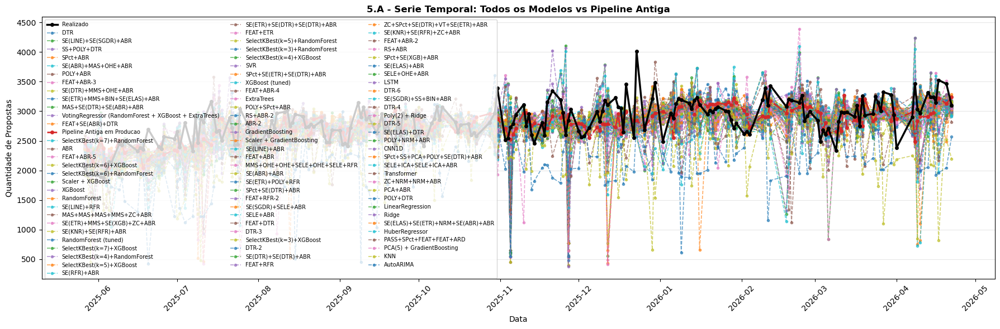

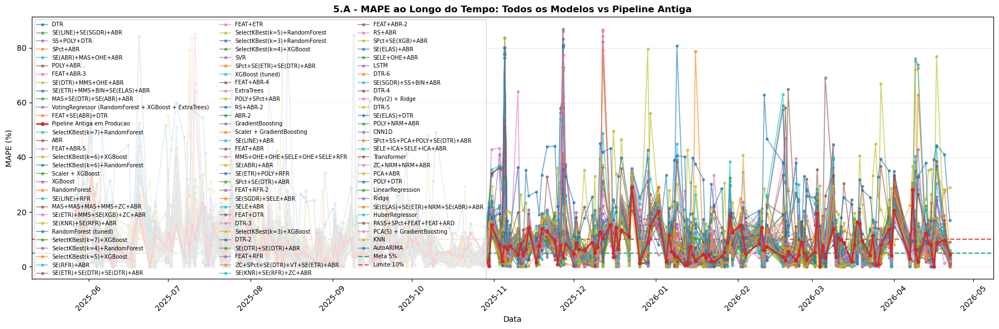

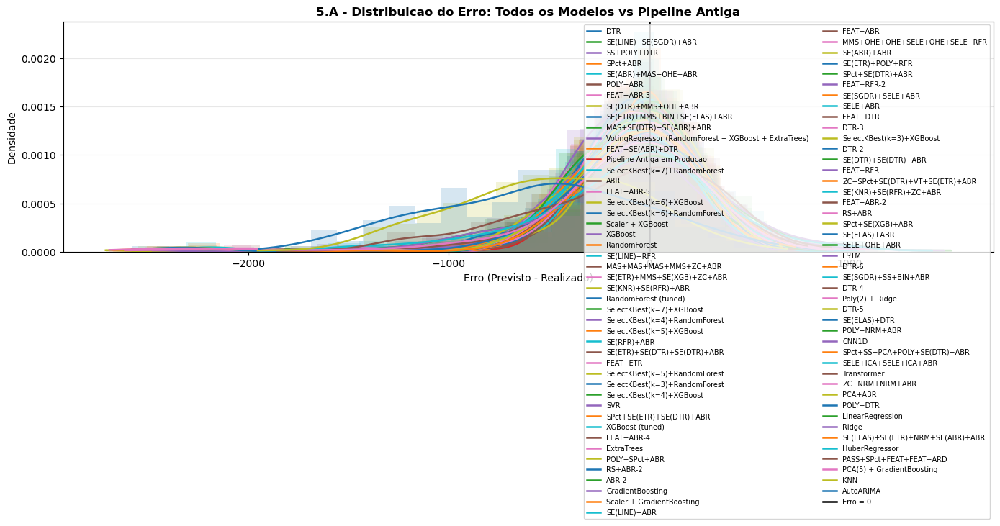

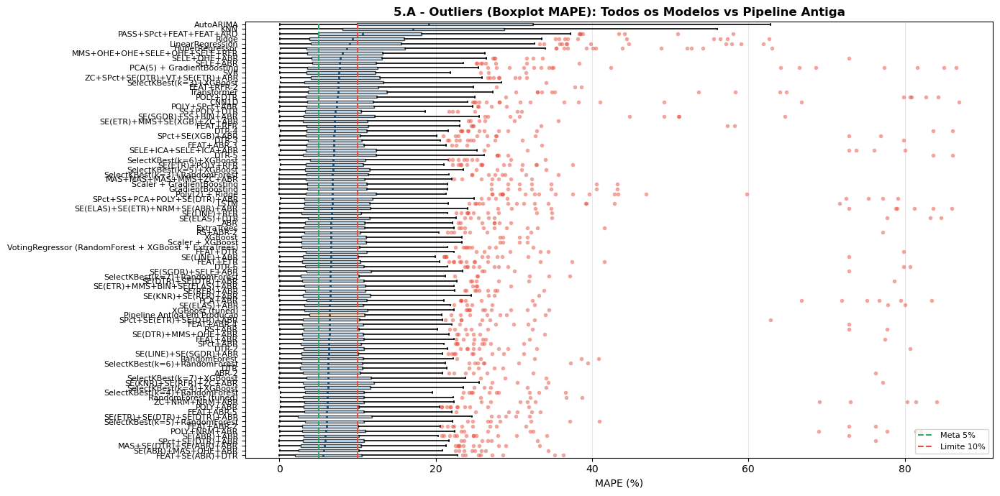

In [39]:
# ============================================================
# HELPERS DAS 4 PARTES (comparar_modelo / comparar_todos_modelos)
# ------------------------------------------------------------
# Estrutura portada do experimento_sarimax.ipynb (secao 1.2):
#  - _recorte_desde_mes      : filtra a base de <mes>/<ano> em diante (default:
#                               janeiro do ano mais recente -> "janeiro em diante").
#  - _metricas_bloco / metricas_por_mes : bloco de metricas (MAPE/RMSPE/R2/Vies/...)
#                               por mes-calendario, para UM modelo.
#  - _quadro_metricas_periodo : tabela de metricas (nome do modelo numa COLUNA,
#                               nunca no indice) sobre um recorte -- usada pelas
#                               4 partes de comparar_modelo/comparar_todos_modelos.
#  - plot_metricas_mes        : evolucao mensal das metricas de UM modelo, com
#                               overlay opcional da Pipeline Antiga (comparar_antiga).
#  - comparar_todos_modelos   : comparacao em 4 partes p/ QUALQUER subconjunto de
#                               modelos (indice de `ranking`) -- usada na 5.A (todos)
#                               e na Top 5 (ranking restrito aos 5 melhores).
#  - comparar_modelo          : mesma comparacao em 4 partes p/ um modelo (ou uma
#                               lista -- roda a sequencia uma vez por nome) vs
#                               Realizado vs Pipeline Antiga.
# ============================================================
def _recorte_desde_mes(df_det, mes=1, ano=None):
    """Filtra df_det de <mes>/<ano> em diante. ano=None usa o ano mais recente
    presente na base (recorte 'de janeiro em diante')."""
    d  = df_det.copy()
    dp = pd.to_datetime(d['Dia Prevista'])
    if not len(dp):
        return d.iloc[0:0]
    if ano is None:
        ano = int(dp.dt.year.max())
    _corte = pd.Timestamp(year=ano, month=mes, day=1)
    return d[dp >= _corte].copy()


def _metricas_bloco(_g):
    """Bloco de metricas (MAPE/RMSPE/R2/Vies/MAE/DP...) sobre um subconjunto de linhas."""
    _g  = _g.dropna(subset=['Valor Previsto', 'Valor Realizado'])
    _mp = pd.to_numeric(_g['MAPE (%)'], errors='coerce').dropna().tolist()
    if not _mp:
        return None
    _r   = pd.to_numeric(_g['Valor Realizado'], errors='coerce').astype(float)
    _p   = pd.to_numeric(_g['Valor Previsto'],  errors='coerce').astype(float)
    _dif = _r - _p
    _ssr = float(((_r - _p) ** 2).sum()); _sst = float(((_r - _r.mean()) ** 2).sum())
    _n   = len(_mp)
    return {
        'MAPE Medio (%)':   round(float(np.mean(_mp)), 2),
        'RMSPE (%)':        round(float(np.sqrt(np.mean(np.square(_mp)))), 2),
        'R2':               round(1 - _ssr / _sst, 3) if _sst != 0 else np.nan,
        'Vies (real-prev)': round(float(_dif.mean()), 1),
        '|Vies|':           round(abs(float(_dif.mean())), 1),
        'Vies % (MPE)':     round(float(((_r - _p) / _r.replace(0, np.nan)).mean() * 100), 2),
        'MAE':              round(float(_dif.abs().mean()), 1),
        'DP Erro':          round(float(_dif.std(ddof=0)), 1),
        'CV Erro (%)':      round(float(_dif.std(ddof=0) / _r.mean() * 100), 2) if float(_r.mean()) != 0 else np.nan,
        'Mediana (%)':      round(float(np.median(_mp)), 2),
        'Min (%)':          round(float(np.min(_mp)), 2),
        'Max (%)':          round(float(np.max(_mp)), 2),
        '< 5%':             f"{sum(m <  5 for m in _mp)}/{_n}",
        '< 10%':            f"{sum(m < 10 for m in _mp)}/{_n}",
        'N':                _n,
    }


def metricas_por_mes(modelo, df_det=None, incluir_total=True):
    """Metricas de ranking mes a mes para UM modelo (nome numa COLUNA 'Modelo', nunca no
    indice). df_det default = _df_db da area corrente; a linha 'TOTAL' agrega todos os meses."""
    if df_det is None:
        df_det = _df_db
    _s = df_det[df_det['Modelo'] == modelo].copy()
    if _s.empty:
        raise ValueError(f"Modelo '{modelo}' nao encontrado. Disponiveis: {sorted(df_det['Modelo'].unique())}")
    _s['Dia Prevista'] = pd.to_datetime(_s['Dia Prevista'])
    _s['Mes'] = _s['Dia Prevista'].dt.to_period('M').astype(str)
    _linhas = {}
    for _mes, _g in _s.groupby('Mes'):
        _b = _metricas_bloco(_g)
        if _b is not None:
            _linhas[_mes] = _b
    if incluir_total:
        _b = _metricas_bloco(_s)
        if _b is not None:
            _linhas['TOTAL'] = _b
    _df = pd.DataFrame(_linhas).T
    _df.index.name = 'Mes'; _df = _df.reset_index()
    _df.insert(0, 'Modelo', modelo)
    return _df


def _quadro_metricas_periodo(df_det, modelos, periodo_label):
    """Quadro de metricas do periodo: uma linha por modelo (nome na COLUNA 'Modelo',
    nunca no indice) usando o mesmo bloco de metricas dos rankings. Exibe e retorna."""
    _linhas = {}
    for _nome in modelos:
        _b = _metricas_bloco(df_det[df_det['Modelo'] == _nome])
        if _b is not None:
            _linhas[_nome] = _b
    if not _linhas:
        print(f'   (sem dados de metricas no periodo: {periodo_label})')
        return None
    _df = pd.DataFrame(_linhas).T
    _df.index.name = 'Modelo'
    _df = _df.reset_index()
    print(f'\n-- Metricas do periodo -- {periodo_label}:')
    display(_df)
    return _df


_METRICAS_PLOT = ['MAPE Medio (%)', 'RMSPE (%)', 'R2', 'Vies (real-prev)',
                  '|Vies|', 'Vies % (MPE)', 'MAE', 'DP Erro', 'CV Erro (%)',
                  'Mediana (%)', 'Min (%)', 'Max (%)', 'N']


def plot_metricas_mes(modelo, metricas=('MAPE Medio (%)',), df_det=None,
                      comparar_antiga=True, subplots=True, figsize=None):
    """Evolucao mensal das metricas de UM modelo (eixo X = meses). Se comparar_antiga,
    sobrepoe a Pipeline Antiga (tracejada) na mesma metrica. A linha 'TOTAL' fica de fora."""
    if isinstance(metricas, str):
        metricas = [metricas]
    metricas = list(metricas)
    _inv = [m for m in metricas if m not in _METRICAS_PLOT]
    if _inv:
        raise ValueError(f'Metrica(s) invalida(s): {_inv}. Disponiveis: {_METRICAS_PLOT}')
    _src = _df_db if df_det is None else df_det
    _fontes = [(modelo, '-')]
    if comparar_antiga and modelo != NOME_ANTIGO and NOME_ANTIGO in _src['Modelo'].unique():
        _fontes.append((NOME_ANTIGO, '--'))
    _dados = {}
    for _nome, _ls in _fontes:
        _d = metricas_por_mes(_nome, df_det=_src, incluir_total=False)
        for _m in metricas:
            _d[_m] = pd.to_numeric(_d[_m], errors='coerce')
        _dados[_nome] = _d.set_index('Mes')
    _x = sorted(set().union(*[set(_d.index) for _d in _dados.values()]))
    _ls_de = {_nome: _ls for _nome, _ls in _fontes}
    _zero  = ('Vies (real-prev)', 'Vies % (MPE)')
    _multi = len(_fontes) > 1
    _ser   = lambda _nome, _m: _dados[_nome].reindex(_x)[_m]
    if subplots:
        _n = len(metricas)
        fig, axes = plt.subplots(_n, 1, sharex=True,
                                 figsize=figsize or (max(7, len(_x) * 0.9), 2.6 * _n))
        axes = np.atleast_1d(axes)
        for _ax, _m in zip(axes, metricas):
            for _nome in _dados:
                _ax.plot(_x, _ser(_nome, _m), marker='o', ls=_ls_de[_nome], label=_nome)
            _ax.set_ylabel(_m); _ax.grid(True, alpha=0.3)
            if _m in _zero:
                _ax.axhline(0, color='red', lw=0.8, ls=':', alpha=0.6)
            _ax.legend(fontsize=8)
        axes[0].set_title(f'Evolucao mensal das metricas -- {modelo}')
        axes[-1].set_xlabel('Mes')
    else:
        _cores = plt.rcParams['axes.prop_cycle'].by_key()['color']
        fig, _ax = plt.subplots(figsize=figsize or (max(7, len(_x) * 0.9), 5))
        for _i, _m in enumerate(metricas):
            for _nome in _dados:
                _ax.plot(_x, _ser(_nome, _m), marker='o', color=_cores[_i % len(_cores)],
                         ls=_ls_de[_nome], label=f'{_m} ({_nome})' if _multi else _m)
        if any(_m in _zero for _m in metricas):
            _ax.axhline(0, color='red', lw=0.8, ls=':', alpha=0.6)
        _ax.set_xlabel('Mes'); _ax.set_ylabel('Valor')
        _ax.set_title(f'Evolucao mensal das metricas -- {modelo}')
        _ax.grid(True, alpha=0.3); _ax.legend(fontsize=8)
    plt.tight_layout(); plt.show()
    _out = []
    for _nome in _dados:
        _t = _dados[_nome].reindex(_x)[metricas].copy()
        _t.insert(0, 'Fonte', _nome)
        _out.append(_t)
    return pd.concat(_out).reset_index()


def comparar_todos_modelos(_df_db, ranking, unidade, titulo='5.B', ranking_orig=None):
    """Comparacao de TODOS os modelos de `ranking.index`, estruturada em 4 partes
    (estilo experimento_sarimax): passe o ranking completo (ex.: df_ranking_int) para
    comparar todos os modelos, ou um recorte (ex.: df_ranking_int.loc[_top5_ref]) para
    restringir a comparacao a um subconjunto (Top 5 + Pipeline Antiga).
      Parte 1 - historico completo   : serie/MAPE/vies ao longo do tempo + quadro de metricas
      Parte 2 - janeiro em diante     : mesmos graficos + quadro do periodo
      Parte 3 - recorte de marco      : mesmos graficos + quadro do periodo
      Parte 4 - distribuicoes, RMSPE e trade-off vies x variancia (base completa)."""
    global _UNID
    _UNID = unidade
    modelos = list(ranking.index)
    print(f'{titulo} - comparacao de modelos:')
    display(_com_modelo(ranking))

    def _parte(_dsub, _lab):
        if not _dsub['Dia Prevista'].nunique():
            print(f'\n### {titulo} | {_lab}: sem dias no periodo -- omitido')
            return
        print(f'\n{"=" * 84}\n### {titulo} | {_lab}\n{"=" * 84}')
        _plot_serie_temporal(_dsub, modelos, title=f'{titulo} - Serie: modelos vs Realizado ({_lab})')
        _plot_mape_temporal(_dsub, modelos, title=f'{titulo} - MAPE ao longo do tempo ({_lab})')
        _plot_vies_temporal(_dsub, modelos, title=f'{titulo} - Vies ao longo do tempo ({_lab})')
        _quadro_metricas_periodo(_dsub, modelos, _lab)

    _parte(_df_db,                            'Parte 1 - Historico completo')
    _parte(_recorte_desde_mes(_df_db, mes=1), 'Parte 2 - Janeiro em diante')
    _parte(_recorte_mes(_df_db, mes=3),       'Parte 3 - Recorte de marco')

    print(f'\n{"=" * 84}\n### {titulo} | Parte 4 - Distribuicoes, RMSPE e trade-off (base completa)\n{"=" * 84}')
    _plot_dist_erro(_df_db, modelos, title=f'{titulo} - Distribuicao do erro')
    _plot_outliers(_df_db, modelos,  title=f'{titulo} - Boxplot do MAPE por modelo (ordenado pela mediana)')
    _plot_rmspe_bar(_df_db, modelos, title=f'{titulo} - RMSPE por modelo')
    _plot_tradeoff_vies_var(ranking, modelos, ranking_orig=ranking_orig,
                            title=f'{titulo} - Trade-off Vies x Variancia (escala completa)')
    _plot_tradeoff_vies_var(ranking, modelos, ranking_orig=ranking_orig, equal_aspect=False,
                            title=f'{titulo} - Trade-off Vies x Variancia (eixo X reescalado)')


def comparar_modelo(nome, mes_recorte=3, df_det=None, ranking=None, ranking_orig=None):
    """Comparacao individual em 4 partes (estilo experimento_sarimax) para UM modelo
    (ou uma lista de nomes -- roda a sequencia completa uma vez por nome) vs Realizado
    vs Pipeline Antiga:
      Parte 1 - historico completo   : serie/MAPE/vies ao longo do tempo + quadro de metricas
      Parte 2 - janeiro em diante     : mesmos graficos + quadro do periodo
      Parte 3 - recorte de <mes_recorte> (default marco): mesmos graficos + quadro do periodo
      Parte 4 - distribuicoes, RMSPE, trade-off e evolucao mensal (base completa).
    Ao final, imprime as metricas comparativas de cada modelo contra a Pipeline Antiga."""
    global _ENFASE_CAND, _COR_REAL
    df_det  = _df_db          if df_det  is None else df_det
    ranking = df_ranking_int  if ranking is None else ranking
    _nomes = [nome] if isinstance(nome, str) else list(nome)
    _disp  = sorted(df_det['Modelo'].unique())
    _falta = [n for n in _nomes if n not in _disp]
    if _falta:
        print(f'Modelo(s) nao encontrado(s): {_falta}. Disponiveis:')
        for _m in _disp:
            print(f'  - {_m}')
        return

    _save_enf  = globals().get('_ENFASE_CAND')
    _save_real = globals().get('_COR_REAL')
    _ENFASE_CAND = True
    _COR_REAL    = '#666666'
    try:
        for _nome in _nomes:
            _sel = [_nome] + ([NOME_ANTIGO] if _nome != NOME_ANTIGO and NOME_ANTIGO in _disp else [])

            def _parte(_dsub, _lab, _nome=_nome, _sel=_sel):
                if not _dsub['Dia Prevista'].nunique():
                    print(f'\n### 5.D - {_nome} | {_lab}: sem dias no periodo -- omitido')
                    return
                print(f'\n{"=" * 84}\n### 5.D - {_nome} | {_lab}\n{"=" * 84}')
                _plot_serie_temporal(_dsub, _sel,
                                     title=f'5.D - {_nome} ({_lab}): Serie - Previsto vs Realizado vs Pipeline Antiga')
                _plot_mape_temporal(_dsub, _sel, title=f'5.D - {_nome} ({_lab}): MAPE ao Longo do Tempo')
                _plot_vies_temporal(_dsub, _sel, title=f'5.D - {_nome} ({_lab}): Vies ao Longo do Tempo')
                _quadro_metricas_periodo(_dsub, _sel, _lab)

            _mes_lab = 'marco' if mes_recorte == 3 else f'mes {mes_recorte}'
            _parte(df_det,                                'Parte 1 - Historico completo')
            _parte(_recorte_desde_mes(df_det, mes=1),     'Parte 2 - Janeiro em diante')
            _parte(_recorte_mes(df_det, mes=mes_recorte), f'Parte 3 - Recorte de {_mes_lab}')

            print(f'\n{"=" * 84}\n### 5.D - {_nome} | Parte 4 - Distribuicoes, RMSPE e trade-off (base completa)\n{"=" * 84}')
            _plot_dist_erro(df_det, _sel, title=f'5.D - {_nome}: Distribuicao do Erro')
            _plot_outliers(df_det, _sel,  title=f'5.D - {_nome}: Boxplot do MAPE - {_nome} vs Pipeline Antiga')
            _plot_rmspe_bar(df_det, _sel, title=f'5.D - {_nome}: RMSPE - Modelo vs Pipeline Antiga')
            _plot_tradeoff_vies_var(ranking, _sel,
                                    title=f'5.D - {_nome}: Trade-off Vies x Variancia (escala completa)')
            if ranking_orig is not None:
                _plot_tradeoff_vies_var(ranking, _sel, ranking_orig=ranking_orig, equal_aspect=False,
                                        title=f'5.D - {_nome}: Trade-off Vies x Variancia (eixo X reescalado, com/sem correcao)')

            try:
                print(f'\n-- Metricas por mes -- {_nome}:')
                display(metricas_por_mes(_nome, df_det=df_det))
                if NOME_ANTIGO in _disp and _nome != NOME_ANTIGO:
                    plot_metricas_mes(_nome, ['MAPE Medio (%)', 'RMSPE (%)', 'Vies (real-prev)', 'R2'],
                                      df_det=df_det, comparar_antiga=True, subplots=True)
            except Exception as _e:
                print(f'[metricas por mes] falhou: {_e}')
    finally:
        _ENFASE_CAND = _save_enf
        _COR_REAL    = _save_real

    # ---- Metricas comparativas (cada modelo vs Pipeline Antiga) ----
    if NOME_ANTIGO not in ranking.index:
        print('[metricas] Pipeline Antiga ausente no ranking -- comparativo omitido')
        return
    _met   = ['MAPE Medio (%)', 'RMSPE (%)', 'R2', 'Vies (real-prev)', '|Vies|',
              'MAE', 'DP Erro', 'Mediana (%)', 'N']
    _menor = {'MAPE Medio (%)', 'RMSPE (%)', '|Vies|', 'MAE', 'DP Erro', 'Mediana (%)'}  # menor = melhor
    _maior = {'R2'}                                                                       # maior = melhor
    _ra = ranking.loc[NOME_ANTIGO]
    for _nome in _nomes:
        if _nome not in ranking.index:
            print(f'[metricas] {_nome} ausente no ranking -- comparativo omitido')
            continue
        _rm = ranking.loc[_nome]
        print('=' * 84)
        print(f'COMPARATIVO  |  {_nome}   vs   {NOME_ANTIGO}')
        print('=' * 84)
        print(f'{"Metrica":<18}{"Modelo":>16}{"Pipeline Antiga":>18}{"Delta":>14}   Resultado')
        print('-' * 84)
        for _c in _met:
            if _c not in ranking.columns:
                continue
            _vm, _va = _rm[_c], _ra[_c]
            try:
                _d = float(_vm) - float(_va)
                if _c in _menor:
                    _res = 'melhor' if _d < 0 else ('igual' if _d == 0 else 'pior')
                elif _c in _maior:
                    _res = 'melhor' if _d > 0 else ('igual' if _d == 0 else 'pior')
                else:
                    _res = ''
                _ds = f'{_d:+.2f}'
            except (TypeError, ValueError):
                _ds, _res = '-', ''
            print(f'{_c:<18}{str(_vm):>16}{str(_va):>18}{_ds:>14}   {_res}')
        print('=' * 84)


print('comparar_modelo / comparar_todos_modelos / metricas_por_mes / plot_metricas_mes OK')

# ============================================================
# FUNCOES DE VISUALIZACAO (reutilizadas em 5.A, 5.B e 5.C)
# ============================================================
try:
    from scipy.stats import gaussian_kde as _gaussian_kde
    _HAS_SCIPY = True
except ImportError:
    _HAS_SCIPY = False

# ============================================================
# PALETA DE CORES (alto contraste) -- usada por todos os _plot_*
# ------------------------------------------------------------
# Pipeline Antiga sempre em vermelho; candidatos puxam de uma paleta
# qualitativa bem separada (sem os pares claro/escuro do tab20, sem
# vermelho e sem preto -- reservados a Antiga e ao Realizado).
# ============================================================
_COR_ANTIGA = '#d62728'   # vermelho forte (sempre a Pipeline Antiga)
_PALETA_MODELOS = [
    '#1f77b4',  # azul
    '#2ca02c',  # verde
    '#9467bd',  # roxo
    '#ff7f0e',  # laranja
    '#17becf',  # ciano
    '#8c564b',  # marrom
    '#e377c2',  # rosa
    '#bcbd22',  # oliva
]
def _cor_modelos(modelos):
    """Mapa nome->cor estavel: Antiga em vermelho; demais na paleta, na ordem."""
    cores, k = {}, 0
    for m in modelos:
        if m == NOME_ANTIGO:
            cores[m] = '#b0b0b0' if globals().get('_ENFASE_CAND') else _COR_ANTIGA
        else:
            cores[m] = _PALETA_MODELOS[k % len(_PALETA_MODELOS)]
            k += 1
    return cores

# ============================================================
# ENFASE CONFIGURAVEL (usada por comparar_modelo p/ destacar os modelos novos)
# ------------------------------------------------------------
# Quando _ENFASE_CAND=True a hierarquia visual fica: modelos novos > Realizado >
# Pipeline Antiga. _cor_modelos ja deixa a Antiga cinza-claro; _estilo_real e
# _estilo_linha cuidam de espessura/alpha/zorder e da cor do Realizado.
# ============================================================
_COR_REAL    = 'black'    # cor da serie Realizado (comparar_modelo deixa cinza)
_ENFASE_CAND = False      # True: candidatos em destaque; Realizado e Antiga ao fundo

def _estilo_real():
    """(cor, lw, zorder) da serie Realizado conforme a enfase ativa."""
    if globals().get('_ENFASE_CAND'):
        return globals().get('_COR_REAL', '#666666'), 2.2, 5
    return 'black', 2.5, 5

def _estilo_linha(nome):
    """(lw, ls, ms, alpha, zorder) da serie de um modelo conforme a enfase ativa."""
    _ref = (nome == NOME_ANTIGO)
    if globals().get('_ENFASE_CAND'):
        if _ref:                      # Pipeline Antiga ao fundo
            return 1.0, ':', 3, 0.45, 2
        return 2.6, '-', 5, 1.0, 6    # candidatos (modelos novos) em destaque
    if _ref:                          # comportamento original
        return 2.0, '-.', 4, 0.95, 4
    return 1.2, '--', 3, 0.65, 3

def _plot_serie_temporal(df_det, modelos, title='Serie Temporal', figsize=(18, 6)):
    _sub_all = df_det[df_det['Modelo'].isin(modelos)].copy()
    fig, ax = plt.subplots(figsize=figsize)
    _real = _sub_all.drop_duplicates('Dia Prevista').sort_values('Dia Prevista')
    _crl, _rlw, _rz = _estilo_real()
    ax.plot(_real['Dia Prevista'], _real['Valor Realizado'].astype(float),
            color=_crl, lw=_rlw, marker='o', ms=4, zorder=_rz, label='Realizado')
    _cores = _cor_modelos(modelos)
    for j, nome in enumerate(modelos):
        sub = _sub_all[_sub_all['Modelo'] == nome].sort_values('Dia Prevista')
        if sub.empty: continue
        _lw, _ls, _ms, _al, _zo = _estilo_linha(nome)
        ax.plot(sub['Dia Prevista'], sub['Valor Previsto'].astype(float),
                lw=_lw, linestyle=_ls, marker='o', ms=_ms, alpha=_al, zorder=_zo,
                color=_cores[nome], label=nome)
    ax.set_xlabel('Data'); ax.set_ylabel('Quantidade de Propostas')
    ax.tick_params(axis='x', rotation=45)
    ax.legend(fontsize=7, ncol=3, loc='upper left')
    ax.set_title(title, fontweight='bold'); ax.grid(axis='y', alpha=0.3)
    plt.tight_layout(); plt.show()

def _plot_mape_temporal(df_det, modelos, title='MAPE ao Longo do Tempo', figsize=(18, 6)):
    fig, ax = plt.subplots(figsize=figsize)
    _cores = _cor_modelos(modelos)
    for j, nome in enumerate(modelos):
        sub = df_det[df_det['Modelo'] == nome].sort_values('Dia Prevista').dropna(subset=['MAPE (%)'])
        if sub.empty: continue
        _lw, _ls, _ms, _al, _zo = _estilo_linha(nome)
        ax.plot(sub['Dia Prevista'], sub['MAPE (%)'],
                lw=_lw, marker='o', ms=_ms, alpha=_al, zorder=_zo,
                color=_cores[nome], label=nome)
    ax.axhline(5,  color='#27ae60', linestyle='--', lw=1.5, label='Meta 5%')
    ax.axhline(10, color='#e74c3c', linestyle='--', lw=1.5, label='Limite 10%')
    ax.set_xlabel('Data'); ax.set_ylabel('MAPE (%)')
    ax.tick_params(axis='x', rotation=45)
    ax.legend(fontsize=7, ncol=3, loc='upper left')
    ax.set_title(title, fontweight='bold'); ax.grid(axis='y', alpha=0.3)
    plt.tight_layout(); plt.show()

def _plot_dist_erro(df_det, modelos, title='Distribuicao do Erro (Previsto - Realizado)', figsize=(14, 6)):
    fig, ax = plt.subplots(figsize=figsize)
    _cores = _cor_modelos(modelos)
    for j, nome in enumerate(modelos):
        erros = df_det[df_det['Modelo'] == nome]['Erro'].dropna()
        if len(erros) < 3: continue
        color = _cores[nome]
        ax.hist(erros, bins=20, alpha=0.18, color=color, density=True)
        if _HAS_SCIPY:
            try:
                _xs  = np.linspace(erros.min(), erros.max(), 250)
                _kde = _gaussian_kde(erros)
                ax.plot(_xs, _kde(_xs), lw=1.8, color=color, label=nome)
            except Exception:
                ax.axvline(erros.mean(), lw=1.2, color=color, linestyle='--', label=nome)
        else:
            _cnts, _edges = np.histogram(erros, bins=20, density=True)
            _mids = (_edges[:-1] + _edges[1:]) / 2
            ax.plot(_mids, _cnts, lw=1.5, color=color, label=nome)
    ax.axvline(0, color='black', linestyle='-', lw=1.8, label='Erro = 0')
    ax.set_xlabel('Erro (Previsto - Realizado)'); ax.set_ylabel('Densidade')
    ax.legend(fontsize=7, ncol=2, loc='upper right')
    ax.set_title(title, fontweight='bold'); ax.grid(axis='y', alpha=0.3)
    plt.tight_layout(); plt.show()

def _plot_outliers(df_det, modelos, title='Outliers - Distribuicao do MAPE por Modelo', figsize=(14, 7)):
    _pares = [(df_det[df_det['Modelo'] == n]['MAPE (%)'].dropna().values, n) for n in modelos]
    _pares = [(d, l) for d, l in _pares if len(d) > 0]
    if not _pares: return
    _pares.sort(key=lambda x: np.median(x[0]))
    _data, _labels = zip(*_pares)
    fig, ax = plt.subplots(figsize=figsize)
    bp = ax.boxplot(_data, vert=False, patch_artist=True,
                    boxprops=dict(facecolor='#aed6f1', alpha=0.7),
                    medianprops=dict(color='#1a5276', lw=2.0),
                    whiskerprops=dict(lw=1.2), capprops=dict(lw=1.2),
                    flierprops=dict(marker='o', ms=4, alpha=0.5,
                                    markerfacecolor='#e74c3c', markeredgewidth=0))
    if NOME_ANTIGO in _labels:
        _idx = list(_labels).index(NOME_ANTIGO)
        if globals().get('_ENFASE_CAND'):
            bp['boxes'][_idx].set_facecolor('#d9d9d9')   # Antiga ao fundo
            bp['medians'][_idx].set_color('#7f7f7f')
        else:
            bp['boxes'][_idx].set_facecolor('#f9d5a7')
            bp['medians'][_idx].set_color('#7d3c00')
    ax.set_yticklabels(_labels, fontsize=8)
    ax.axvline(5,  color='#27ae60', linestyle='--', lw=1.5, label='Meta 5%')
    ax.axvline(10, color='#e74c3c', linestyle='--', lw=1.5, label='Limite 10%')
    ax.set_xlabel('MAPE (%)')
    ax.legend(fontsize=8, loc='lower right')
    ax.set_title(title, fontweight='bold'); ax.grid(axis='x', alpha=0.3)
    plt.tight_layout(); plt.show()


# ============================================================
# NOVAS FUNCOES DE VISUALIZACAO (usadas em 5.C e 5.D)
# ------------------------------------------------------------
# _recorte_mes      : filtra a base para um unico mes (default marco)
# _plot_rmspe_temporal : RMSPE rolling ao longo do tempo
# _plot_vies_temporal  : vies diario (Realizado - Previsto) ao longo do tempo
# _plot_rmspe_bar      : RMSPE por modelo (substitui o boxplot de MAPE na 5.C)
# ============================================================
def _recorte_mes(df_det, mes=3, ano=None):
    """Filtra df_det para um unico mes. Se ano=None, usa o ano mais recente
    presente para aquele mes (evita misturar marco de anos diferentes)."""
    d  = df_det.copy()
    dp = pd.to_datetime(d['Dia Prevista'])
    if ano is None:
        _anos = sorted(dp[dp.dt.month == mes].dt.year.unique())
        if not len(_anos):
            return d.iloc[0:0]
        ano = int(_anos[-1])
    return d[(dp.dt.month == mes) & (dp.dt.year == ano)].copy()

def _plot_rmspe_temporal(df_det, modelos, title='RMSPE (rolling) ao Longo do Tempo',
                         figsize=(18, 6), win=None):
    """RMSPE em janela movel: sqrt(media movel do APE^2). Penaliza erros grandes
    mais do que o MAPE. Uma linha por modelo (janela = win, default 10 dias)."""
    win = int(win or 10)
    _minp = max(2, win // 3)
    fig, ax = plt.subplots(figsize=figsize)
    _cores = _cor_modelos(modelos)
    for j, nome in enumerate(modelos):
        sub = df_det[df_det['Modelo'] == nome].sort_values('Dia Prevista').dropna(subset=['MAPE (%)'])
        if sub.empty: continue
        _ape2  = sub['MAPE (%)'].astype(float) ** 2
        _rmspe = np.sqrt(_ape2.rolling(win, min_periods=_minp).mean())
        _lw, _ls, _ms, _al, _zo = _estilo_linha(nome)
        ax.plot(sub['Dia Prevista'], _rmspe,
                lw=_lw, marker='o', ms=_ms, alpha=_al, zorder=_zo,
                color=_cores[nome], label=nome)
    ax.axhline(5,  color='#27ae60', linestyle='--', lw=1.5, label='Meta 5%')
    ax.axhline(10, color='#e74c3c', linestyle='--', lw=1.5, label='Limite 10%')
    ax.set_xlabel('Data'); ax.set_ylabel(f'RMSPE (%) -- janela {win}d')
    ax.tick_params(axis='x', rotation=45)
    ax.legend(fontsize=7, ncol=3, loc='upper left')
    ax.set_title(title, fontweight='bold'); ax.grid(axis='y', alpha=0.3)
    plt.tight_layout(); plt.show()

def _plot_vies_temporal(df_det, modelos, title='Vies ao Longo do Tempo', figsize=(18, 6)):
    """Vies diario (Realizado - Previsto) ao longo do tempo. >0 subestima, <0 superestima.
    Uma linha por modelo + linha de referencia em 0."""
    _unid = globals().get('_UNID', '')
    fig, ax = plt.subplots(figsize=figsize)
    _cores = _cor_modelos(modelos)
    for j, nome in enumerate(modelos):
        sub = (df_det[df_det['Modelo'] == nome].sort_values('Dia Prevista')
               .dropna(subset=['Valor Previsto', 'Valor Realizado']))
        if sub.empty: continue
        _vies = (pd.to_numeric(sub['Valor Realizado'], errors='coerce').astype(float) -
                 pd.to_numeric(sub['Valor Previsto'],  errors='coerce').astype(float))
        _lw, _ls, _ms, _al, _zo = _estilo_linha(nome)
        ax.plot(sub['Dia Prevista'], _vies,
                lw=_lw, marker='o', ms=_ms, alpha=_al, zorder=_zo,
                color=_cores[nome], label=nome)
    ax.axhline(0, color='black', linestyle='-', lw=1.8, label='Vies = 0 (ideal)')
    ax.set_xlabel('Data')
    ax.set_ylabel('Vies (Realizado - Previsto)' + (f' -- {_unid}' if _unid else ''))
    ax.tick_params(axis='x', rotation=45)
    ax.legend(fontsize=7, ncol=3, loc='upper left')
    ax.set_title(title, fontweight='bold'); ax.grid(axis='y', alpha=0.3)
    plt.tight_layout(); plt.show()

def _plot_rmspe_bar(df_det, modelos, title='RMSPE por Modelo', figsize=(14, 7)):
    """Barras horizontais do RMSPE por modelo (menor = melhor, ordenado).
    Substitui o boxplot de MAPE na 5.C porque o RMSPE e um escalar por modelo."""
    _vals = {}
    for nome in modelos:
        _ape = df_det[df_det['Modelo'] == nome]['MAPE (%)'].dropna().astype(float)
        if len(_ape) == 0: continue
        _vals[nome] = float(np.sqrt(np.mean(_ape ** 2)))
    if not _vals: return
    _items  = sorted(_vals.items(), key=lambda kv: kv[1])
    _labels = [k for k, _ in _items]
    _data   = [v for _, v in _items]
    fig, ax = plt.subplots(figsize=figsize)
    _cores_bar = _cor_modelos(_labels)
    _colors = [_cores_bar[l] for l in _labels]
    ax.barh(range(len(_labels)), _data, color=_colors, alpha=0.85)
    for i, v in enumerate(_data):
        ax.text(v, i, f' {v:.2f}%', va='center', fontsize=8)
    ax.set_yticks(range(len(_labels))); ax.set_yticklabels(_labels, fontsize=8)
    ax.invert_yaxis()   # melhor (menor RMSPE) no topo
    ax.axvline(5,  color='#27ae60', linestyle='--', lw=1.5, label='Meta 5%')
    ax.axvline(10, color='#e74c3c', linestyle='--', lw=1.5, label='Limite 10%')
    ax.set_xlabel('RMSPE (%)')
    ax.legend(fontsize=8, loc='lower right')
    ax.set_title(title, fontweight='bold'); ax.grid(axis='x', alpha=0.3)
    plt.tight_layout(); plt.show()

# ============================================================

def _plot_tradeoff_vies_var(ranking, modelos, title='Trade-off Vies x Variancia',
                            figsize=(10, 9), col_vies='|Vies|', col_disp='DP Erro',
                            ranking_orig=None, equal_aspect=True, iso=None,
                            anchor_origin=None, xmax=None):
    """Trade-off vies x variancia por modelo (um ponto = um modelo).
    Decomposicao do erro quadratico medio: MSE = Vies^2 + Var(erro), logo
    RMSE = sqrt(|Vies|^2 + DP^2) = distancia euclidiana do ponto a origem.
      eixo x = |Vies| medio   (componente sistematica / vies)
      eixo y = DP do erro      (raiz da variancia / dispersao)
    ranking_orig  : se fornecido, plota tambem os modelos de um ranking alternativo (vazados)
                    ligados por seta ao ponto corrigido.
    equal_aspect  : True  -> eixos na mesma escala, ancorados em 0, iso-linhas de RMSE.
                    False -> eixos independentes escalados pela dispersao (zoom).
    iso           : desenha as iso-linhas de RMSE (default = equal_aspect).
    anchor_origin : ancora os eixos no zero (default = equal_aspect)."""
    if iso is None:            iso = equal_aspect
    if anchor_origin is None:  anchor_origin = equal_aspect
    _faltam = [c for c in (col_vies, col_disp) if c not in ranking.columns]
    if _faltam:
        print(f'[tradeoff] colunas ausentes no ranking: {_faltam} -- grafico omitido')
        return
    _mods = [m for m in modelos if m in ranking.index]

    def _xy(rk, m):
        if rk is None or m not in rk.index:
            return None
        try:
            x = abs(float(rk.loc[m, col_vies])); y = float(rk.loc[m, col_disp])
        except (TypeError, ValueError):
            return None
        return (x, y) if (np.isfinite(x) and np.isfinite(y)) else None

    _corr = [(m, *p) for m in _mods for p in [_xy(ranking, m)] if p is not None]
    if not _corr:
        print('[tradeoff] sem dados validos -- grafico omitido'); return
    _has_orig = ranking_orig is not None and all(c in ranking_orig.columns for c in (col_vies, col_disp))
    _orig = [(m, *p) for m in _mods for p in [_xy(ranking_orig, m)] if (_has_orig and p is not None)]

    _cmap  = plt.cm.tab20
    _color = _cor_modelos(_mods)
    _allx  = [p[1] for p in _corr] + [p[1] for p in _orig]
    _ally  = [p[2] for p in _corr] + [p[2] for p in _orig]
    _rmse  = [np.hypot(p[1], p[2]) for p in _corr]
    _rmax  = max(_rmse) if _rmse else max(_allx + _ally + [1.0])

    fig, ax = plt.subplots(figsize=figsize)

    # iso-linhas de RMSE constante (so fazem sentido com eixos na mesma escala)
    if iso:
        _theta = np.linspace(0, np.pi / 2, 80)
        for _r in np.linspace(_rmax * 0.25, _rmax * 1.05, 4):
            ax.plot(_r * np.cos(_theta), _r * np.sin(_theta), color='#cccccc', lw=0.8, ls='--', zorder=1)
            ax.text(_r * np.cos(np.pi / 4), _r * np.sin(np.pi / 4), f' RMSE {_r:,.0f}',
                    color='#999999', fontsize=7, ha='left', va='bottom', zorder=1)

    # setas mostrando o efeito da correcao (sem correcao -> corrigido)
    _pos_corr = {m: (x, y) for m, x, y in _corr}
    for m, ox, oy in _orig:
        if m in _pos_corr:
            cx, cy = _pos_corr[m]
            ax.annotate('', xy=(cx, cy), xytext=(ox, oy),
                        arrowprops=dict(arrowstyle='->', color=_color[m], lw=1.0, alpha=0.5), zorder=2)

    # pontos SEM correcao (marcador vazado)
    for m, x, y in _orig:
        _is_ref = (m == NOME_ANTIGO)
        _big = (not _is_ref) if globals().get('_ENFASE_CAND') else _is_ref
        ax.scatter(x, y, s=170 if _big else 110, facecolors='none', edgecolors=_color[m],
                   lw=1.4, marker='D' if _is_ref else 'o', zorder=3)

    # pontos COM correcao (preenchido) + rotulo
    for m, x, y in _corr:
        _is_ref = (m == NOME_ANTIGO)
        _big = (not _is_ref) if globals().get('_ENFASE_CAND') else _is_ref
        ax.scatter(x, y, s=200 if _big else 120, color=_color[m],
                   edgecolor='black', lw=1.3 if _is_ref else 0.6,
                   marker='D' if _is_ref else 'o', zorder=4,
                   label=f'{m}  (RMSE {np.hypot(x, y):,.0f} | vies {x:,.0f} | dp {y:,.0f})')
        ax.annotate(m, (x, y), textcoords='offset points', xytext=(7, 4), fontsize=7, zorder=5)

    # limites / escala
    def _rng(vals, pad=0.12):
        lo, hi = float(min(vals)), float(max(vals))
        if hi <= lo:
            _d = (abs(hi) * 0.1) or 1.0; lo, hi = lo - _d, hi + _d
        _m = (hi - lo) * pad
        return lo - _m, hi + _m

    if equal_aspect:
        _lim = max(_allx + _ally + [_rmax]) * 1.15
        ax.set_xlim(0, _lim); ax.set_ylim(0, _lim)
        ax.set_aspect('equal', adjustable='box')
    elif anchor_origin:
        ax.set_xlim(0, (xmax if xmax is not None else max(_allx) * 1.15) or 1.0)
        ax.set_ylim(0, (max(_ally) * 1.15) or 1.0)
    else:
        # eixos independentes, cada um escalado pela dispersao real dos seus dados
        if xmax is not None:
            ax.set_xlim(0, xmax)
        else:
            ax.set_xlim(*_rng(_allx))
        ax.set_ylim(*_rng(_ally))

    # indicador de direcao de melhora (origem = ideal)
    if iso:
        ax.annotate('melhor', xy=(0, 0), xytext=(_rmax * 0.16, _rmax * 0.16),
                    arrowprops=dict(arrowstyle='->', color='#27ae60', lw=1.8),
                    color='#27ae60', fontsize=10, fontweight='bold', zorder=5)
    else:
        ax.annotate('melhor', xy=(0.03, 0.03), xytext=(0.17, 0.17), xycoords='axes fraction',
                    arrowprops=dict(arrowstyle='->', color='#27ae60', lw=1.8),
                    color='#27ae60', fontsize=10, fontweight='bold', zorder=5)

    # legenda auxiliar de estilo (preenchido = com correcao ; vazado = sem)
    if _orig:
        from matplotlib.lines import Line2D as _L2D
        _aux = [_L2D([0], [0], marker='o', color='gray', markerfacecolor='gray', ls='', label='com correcao'),
                _L2D([0], [0], marker='o', color='gray', markerfacecolor='none', ls='', label='sem correcao')]
        ax.add_artist(ax.legend(handles=_aux, fontsize=7, loc='lower right', title='estilo'))

    ax.set_xlabel('|Vies| medio  (componente sistematica)')
    ax.set_ylabel('DP do erro = raiz da variancia  (dispersao)')
    ax.set_title(title, fontweight='bold')
    ax.grid(alpha=0.25)
    ax.legend(fontsize=7, loc='upper right')
    plt.tight_layout(); plt.show()

# 5.A - GRAFICOS: TODOS OS MODELOS vs PIPELINE ANTIGA
# ============================================================
_modelos_5a = df_ranking_int.index.tolist()
print(f'Modelos na comparacao 5.A: {len(_modelos_5a)}\n')

_plot_serie_temporal(
    _df_db, _modelos_5a,
    title='5.A - Serie Temporal: Todos os Modelos vs Pipeline Antiga'
)
_plot_mape_temporal(
    _df_db, _modelos_5a,
    title='5.A - MAPE ao Longo do Tempo: Todos os Modelos vs Pipeline Antiga'
)
_plot_dist_erro(
    _df_db, _modelos_5a,
    title='5.A - Distribuicao do Erro: Todos os Modelos vs Pipeline Antiga'
)
_plot_outliers(
    _df_db, _modelos_5a,
    title='5.A - Outliers (Boxplot MAPE): Todos os Modelos vs Pipeline Antiga'
)


---
### 4.B - Top 5 - Afunilamento e Selecao Final

Compara os **5 melhores candidatos** contra a Pipeline Antiga, com analise detalhada.

4.B - Top 5 - comparacao de modelos:


,Modelo,Parte,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,...,Var Erro,Mediana (%),Desvio (%),Min (%),Max (%),< 5%,< 10%,< 50%,< 100%,N
0,DTR,P4,7.44,9.36,0.338,85.6,85.6,2.41,212.6,259.3,...,67230.3,6.28,5.68,0.0,28.64,81/211,146/211,211/211,211/211,211
1,SE(LINE)+SE(SGDR)+ABR,P4,7.41,9.49,0.345,59.6,59.6,1.38,208.4,264.9,...,70195.7,6.31,5.94,0.08,31.26,88/211,158/211,211/211,211/211,211
2,SS+POLY+DTR,P4,7.71,9.54,0.318,70.5,70.5,1.82,219.3,268.1,...,71853.8,7.2,5.61,0.01,31.0,73/211,153/211,211/211,211/211,211
3,SPct+ABR,P4,7.47,9.59,0.336,61.0,61.0,1.39,209.5,266.6,...,71062.7,6.34,6.02,0.07,31.26,85/211,154/211,211/211,211/211,211
4,SE(ABR)+MAS+OHE+ABR,P4,7.32,9.62,0.328,43.7,43.7,0.86,205.4,271.6,...,73760.6,5.7,6.25,0.05,34.42,96/211,156/211,211/211,211/211,211
5,Pipeline Antiga em Producao,REF,7.89,9.88,0.313,40.5,40.5,0.64,220.8,275.2,...,75745.5,6.42,5.95,0.01,34.06,87/211,152/211,211/211,211/211,211



### 4.B - Top 5 | Parte 1 - Historico completo


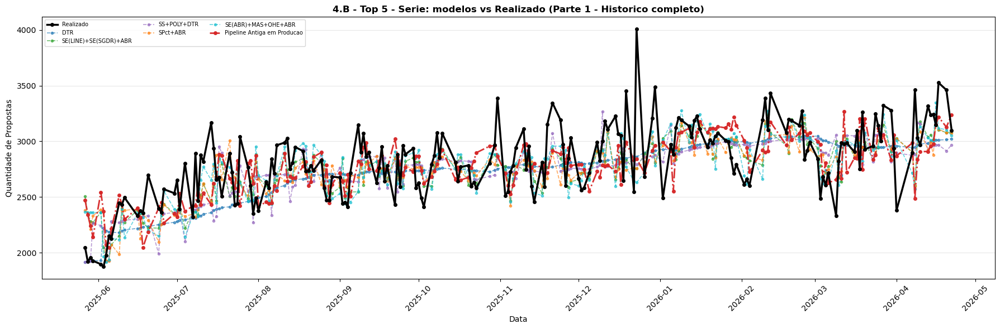

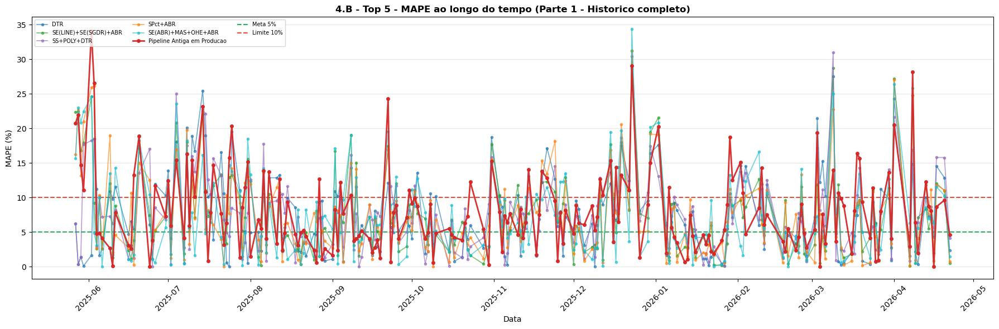

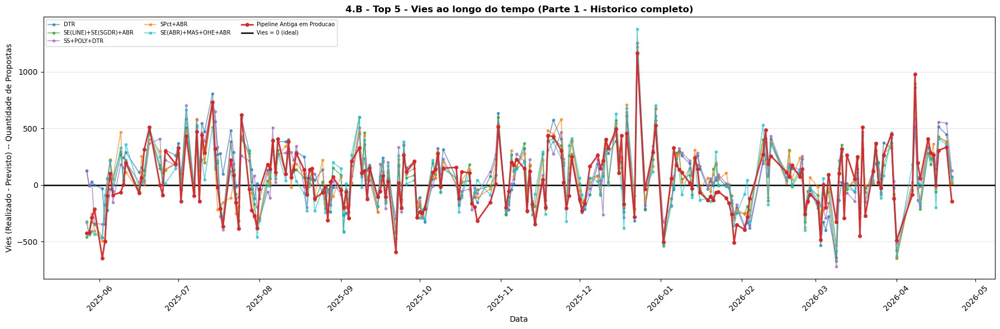


-- Metricas do periodo -- Parte 1 - Historico completo:


,Modelo,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,DTR,7.44,9.36,0.338,85.6,85.6,2.41,212.6,259.3,9.21,6.28,0.0,28.64,81/211,146/211,211
1,SE(LINE)+SE(SGDR)+ABR,7.41,9.49,0.345,59.6,59.6,1.38,208.4,264.9,9.42,6.31,0.08,31.26,88/211,158/211,211
2,SS+POLY+DTR,7.71,9.54,0.318,70.5,70.5,1.82,219.3,268.1,9.53,7.2,0.01,31.0,73/211,153/211,211
3,SPct+ABR,7.47,9.59,0.336,61.0,61.0,1.39,209.5,266.6,9.47,6.34,0.07,31.26,85/211,154/211,211
4,SE(ABR)+MAS+OHE+ABR,7.32,9.62,0.328,43.7,43.7,0.86,205.4,271.6,9.65,5.7,0.05,34.42,96/211,156/211,211
5,Pipeline Antiga em Producao,7.89,9.88,0.313,40.5,40.5,0.64,220.8,275.2,9.78,6.42,0.01,34.06,87/211,152/211,211



### 4.B - Top 5 | Parte 2 - Janeiro em diante


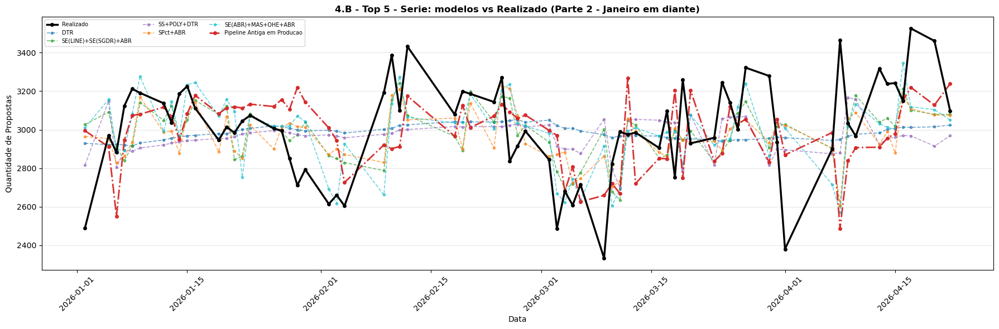

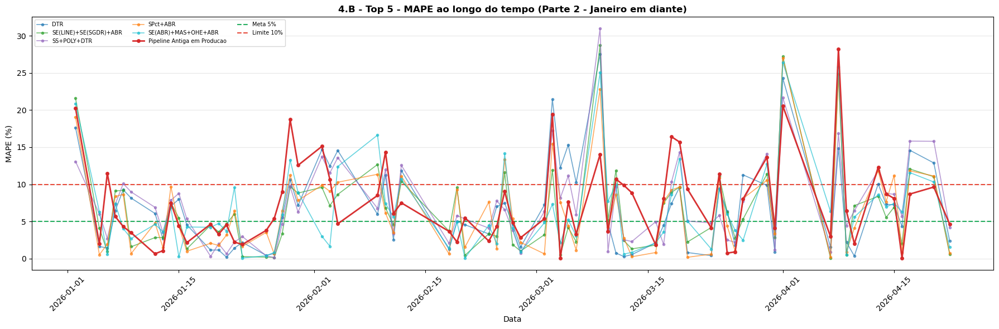

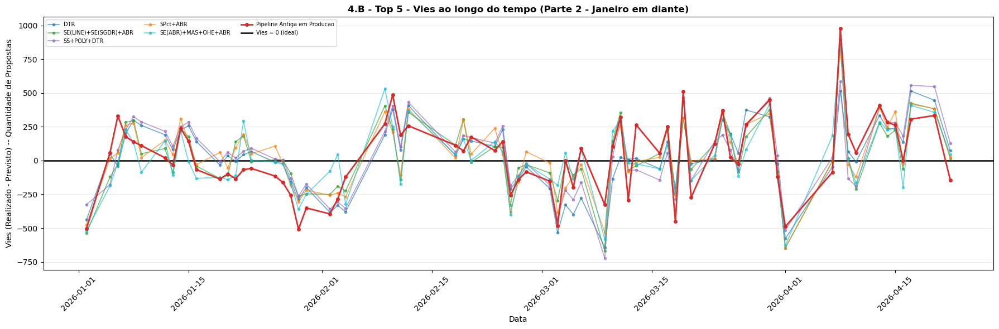


-- Metricas do periodo -- Parte 2 - Janeiro em diante:


,Modelo,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,DTR,6.83,9.03,-0.02,25.0,25.0,0.08,200.8,255.8,8.5,6.02,0.18,27.53,32/70,52/70,70
1,SE(LINE)+SE(SGDR)+ABR,6.48,8.82,-0.004,30.5,30.5,0.38,192.0,253.1,8.41,4.9,0.08,28.71,35/70,57/70,70
2,SS+POLY+DTR,7.29,9.18,-0.107,44.0,44.0,0.73,216.9,264.1,8.78,6.14,0.13,31.0,27/70,52/70,70
3,SPct+ABR,6.49,8.75,-0.012,41.9,41.9,0.74,192.7,252.5,8.39,5.1,0.17,27.03,35/70,54/70,70
4,SE(ABR)+MAS+OHE+ABR,6.56,8.8,-0.026,19.9,19.9,0.09,194.8,256.9,8.54,5.0,0.05,26.4,35/70,57/70,70
5,Pipeline Antiga em Producao,7.43,9.35,-0.19,26.0,26.0,0.23,220.9,276.3,9.18,5.58,0.04,28.22,32/70,53/70,70



### 4.B - Top 5 | Parte 3 - Recorte de marco


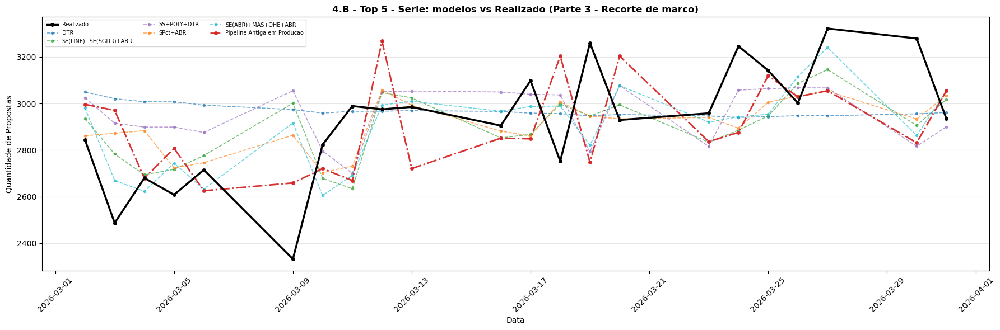

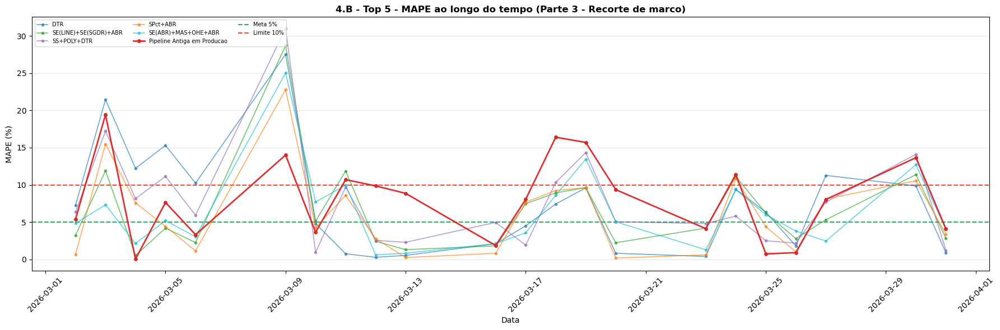

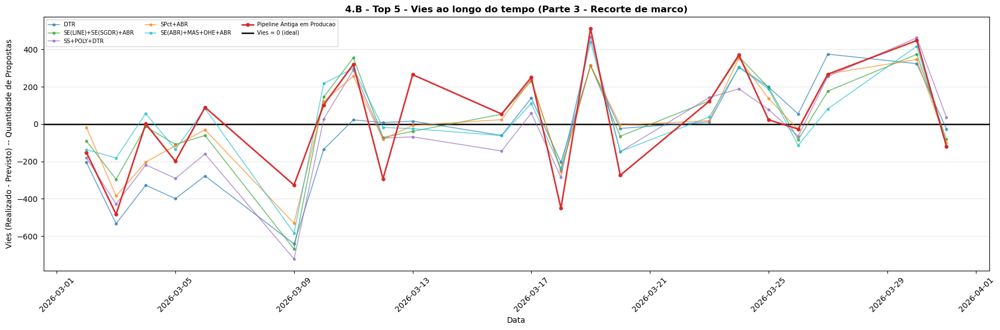


-- Metricas do periodo -- Parte 3 - Recorte de marco:


,Modelo,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,DTR,7.49,10.25,-0.187,-48.7,48.7,-2.51,209.2,269.2,9.22,6.78,0.27,27.53,10/22,16/22,22
1,SE(LINE)+SE(SGDR)+ABR,6.61,8.95,0.063,22.6,22.6,0.13,188.9,242.1,8.29,4.66,0.52,28.71,11/22,17/22,22
2,SS+POLY+DTR,7.73,10.28,-0.213,-35.7,35.7,-2.01,217.8,274.3,9.39,5.87,0.94,31.0,9/22,16/22,22
3,SPct+ABR,6.1,8.26,0.178,14.2,14.2,-0.15,174.4,227.2,7.78,4.39,0.17,22.79,12/22,18/22,22
4,SE(ABR)+MAS+OHE+ABR,6.32,8.33,0.149,21.5,21.5,0.19,181.5,230.7,7.9,4.93,0.6,25.04,11/22,19/22,22
5,Pipeline Antiga em Producao,8.05,9.68,-0.243,22.5,22.5,0.14,234.1,279.1,9.56,8.05,0.04,19.43,8/22,15/22,22



### 4.B - Top 5 | Parte 4 - Distribuicoes, RMSPE e trade-off (base completa)


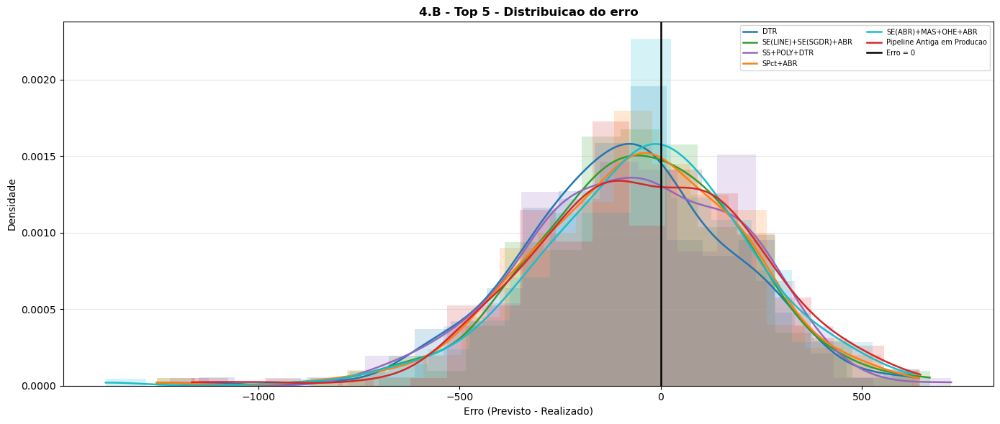

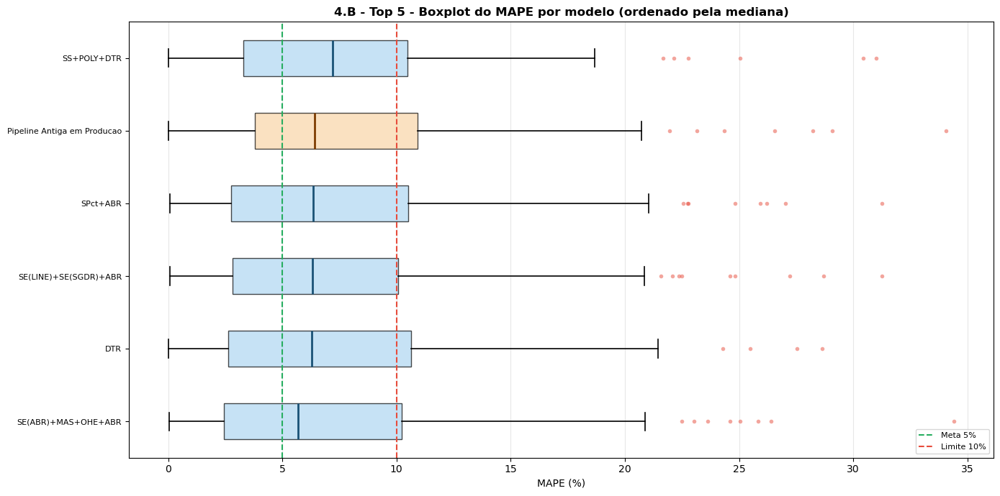

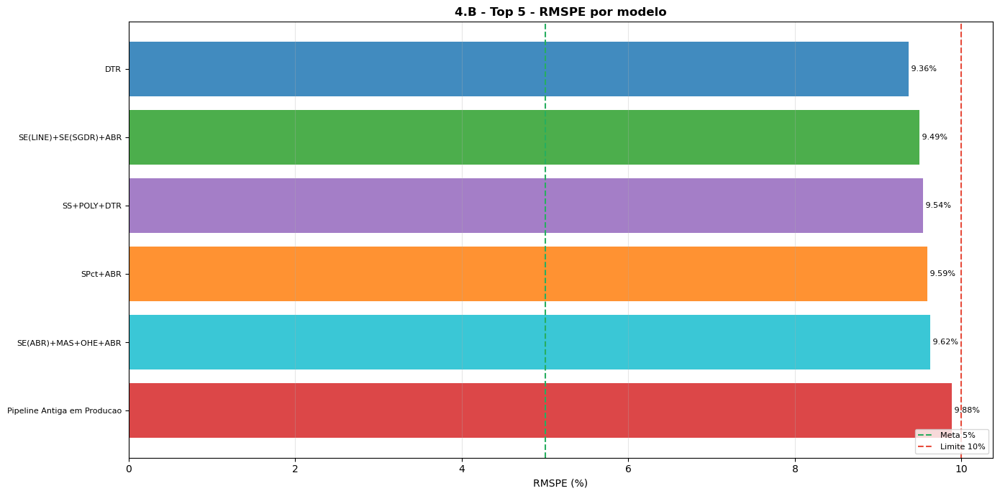

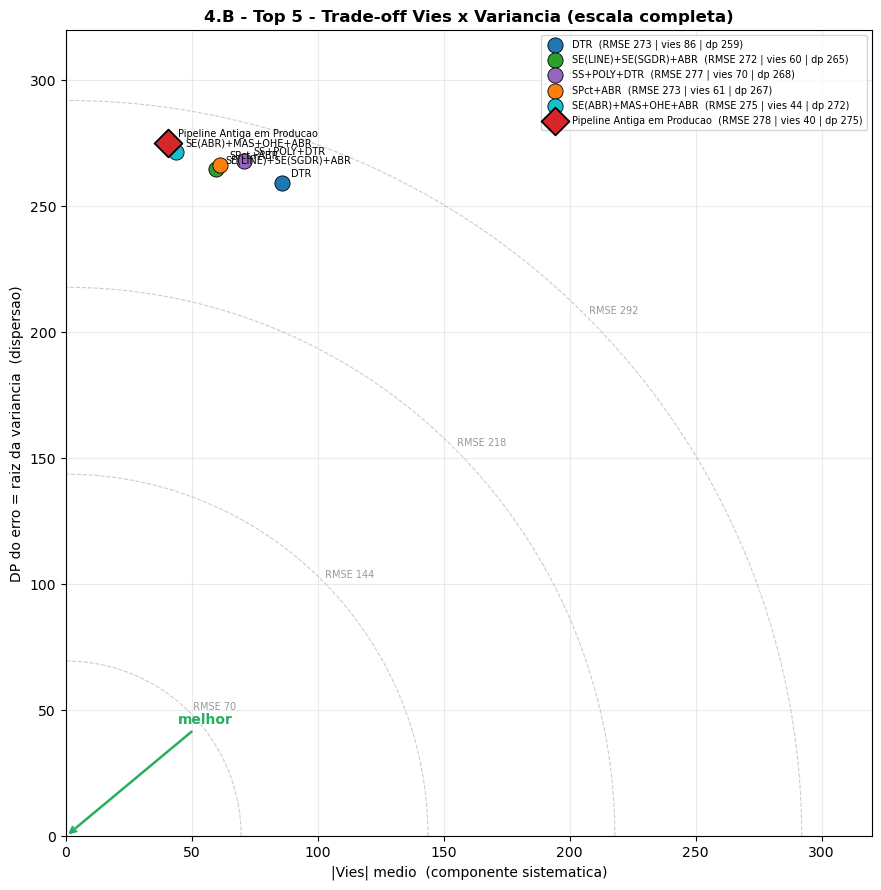

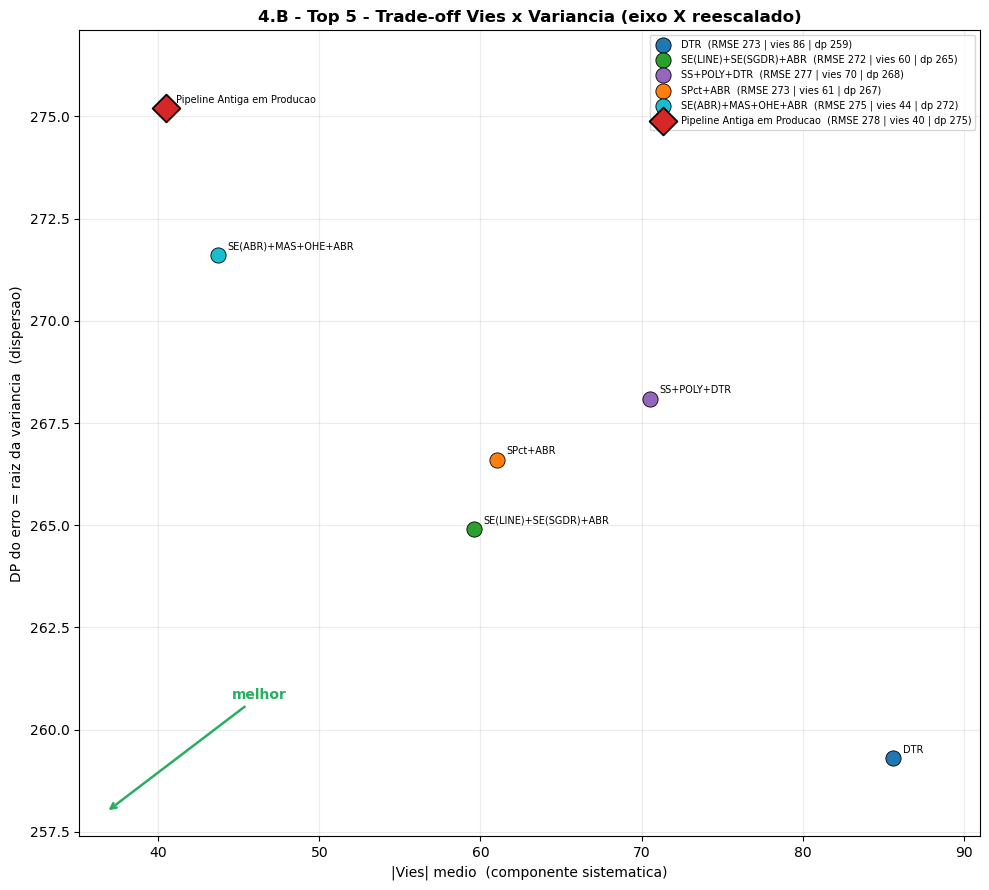


SELECAO FINAL
  Melhor modelo  : DTR  [P4]
  RMSPE          : 9.36%
  Pipeline Antiga: 9.88%
  Melhoria       : +0.52 p.p.

Top 5 candidatos:
  1. DTR  (RMSPE 9.36%)
  2. SE(LINE)+SE(SGDR)+ABR  (RMSPE 9.49%)
  3. SS+POLY+DTR  (RMSPE 9.54%)
  4. SPct+ABR  (RMSPE 9.59%)
  5. SE(ABR)+MAS+OHE+ABR  (RMSPE 9.62%)


In [40]:
# ============================================================
# 4.B - Top 5 - SELECAO FINAL (via comparar_todos_modelos)
# ============================================================
_rank_sem_ref = df_ranking_int[df_ranking_int.index != NOME_ANTIGO]
_top5     = _rank_sem_ref.head(5).index.tolist()
_top5_ref = _top5 + ([NOME_ANTIGO] if NOME_ANTIGO not in _top5 else [])

comparar_todos_modelos(_df_db, df_ranking_int.loc[_top5_ref], _UNID, titulo='4.B - Top 5')

# --- Sumario final ---
_melhor       = _top5[0]
_rmspe_melhor = df_ranking_int.loc[_melhor, 'RMSPE (%)']
_parte_melhor = df_ranking_int.loc[_melhor, 'Parte']
_rmspe_antigo = df_ranking_int.loc[NOME_ANTIGO, 'RMSPE (%)'] if NOME_ANTIGO in df_ranking_int.index else None

print(f'\n{"="*60}')
print('SELECAO FINAL')
print(f'{"="*60}')
print(f'  Melhor modelo  : {_melhor}  [{_parte_melhor}]')
print(f'  RMSPE          : {_rmspe_melhor:.2f}%')
if _rmspe_antigo is not None:
    _ganho = _rmspe_antigo - _rmspe_melhor
    print(f'  Pipeline Antiga: {_rmspe_antigo:.2f}%')
    print(f'  Melhoria       : {_ganho:+.2f} p.p.')
print(f'{"="*60}')
print('\nTop 5 candidatos:')
for _i, _n in enumerate(_top5, 1):
    print(f'  {_i}. {_n}  (RMSPE {df_ranking_int.loc[_n, "RMSPE (%)"]:.2f}%)')


---
### 4.C - Comparacao Individual de um Modelo (automatizada)

Defina `MODELO_SELECIONADO` e a funcao `comparar_modelo(...)` reproduz **todos os graficos
da Secao 5.C para esse unico modelo** (vs Realizado vs Pipeline Antiga) e imprime as
**metricas comparativas contra a Pipeline Antiga** em um print.

In [41]:
# ---- Selecione o modelo a comparar (padrao: melhor do ranking) ----
# comparar_modelo(nome, ...) definido no bloco de funcoes (estrutura de 4 partes,
# igual ao experimento_sarimax): historico completo / janeiro em diante / recorte
# de marco / distribuicoes-RMSPE-tradeoff, com metricas por mes e comparativo final.
MODELO_SELECIONADO = _top5[0]   # <-- nome de um modelo OU vetor de nomes (roda a sequencia p/ cada um)



### 5.D - FEAT+ABR-3 | Parte 1 - Historico completo


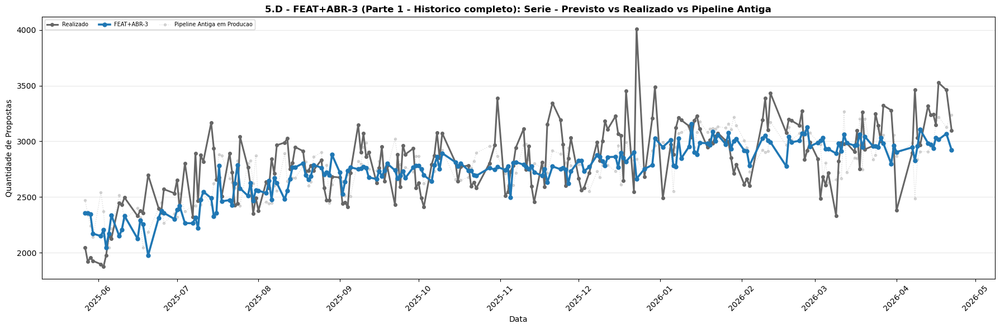

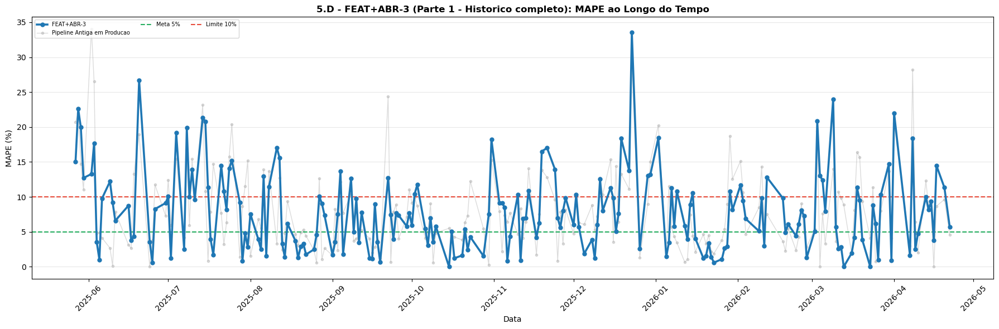

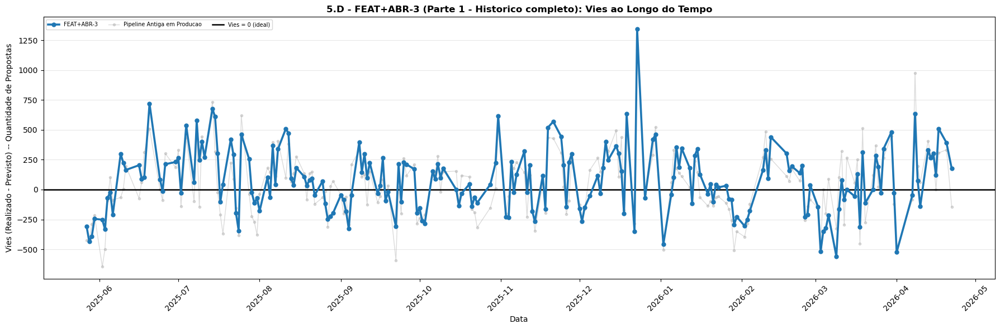


-- Metricas do periodo -- Parte 1 - Historico completo:


,Modelo,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,FEAT+ABR-3,7.79,9.68,0.302,72.3,72.3,1.79,220.5,270.9,9.63,6.96,0.0,33.56,79/211,149/211,211
1,Pipeline Antiga em Producao,7.89,9.88,0.313,40.5,40.5,0.64,220.8,275.2,9.78,6.42,0.01,34.06,87/211,152/211,211



### 5.D - FEAT+ABR-3 | Parte 2 - Janeiro em diante


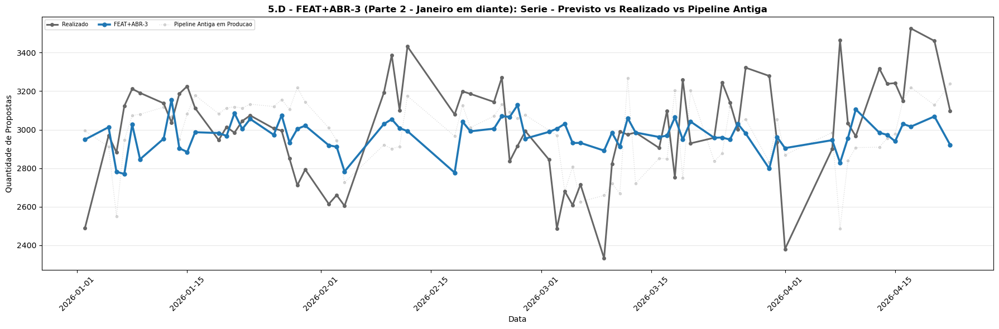

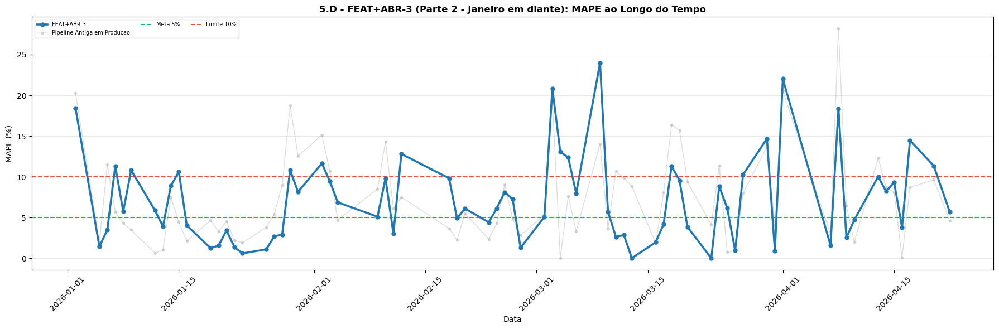

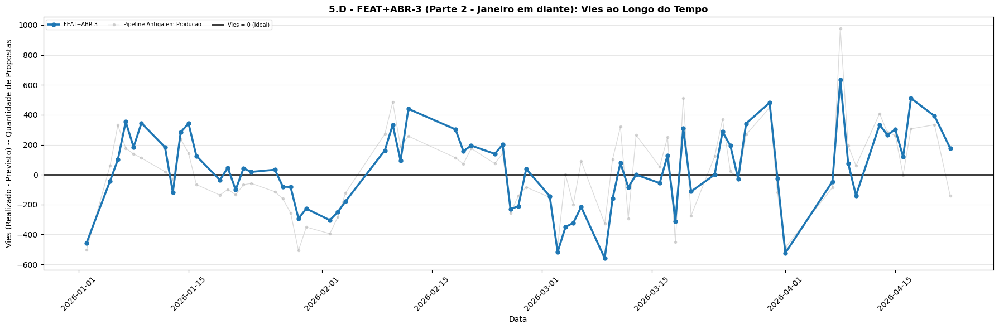


-- Metricas do periodo -- Parte 2 - Janeiro em diante:


,Modelo,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,FEAT+ABR-3,7.2,9.0,-0.064,36.1,36.1,0.48,213.9,259.9,8.64,5.98,0.0,23.98,29/70,51/70,70
1,Pipeline Antiga em Producao,7.43,9.35,-0.19,26.0,26.0,0.23,220.9,276.3,9.18,5.58,0.04,28.22,32/70,53/70,70



### 5.D - FEAT+ABR-3 | Parte 3 - Recorte de marco


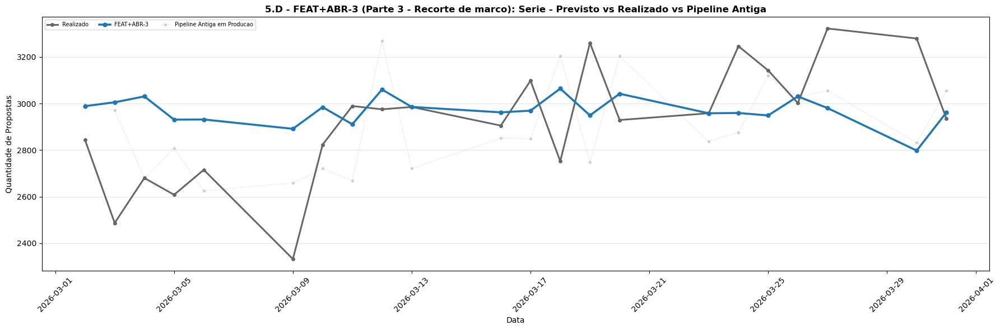

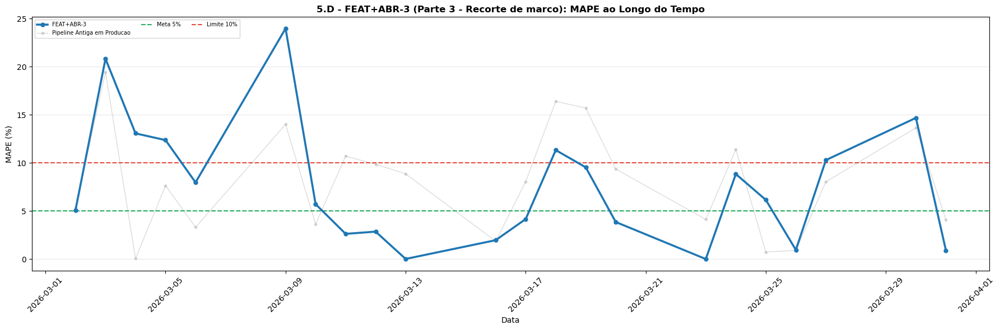

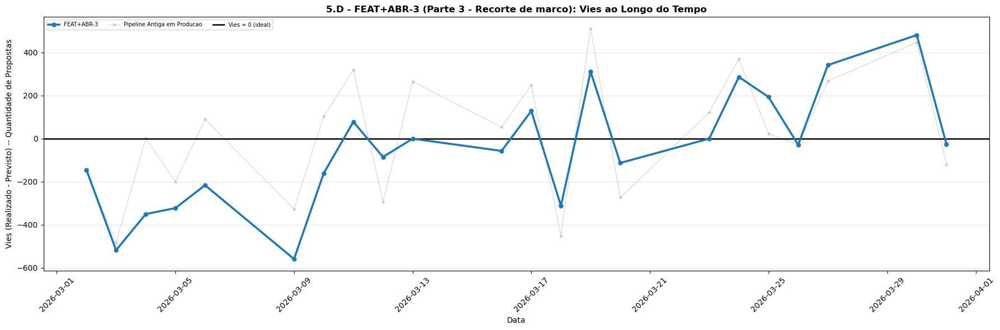


-- Metricas do periodo -- Parte 3 - Recorte de marco:


,Modelo,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,FEAT+ABR-3,7.6,9.92,-0.161,-48.8,48.8,-2.48,214.3,266.2,9.11,5.93,0.0,23.98,9/22,15/22,22
1,Pipeline Antiga em Producao,8.05,9.68,-0.243,22.5,22.5,0.14,234.1,279.1,9.56,8.05,0.04,19.43,8/22,15/22,22



### 5.D - FEAT+ABR-3 | Parte 4 - Distribuicoes, RMSPE e trade-off (base completa)


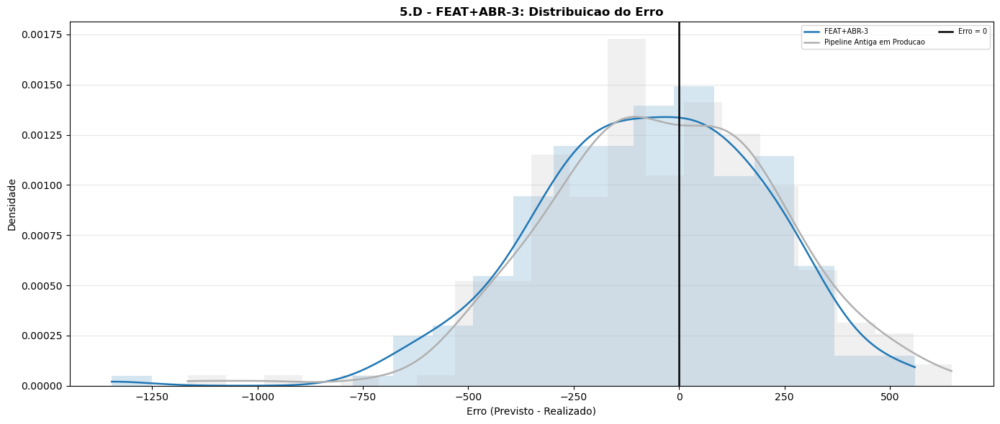

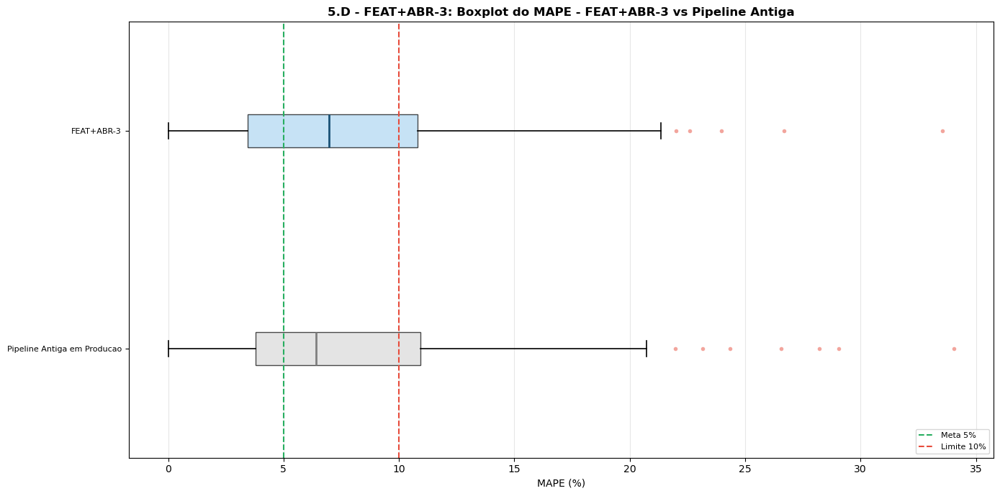

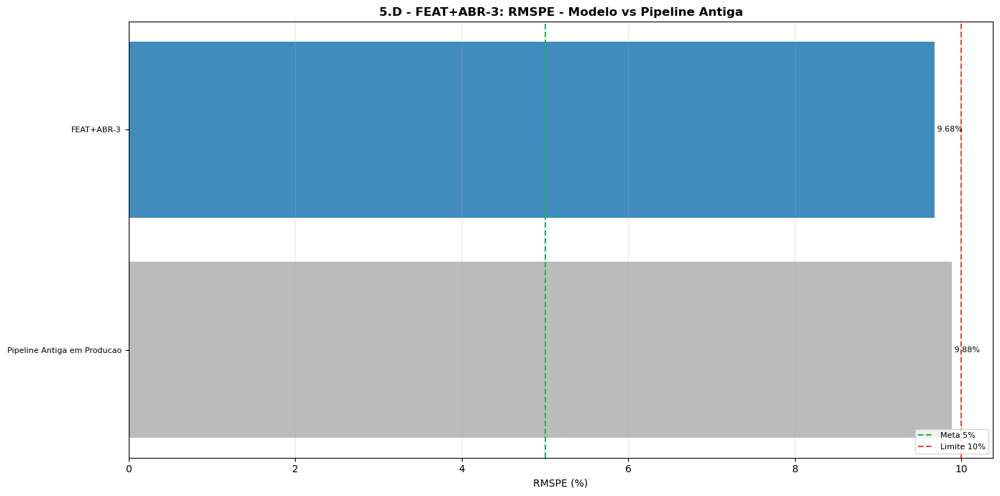

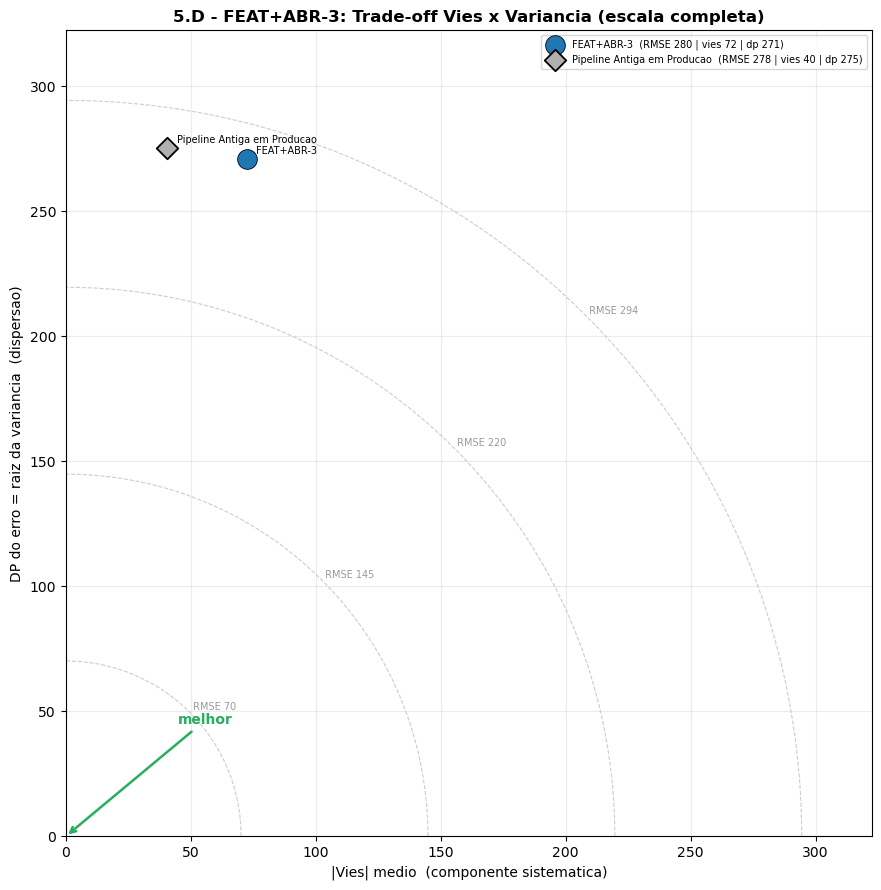


-- Metricas por mes -- FEAT+ABR-3:


,Modelo,Mes,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,FEAT+ABR-3,2025-05,17.57,18.0,-47.662,-344.2,344.2,-17.57,344.2,73.1,3.72,17.49,12.71,22.6,0/4,0/4,4
1,FEAT+ABR-3,2025-06,8.65,10.79,-0.213,89.6,89.6,2.91,201.8,242.9,10.5,8.51,0.62,26.7,6/16,12/16,16
2,FEAT+ABR-3,2025-07,10.27,12.13,-1.272,206.3,206.3,7.02,286.4,278.4,10.4,10.03,0.85,21.34,7/22,11/22,22
3,FEAT+ABR-3,2025-08,6.19,7.77,-0.62,69.1,69.1,2.1,172.1,209.9,7.66,3.93,1.27,17.05,12/21,16/21,21
4,FEAT+ABR-3,2025-09,6.14,7.22,0.084,38.1,38.1,0.86,169.8,196.6,7.13,6.57,0.7,13.64,9/22,19/22,22
5,FEAT+ABR-3,2025-10,5.56,7.03,0.177,26.9,26.9,0.41,157.9,206.5,7.41,5.22,0.0,18.23,8/18,15/18,18
6,FEAT+ABR-3,2025-11,8.23,9.28,-0.25,105.6,105.6,2.99,238.9,256.9,9.05,7.98,0.83,17.01,4/19,14/19,19
7,FEAT+ABR-3,2025-12,9.69,12.07,-0.299,176.1,176.1,4.51,310.9,385.0,12.83,8.02,1.23,33.56,4/19,11/19,19
8,FEAT+ABR-3,2026-01,5.64,7.26,-0.43,29.3,29.3,0.59,166.7,208.3,6.95,3.91,0.6,18.43,12/21,16/21,21
9,FEAT+ABR-3,2026-02,7.12,7.76,0.151,58.9,58.9,1.34,215.7,229.1,7.53,6.86,1.28,12.81,4/15,13/15,15


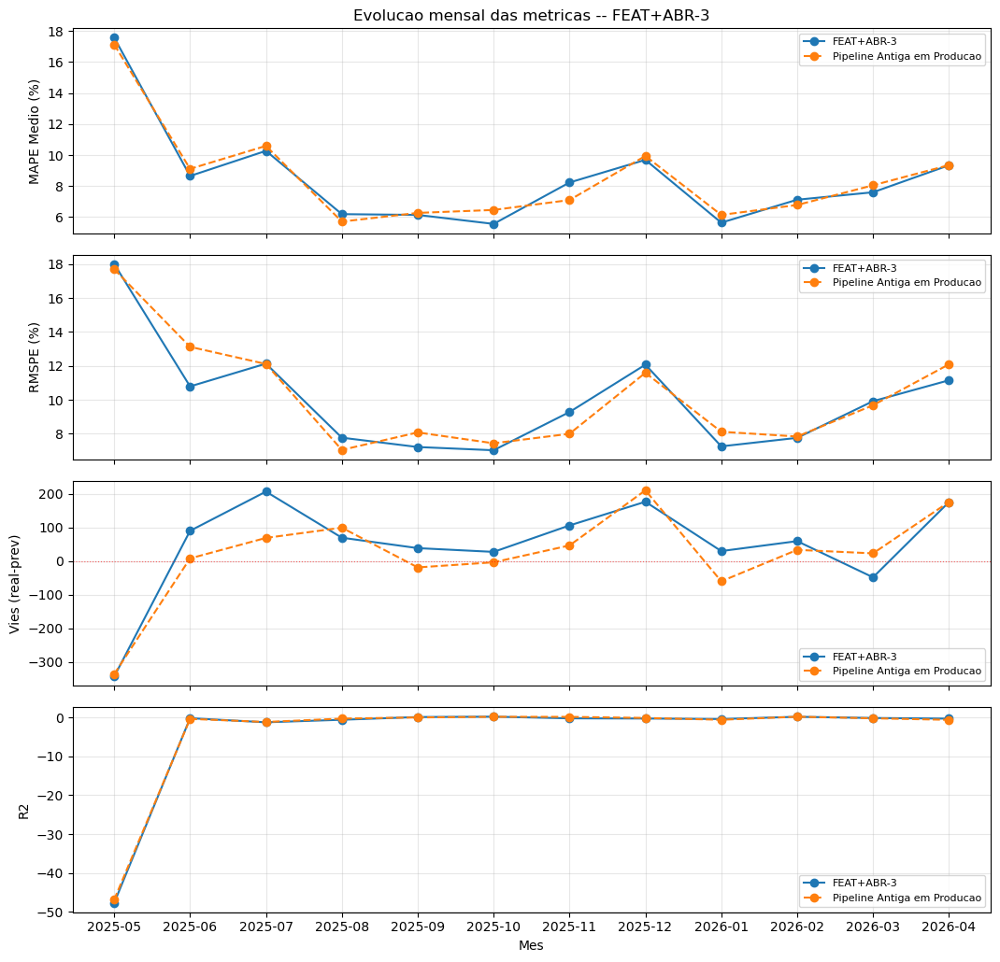


### 5.D - SVR | Parte 1 - Historico completo


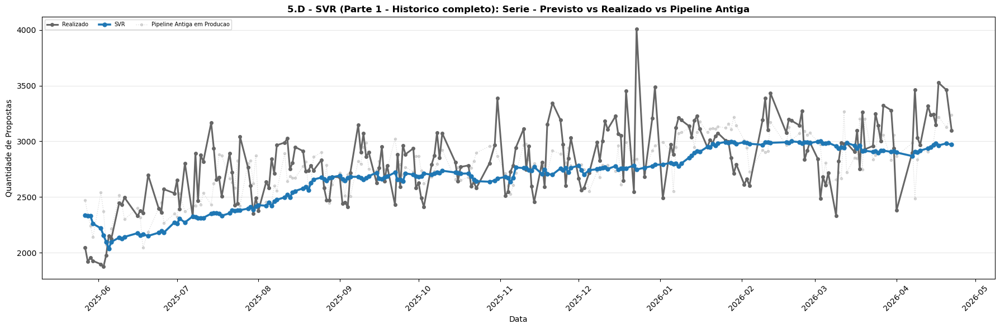

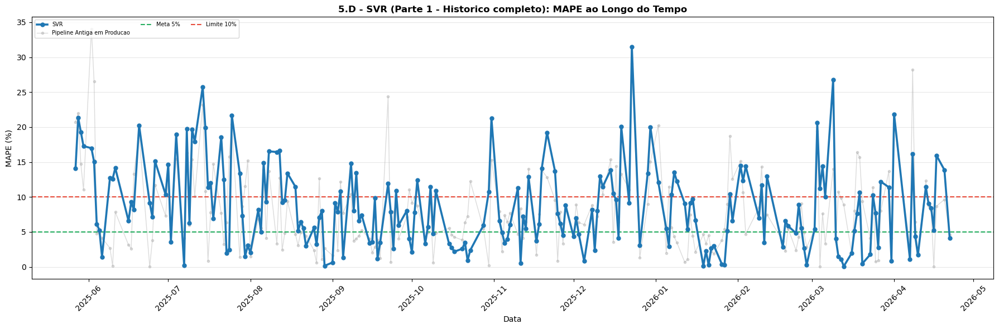

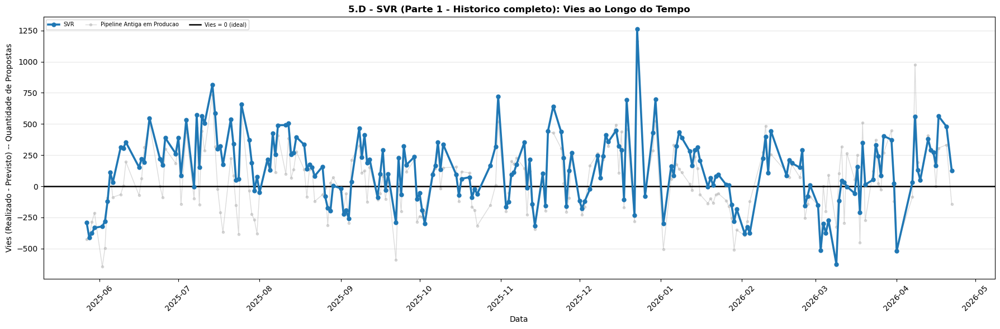


-- Metricas do periodo -- Parte 1 - Historico completo:


,Modelo,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,SVR,8.57,10.45,0.177,129.4,129.4,3.84,243.8,275.7,9.8,7.65,0.07,31.52,67/211,133/211,211
1,Pipeline Antiga em Producao,7.89,9.88,0.313,40.5,40.5,0.64,220.8,275.2,9.78,6.42,0.01,34.06,87/211,152/211,211



### 5.D - SVR | Parte 2 - Janeiro em diante


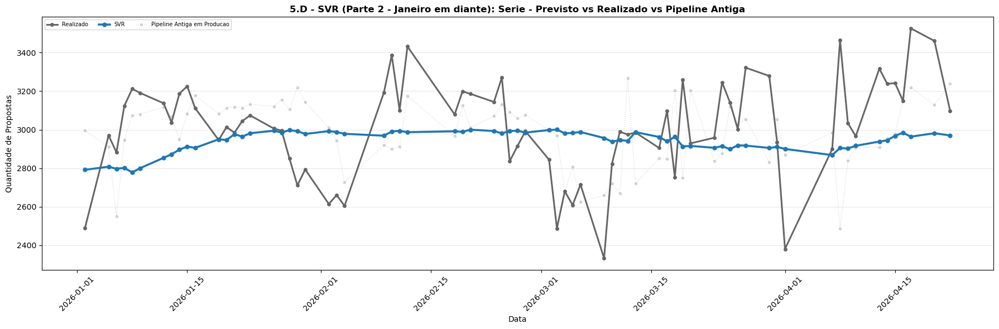

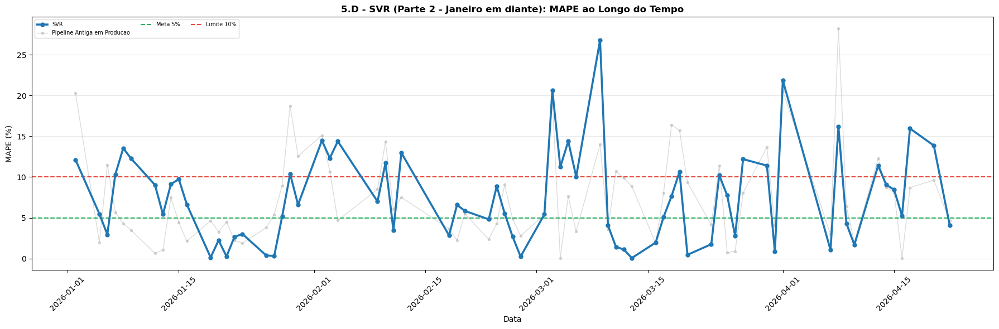

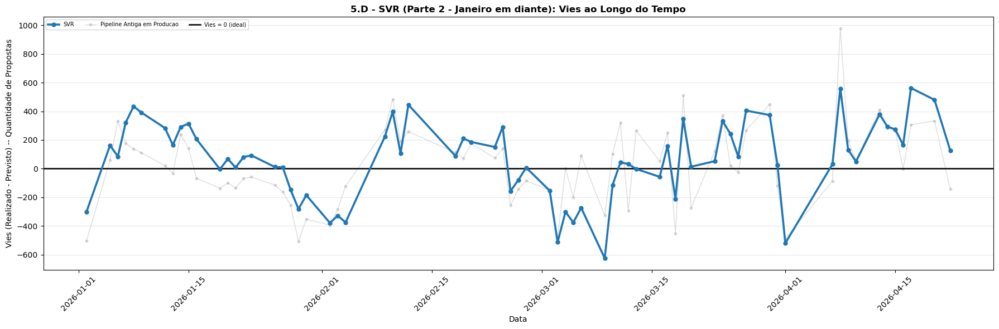


-- Metricas do periodo -- Parte 2 - Janeiro em diante:


,Modelo,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,SVR,7.46,9.36,-0.162,68.7,68.7,1.52,222.4,265.5,8.82,6.6,0.07,26.78,26/70,46/70,70
1,Pipeline Antiga em Producao,7.43,9.35,-0.19,26.0,26.0,0.23,220.9,276.3,9.18,5.58,0.04,28.22,32/70,53/70,70



### 5.D - SVR | Parte 3 - Recorte de marco


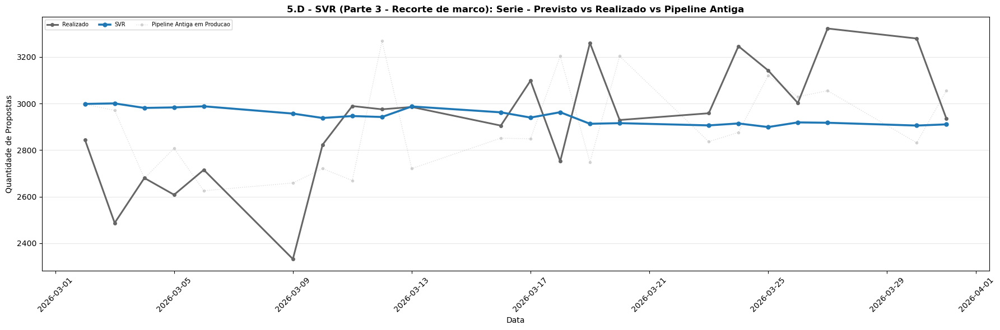

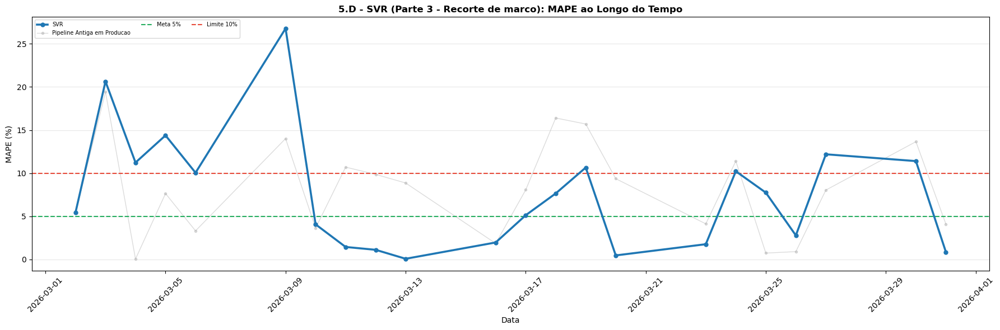

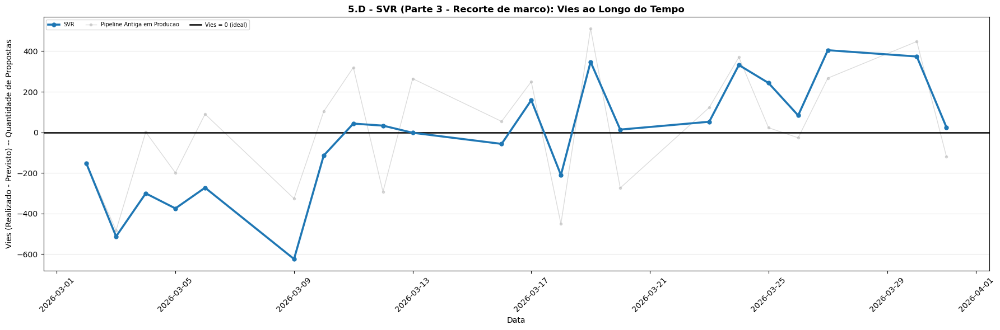


-- Metricas do periodo -- Parte 3 - Recorte de marco:


,Modelo,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,SVR,7.63,10.19,-0.208,-23.5,23.5,-1.66,215.2,275.0,9.41,6.54,0.07,26.78,9/22,13/22,22
1,Pipeline Antiga em Producao,8.05,9.68,-0.243,22.5,22.5,0.14,234.1,279.1,9.56,8.05,0.04,19.43,8/22,15/22,22



### 5.D - SVR | Parte 4 - Distribuicoes, RMSPE e trade-off (base completa)


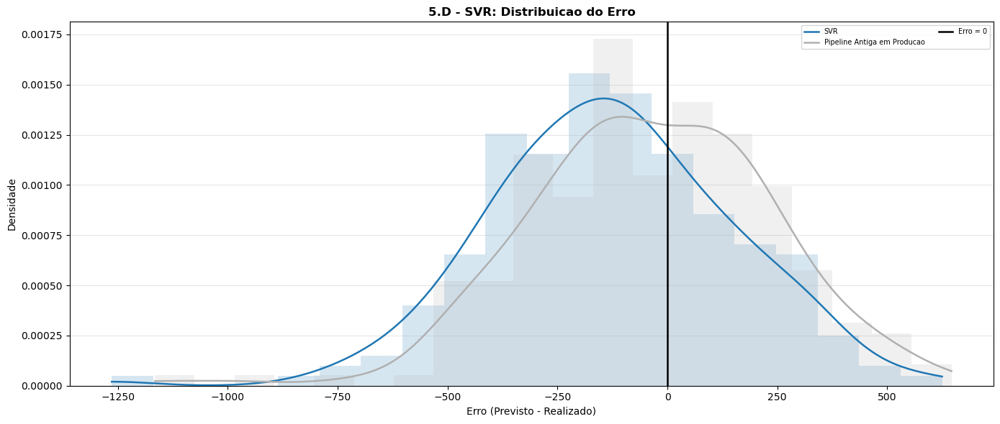

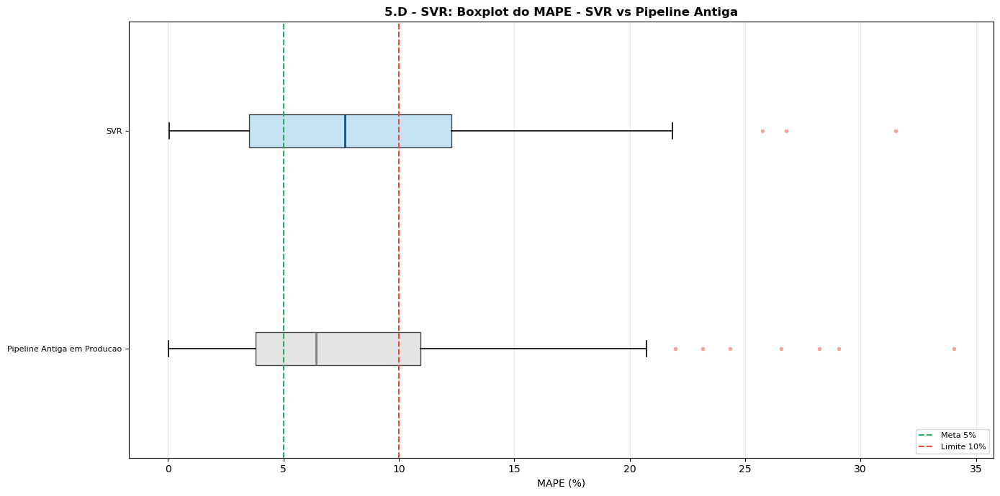

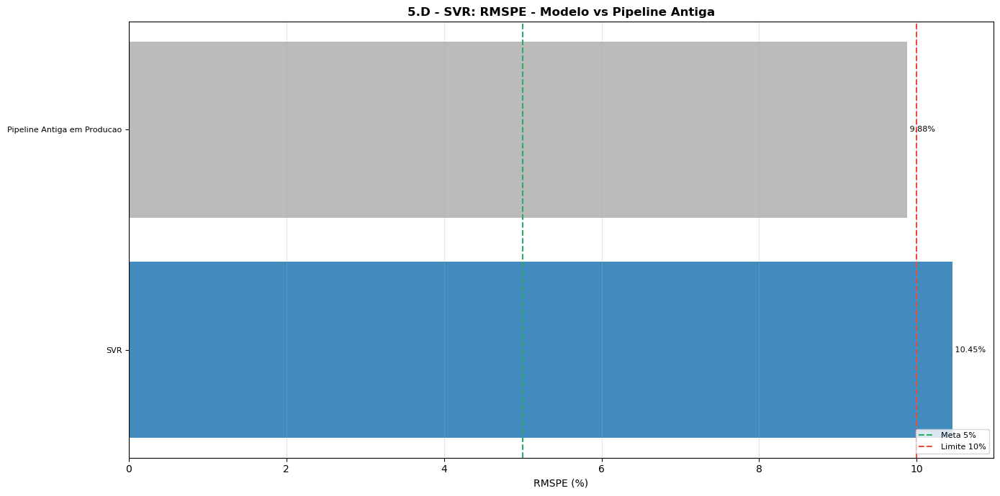

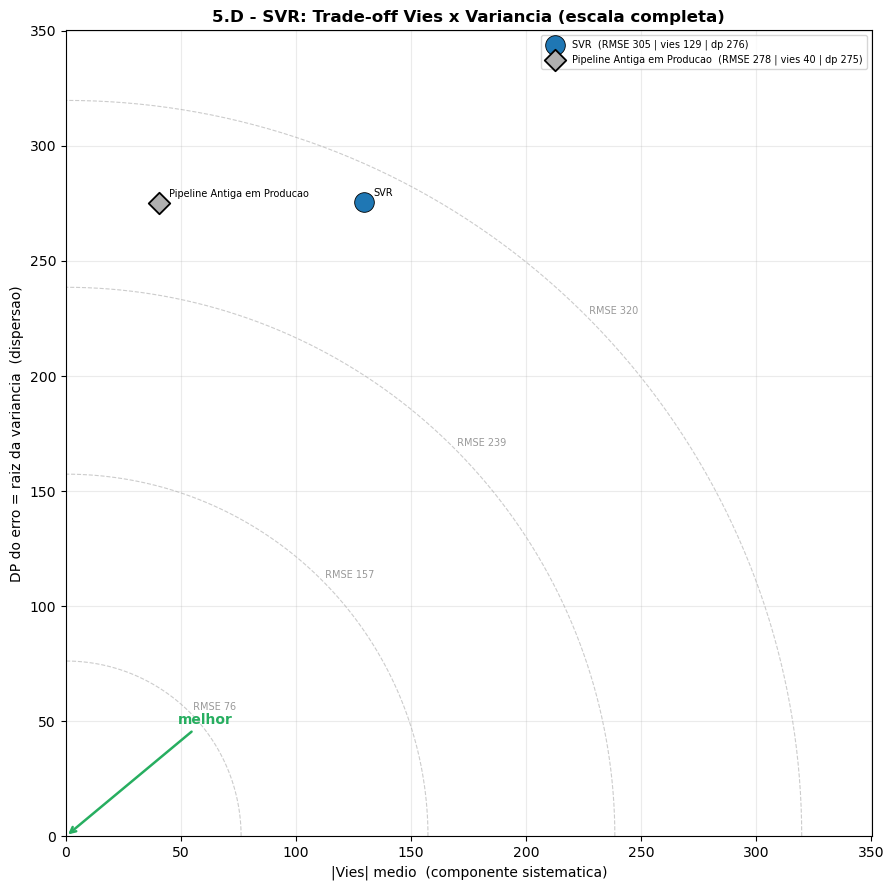


-- Metricas por mes -- SVR:


,Modelo,Mes,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,SVR,2025-05,18.01,18.21,-48.623,-352.4,352.4,-18.01,352.4,45.7,2.33,18.29,14.11,21.35,0/4,0/4,4
1,SVR,2025-06,10.65,11.67,-0.392,158.8,158.8,5.88,249.5,227.4,9.83,9.8,1.43,20.24,1/16,8/16,16
2,SVR,2025-07,11.78,14.03,-2.113,329.0,329.0,11.63,332.5,237.5,8.87,12.25,0.18,25.75,6/22,9/22,22
3,SVR,2025-08,8.42,9.7,-1.577,189.0,189.0,6.48,237.0,204.8,7.47,8.01,0.15,16.65,4/21,15/21,21
4,SVR,2025-09,6.94,7.99,-0.174,77.9,77.9,2.25,193.9,212.8,7.72,7.63,0.62,14.8,8/22,17/22,22
5,SVR,2025-10,6.34,8.13,-0.167,95.4,95.4,2.8,183.9,228.8,8.21,4.12,0.91,21.26,10/18,13/18,18
6,SVR,2025-11,7.69,8.9,-0.182,111.3,111.3,3.21,225.0,246.1,8.67,6.16,0.53,19.2,6/19,14/19,19
7,SVR,2025-12,10.27,12.58,-0.408,242.6,242.6,6.79,333.2,368.1,12.26,9.17,0.82,31.52,6/19,11/19,19
8,SVR,2026-01,6.08,7.42,-0.627,95.5,95.5,2.81,183.0,203.1,6.77,5.48,0.14,13.52,8/21,16/21,21
9,SVR,2026-02,7.58,8.79,-0.044,52.6,52.6,0.99,228.0,257.0,8.45,6.58,0.25,14.47,5/15,10/15,15


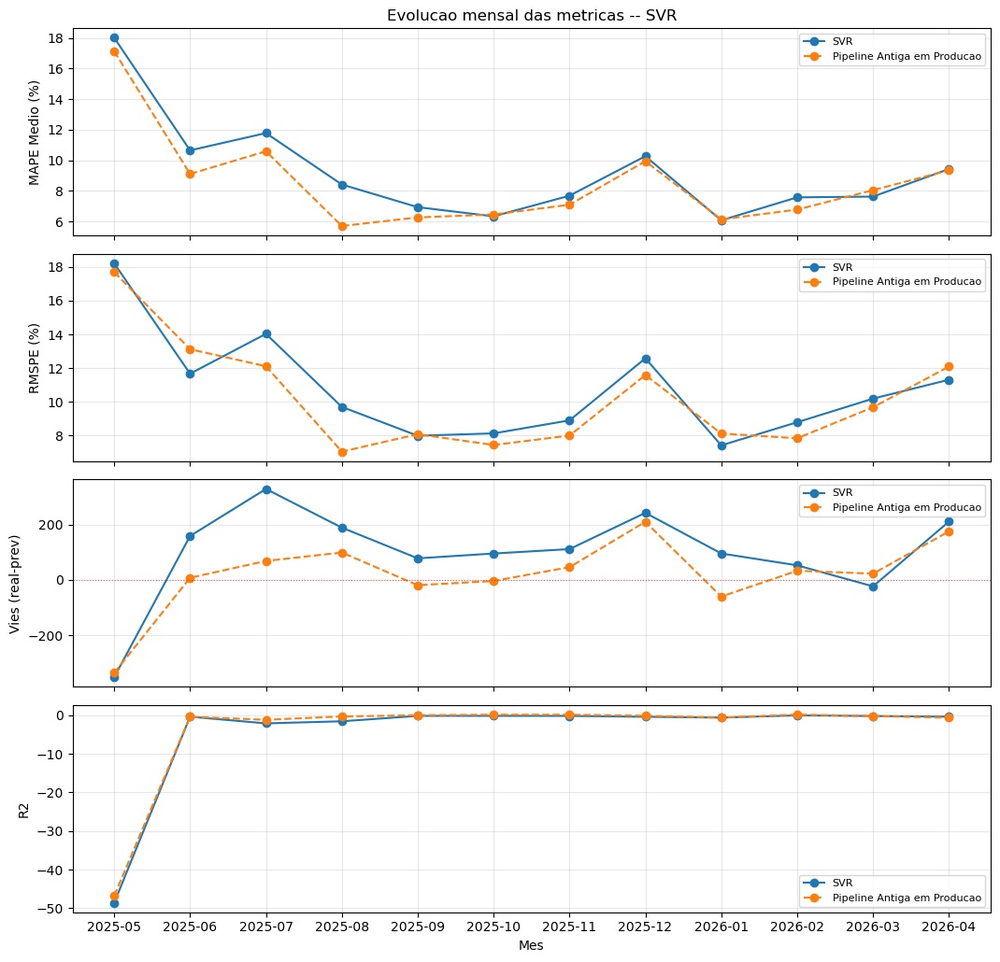

COMPARATIVO  |  FEAT+ABR-3   vs   Pipeline Antiga em Producao
Metrica                     Modelo   Pipeline Antiga         Delta   Resultado
------------------------------------------------------------------------------------
MAPE Medio (%)                7.79              7.89         -0.10   melhor
RMSPE (%)                     9.68              9.88         -0.20   melhor
R2                           0.302             0.313         -0.01   pior
Vies (real-prev)              72.3              40.5        +31.80   
|Vies|                        72.3              40.5        +31.80   pior
MAE                          220.5             220.8         -0.30   melhor
DP Erro                      270.9             275.2         -4.30   melhor
Mediana (%)                   6.96              6.42         +0.54   pior
N                              211               211         +0.00   
COMPARATIVO  |  SVR   vs   Pipeline Antiga em Producao
Metrica                     Modelo   Pipeline Antiga 

In [42]:
comparar_modelo(['FEAT+ABR-3', 'SVR'])


## 5 - Metricas de ranking por mes (um modelo)

`metricas_por_mes(modelo)` pega **um** modelo e calcula o mesmo bloco de metricas do ranking integrado (MAPE/RMSPE/R2/Vies/MAE/DP Erro...), mas quebrado por **mes-calendario** da base (`Dia Prevista`). Usa `_df_db` (previsoes cruas, sem correcao de vies) por padrao. A linha `TOTAL` repete o agregado de todos os meses. O nome do modelo aparece como **coluna**, nunca como indice.

In [43]:
# Exemplo: melhor modelo do ranking integrado, mes a mes
_mod_exemplo = df_ranking_int.index[0]
print(f'Metricas por mes -- {_mod_exemplo}:')
display(metricas_por_mes(_mod_exemplo))

# Pipeline antiga em producao como referencia
print(f'\nMetricas por mes -- {NOME_ANTIGO}:')
display(metricas_por_mes(NOME_ANTIGO))


Metricas por mes -- DTR:


,Modelo,Mes,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,DTR,2025-05,2.04,3.23,-0.706,37.0,37.0,1.82,41.2,54.5,2.78,0.89,0.1,6.28,3/4,4/4,4
1,DTR,2025-06,8.42,9.76,0.04,111.3,111.3,3.96,197.7,201.6,8.71,8.18,1.66,18.48,5/16,9/16,16
2,DTR,2025-07,10.73,13.14,-1.748,291.5,291.5,10.21,303.8,245.6,9.17,10.55,0.0,25.47,6/22,9/22,22
3,DTR,2025-08,6.39,7.48,-0.501,109.0,109.0,3.59,178.3,182.7,6.66,5.0,0.84,13.27,10/21,17/21,21
4,DTR,2025-09,6.63,7.66,-0.028,37.7,37.7,0.79,182.8,208.7,7.57,5.94,0.72,14.32,8/22,16/22,22
5,DTR,2025-10,6.19,7.73,0.0,43.3,43.3,0.92,176.4,225.3,8.08,4.29,0.79,18.74,10/18,13/18,18
6,DTR,2025-11,7.22,8.54,-0.036,55.4,55.4,1.21,208.5,246.7,8.69,7.23,0.27,17.16,5/19,13/19,19
7,DTR,2025-12,9.76,11.45,-0.124,159.5,159.5,4.01,309.6,360.0,12.0,8.32,0.07,28.64,2/19,13/19,19
8,DTR,2026-01,4.92,6.52,-0.124,30.9,30.9,0.66,145.0,183.9,6.13,4.54,0.18,17.65,11/21,19/21,21
9,DTR,2026-02,7.2,8.48,0.059,16.3,16.3,-0.18,214.6,248.4,8.17,5.96,1.23,14.66,6/15,10/15,15



Metricas por mes -- Pipeline Antiga em Producao:


,Modelo,Mes,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,Pipeline Antiga em Producao,2025-05,17.13,17.69,-46.822,-336.9,336.9,-17.13,336.9,90.3,4.6,17.74,11.06,21.97,0/4,0/4,4
1,Pipeline Antiga em Producao,2025-06,9.11,13.12,-0.397,7.5,7.5,-0.78,201.8,277.8,12.0,4.82,0.01,34.06,9/16,11/16,16
2,Pipeline Antiga em Producao,2025-07,10.59,12.11,-1.188,68.5,68.5,1.67,289.8,333.2,12.44,10.45,0.85,23.15,4/22,10/22,22
3,Pipeline Antiga em Producao,2025-08,5.71,7.05,-0.317,98.9,98.9,3.37,159.5,172.9,6.31,4.68,0.58,13.88,13/21,17/21,21
4,Pipeline Antiga em Producao,2025-09,6.27,8.08,-0.02,-19.3,19.3,-1.19,168.8,210.4,7.63,4.24,0.64,24.34,12/22,18/22,22
5,Pipeline Antiga em Producao,2025-10,6.46,7.44,0.139,-4.1,4.1,-0.68,180.5,212.8,7.63,5.47,0.24,15.29,8/18,16/18,18
6,Pipeline Antiga em Producao,2025-11,7.1,8.0,0.128,46.0,46.0,1.03,202.9,227.4,8.01,7.57,0.82,14.04,6/19,16/19,19
7,Pipeline Antiga em Producao,2025-12,9.94,11.59,-0.15,210.1,210.1,5.85,316.2,338.4,11.28,8.92,1.33,29.07,3/19,11/19,19
8,Pipeline Antiga em Producao,2026-01,6.14,8.12,-0.621,-60.6,60.6,-2.38,176.5,215.6,7.19,4.44,0.64,20.26,13/21,17/21,21
9,Pipeline Antiga em Producao,2026-02,6.78,7.84,0.161,32.9,32.9,0.49,204.0,232.8,7.66,5.49,2.24,15.11,7/15,12/15,15


### Evolucao mensal das metricas (grafico)

`plot_metricas_mes(modelo, metricas=[...])` plota a evolucao **mes a mes** das metricas escolhidas para **um** modelo: eixo **X = meses**, eixo **Y = metrica(s) selecionada(s)**. Reaproveita `metricas_por_mes()`. Escolha qualquer subconjunto de `_METRICAS_PLOT`. Como as metricas tem escalas diferentes (ex.: MAPE % vs MAE em unidades vs R2 em 0-1), use `subplots=True` para um painel por metrica; `subplots=False` sobrepoe tudo num eixo so. A linha `TOTAL` e omitida (nao e um mes).


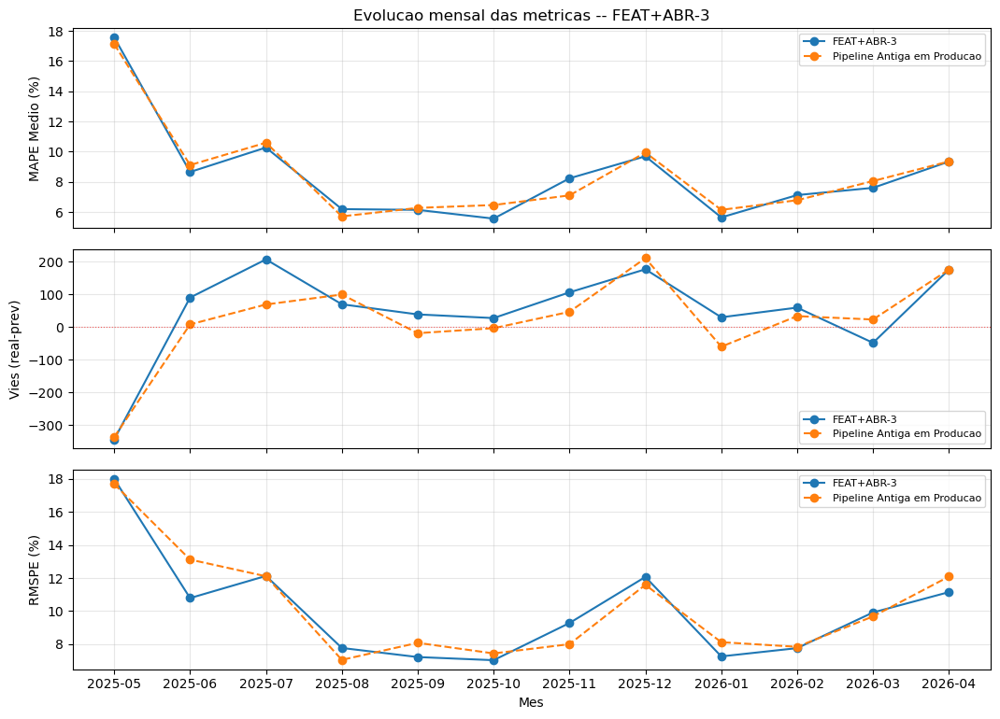

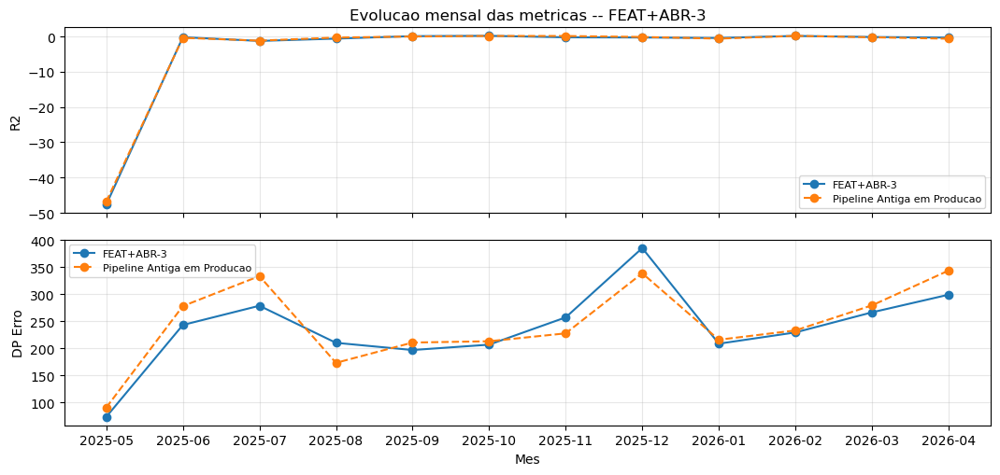

,Mes,Fonte,R2,DP Erro
0,2025-05,FEAT+ABR-3,-47.662,73.1
1,2025-06,FEAT+ABR-3,-0.213,242.9
2,2025-07,FEAT+ABR-3,-1.272,278.4
3,2025-08,FEAT+ABR-3,-0.620,209.9
4,2025-09,FEAT+ABR-3,0.084,196.6
5,2025-10,FEAT+ABR-3,0.177,206.5
6,2025-11,FEAT+ABR-3,-0.250,256.9
7,2025-12,FEAT+ABR-3,-0.299,385.0
8,2026-01,FEAT+ABR-3,-0.430,208.3
9,2026-02,FEAT+ABR-3,0.151,229.1


In [44]:
# Exemplo: MAPE e Vies % do melhor modelo, mes a mes
plot_metricas_mes('FEAT+ABR-3', ['MAPE Medio (%)', 'Vies (real-prev)', 'RMSPE (%)'],
                  subplots=True)

plot_metricas_mes('FEAT+ABR-3', ['R2', 'DP Erro'],
                  subplots=True)


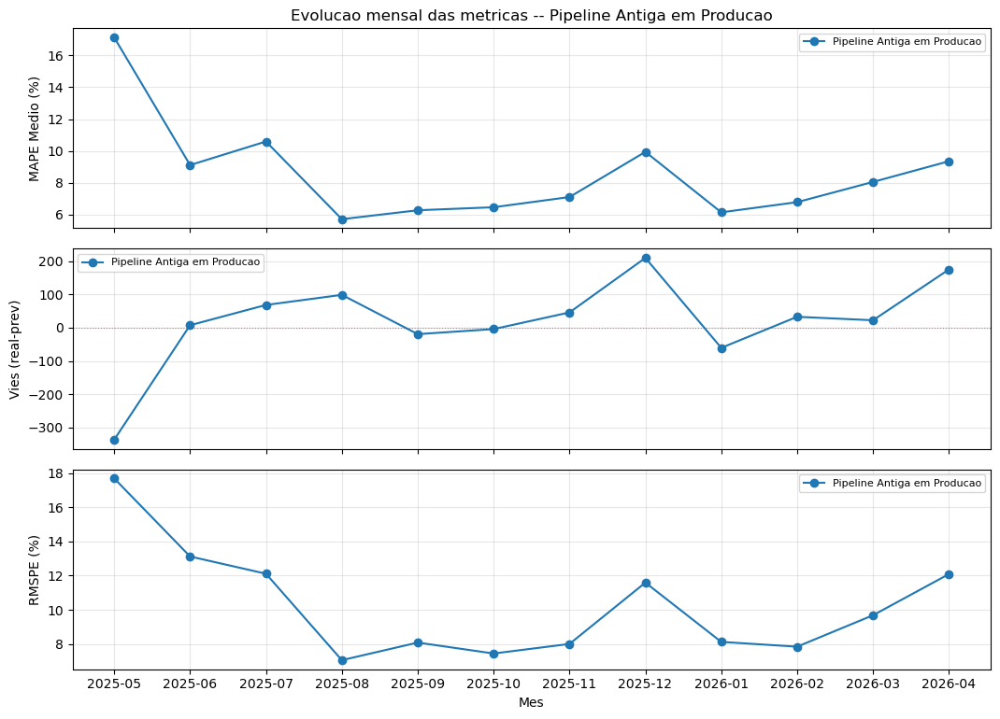

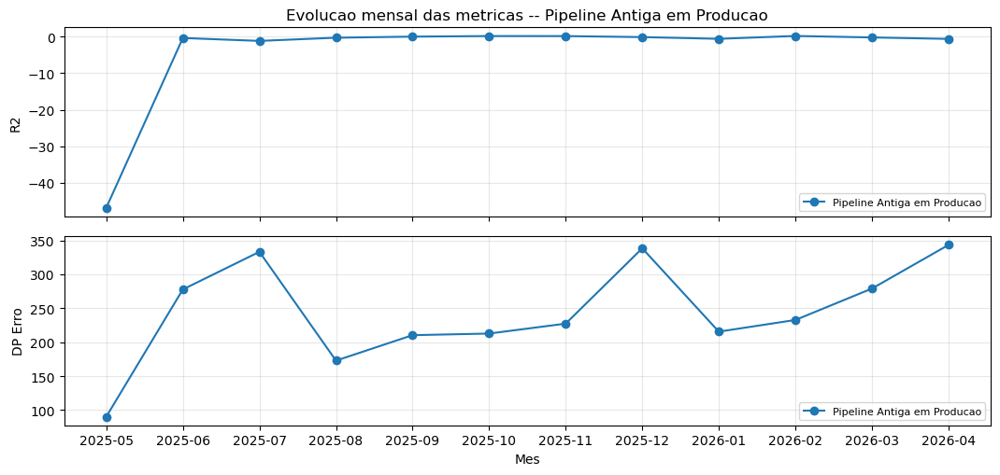

,Mes,Fonte,R2,DP Erro
0,2025-05,Pipeline Antiga em Producao,-46.822,90.3
1,2025-06,Pipeline Antiga em Producao,-0.397,277.8
2,2025-07,Pipeline Antiga em Producao,-1.188,333.2
3,2025-08,Pipeline Antiga em Producao,-0.317,172.9
4,2025-09,Pipeline Antiga em Producao,-0.020,210.4
5,2025-10,Pipeline Antiga em Producao,0.139,212.8
6,2025-11,Pipeline Antiga em Producao,0.128,227.4
7,2025-12,Pipeline Antiga em Producao,-0.150,338.4
8,2026-01,Pipeline Antiga em Producao,-0.621,215.6
9,2026-02,Pipeline Antiga em Producao,0.161,232.8


In [45]:
plot_metricas_mes('Pipeline Antiga em Producao', ['MAPE Medio (%)', 'Vies (real-prev)', 'RMSPE (%)'],
                  subplots=True)

plot_metricas_mes('Pipeline Antiga em Producao', ['R2', 'DP Erro'],
                  subplots=True)
 


### 5.D - RandomForest (tuned) | Parte 1 - Historico completo


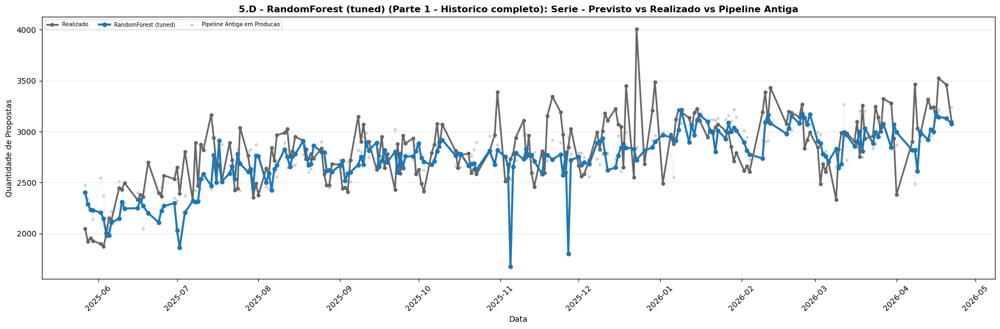

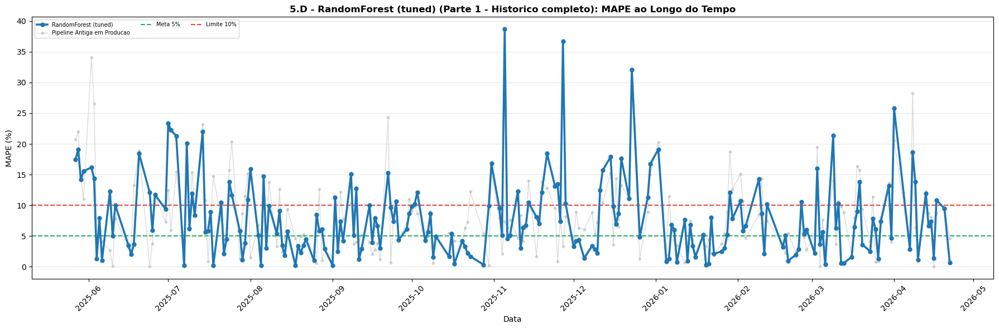

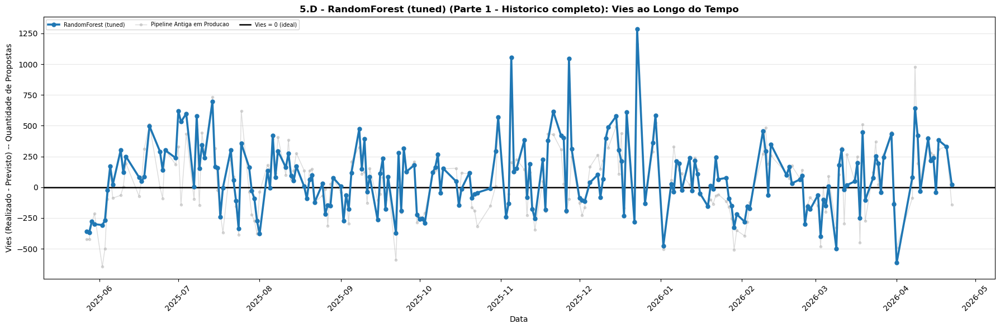


-- Metricas do periodo -- Parte 1 - Historico completo:


,Modelo,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,RandomForest (tuned),7.88,10.19,0.239,82.9,82.9,2.25,222.3,280.8,9.98,6.19,0.19,38.73,80/211,146/211,211
1,Pipeline Antiga em Producao,7.89,9.88,0.313,40.5,40.5,0.64,220.8,275.2,9.78,6.42,0.01,34.06,87/211,152/211,211



### 5.D - RandomForest (tuned) | Parte 2 - Janeiro em diante


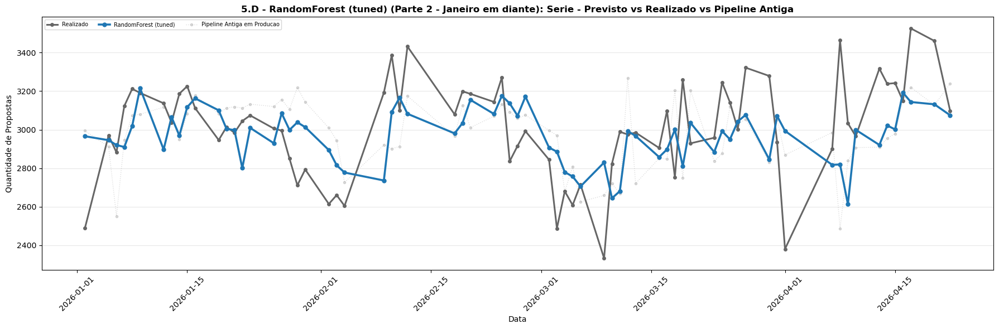

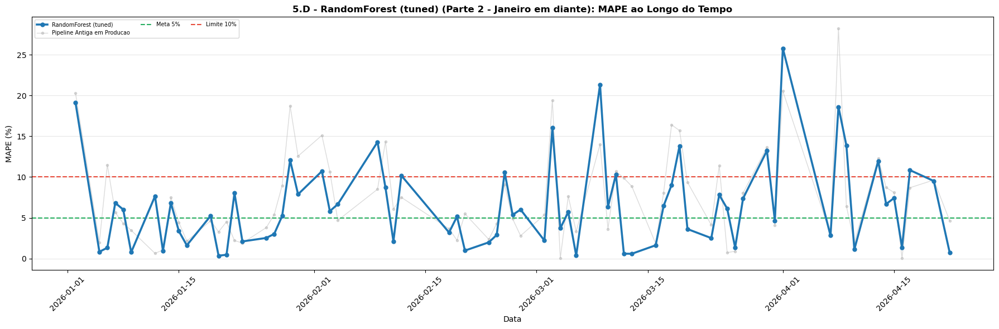

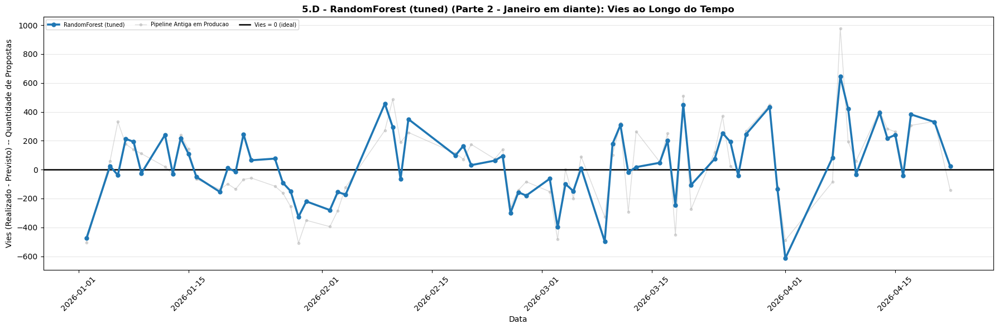


-- Metricas do periodo -- Parte 2 - Janeiro em diante:


,Modelo,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,RandomForest (tuned),6.46,8.44,0.068,39.5,39.5,0.71,191.7,242.4,8.06,5.77,0.35,25.78,30/70,54/70,70
1,Pipeline Antiga em Producao,7.43,9.35,-0.19,26.0,26.0,0.23,220.9,276.3,9.18,5.58,0.04,28.22,32/70,53/70,70



### 5.D - RandomForest (tuned) | Parte 3 - Recorte de marco


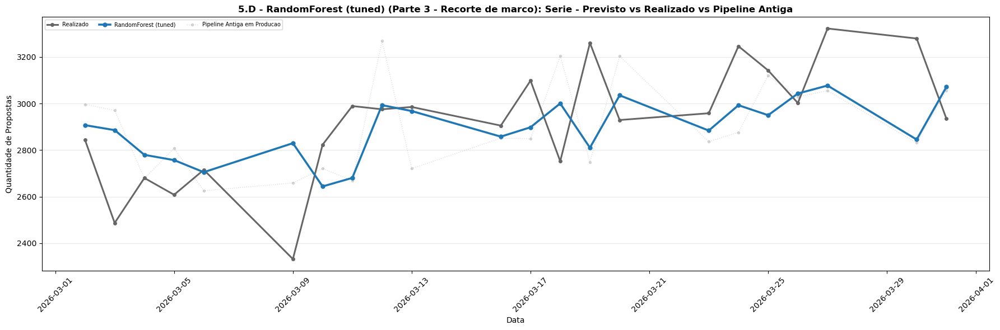

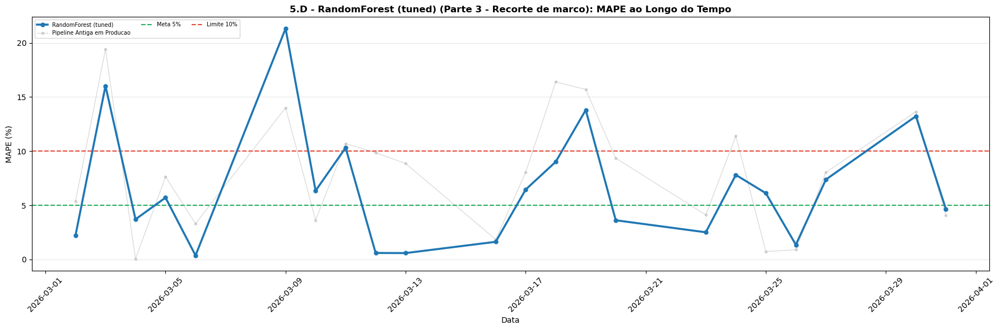

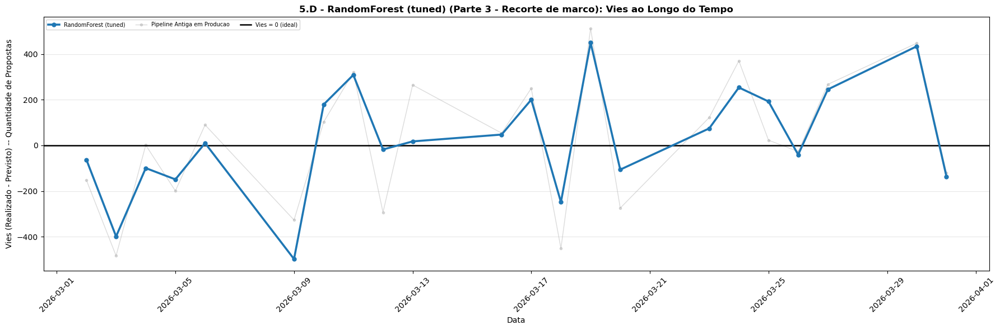


-- Metricas do periodo -- Parte 3 - Recorte de marco:


,Modelo,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,RandomForest (tuned),6.58,8.52,0.09,29.8,29.8,0.38,189.5,237.8,8.14,5.92,0.37,21.33,10/22,17/22,22
1,Pipeline Antiga em Producao,8.05,9.68,-0.243,22.5,22.5,0.14,234.1,279.1,9.56,8.05,0.04,19.43,8/22,15/22,22



### 5.D - RandomForest (tuned) | Parte 4 - Distribuicoes, RMSPE e trade-off (base completa)


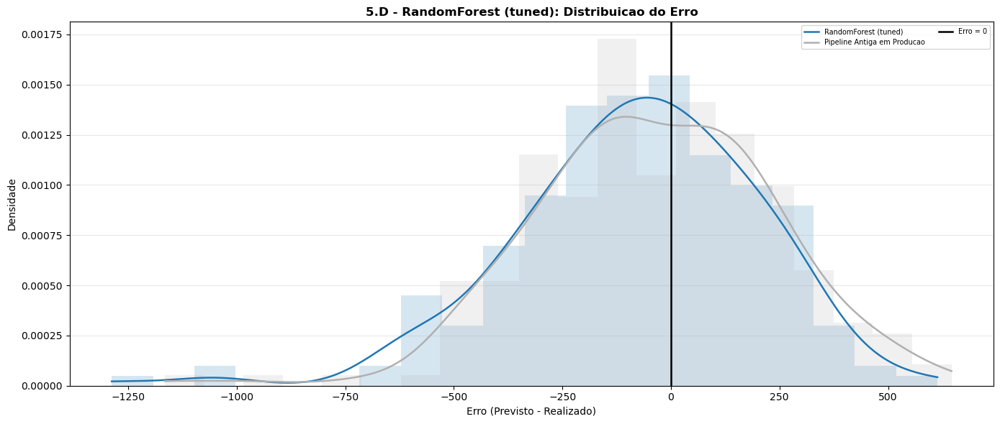

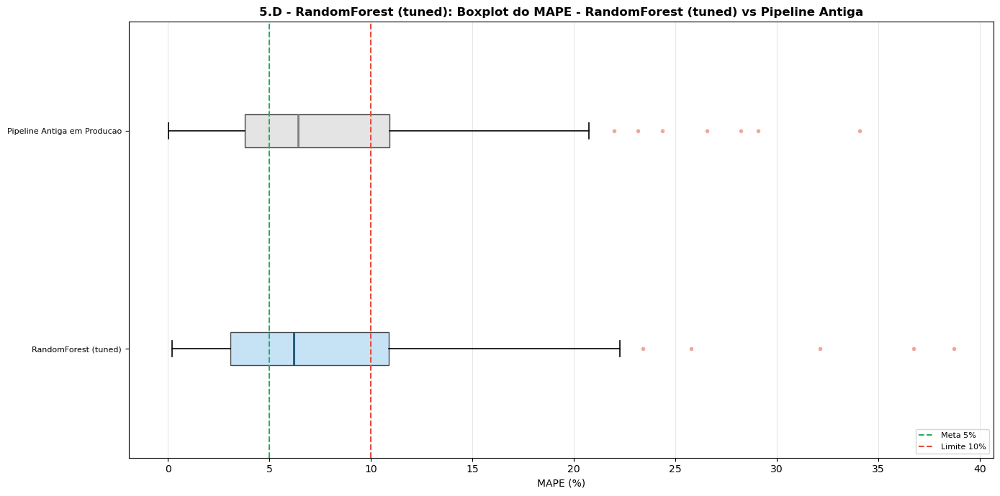

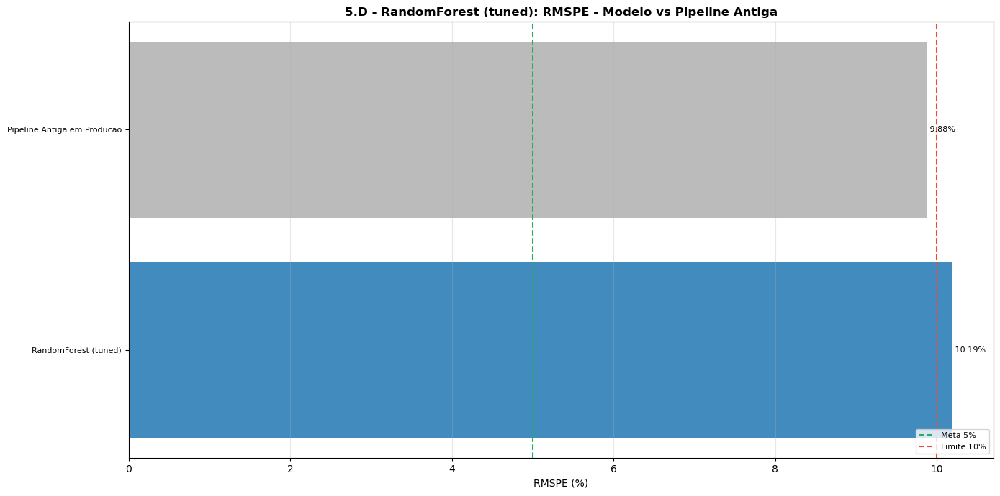

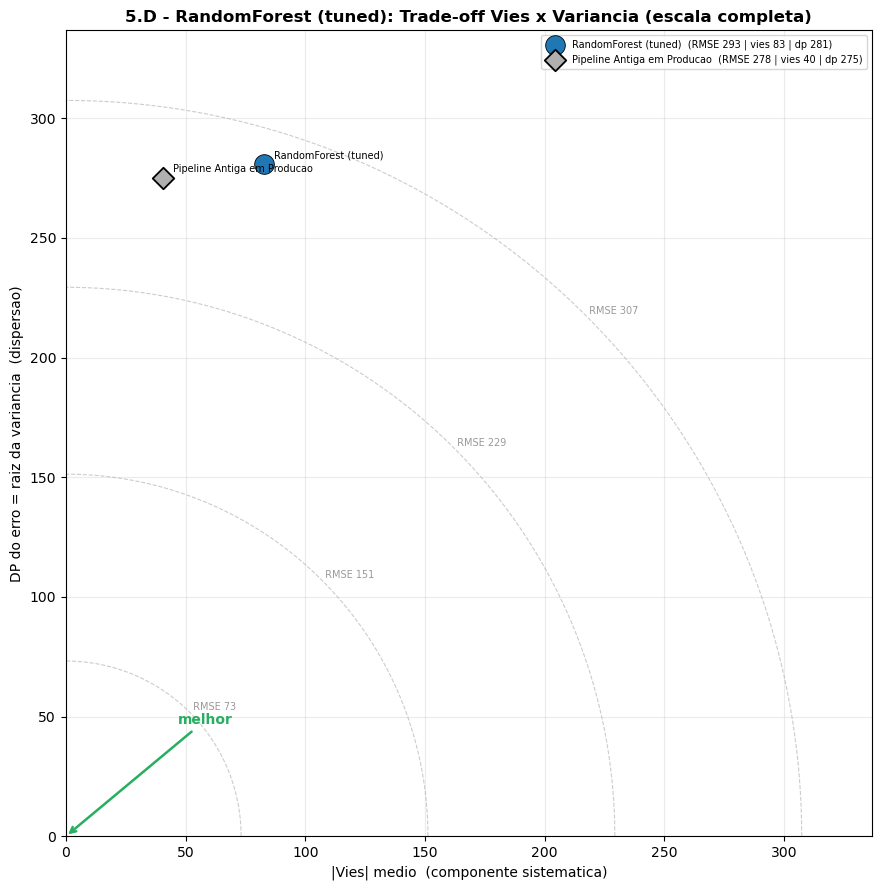


-- Metricas por mes -- RandomForest (tuned):


,Modelo,Mes,MAPE Medio (%),RMSPE (%),R2,Vies (real-prev),|Vies|,Vies % (MPE),MAE,DP Erro,CV Erro (%),Mediana (%),Min (%),Max (%),< 5%,< 10%,N
0,RandomForest (tuned),2025-05,16.58,16.68,-41.176,-325.4,325.4,-16.58,325.4,37.7,1.92,16.5,14.2,19.12,0/4,0/4,4
1,RandomForest (tuned),2025-06,8.43,9.96,0.006,121.6,121.6,4.45,196.8,200.4,8.66,8.65,1.05,18.42,5/16,9/16,16
2,RandomForest (tuned),2025-07,10.05,12.46,-1.245,176.5,176.5,6.1,275.1,295.9,11.05,8.68,0.19,23.38,6/22,12/22,22
3,RandomForest (tuned),2025-08,5.38,6.79,-0.122,40.4,40.4,1.14,146.5,179.4,6.54,4.47,0.21,15.93,11/21,19/21,21
4,RandomForest (tuned),2025-09,7.13,8.24,-0.205,35.4,35.4,0.72,197.0,226.9,8.23,7.03,0.27,15.26,8/22,16/22,22
5,RandomForest (tuned),2025-10,5.75,7.27,0.14,29.0,29.0,0.49,163.1,210.7,7.56,4.63,0.35,16.81,10/18,15/18,18
6,RandomForest (tuned),2025-11,12.04,15.36,-2.148,213.2,213.2,6.85,345.8,385.7,13.59,9.55,3.04,38.73,2/19,10/19,19
7,RandomForest (tuned),2025-12,9.85,12.39,-0.363,210.2,210.2,5.7,319.1,379.3,12.64,8.69,1.43,32.11,8/19,11/19,19
8,RandomForest (tuned),2026-01,4.87,6.61,-0.095,-8.5,8.5,-0.63,141.2,183.9,6.13,3.37,0.35,19.1,11/21,19/21,21
9,RandomForest (tuned),2026-02,6.31,7.34,0.24,16.1,16.1,0.01,190.8,223.2,7.34,5.82,0.98,14.29,5/15,11/15,15


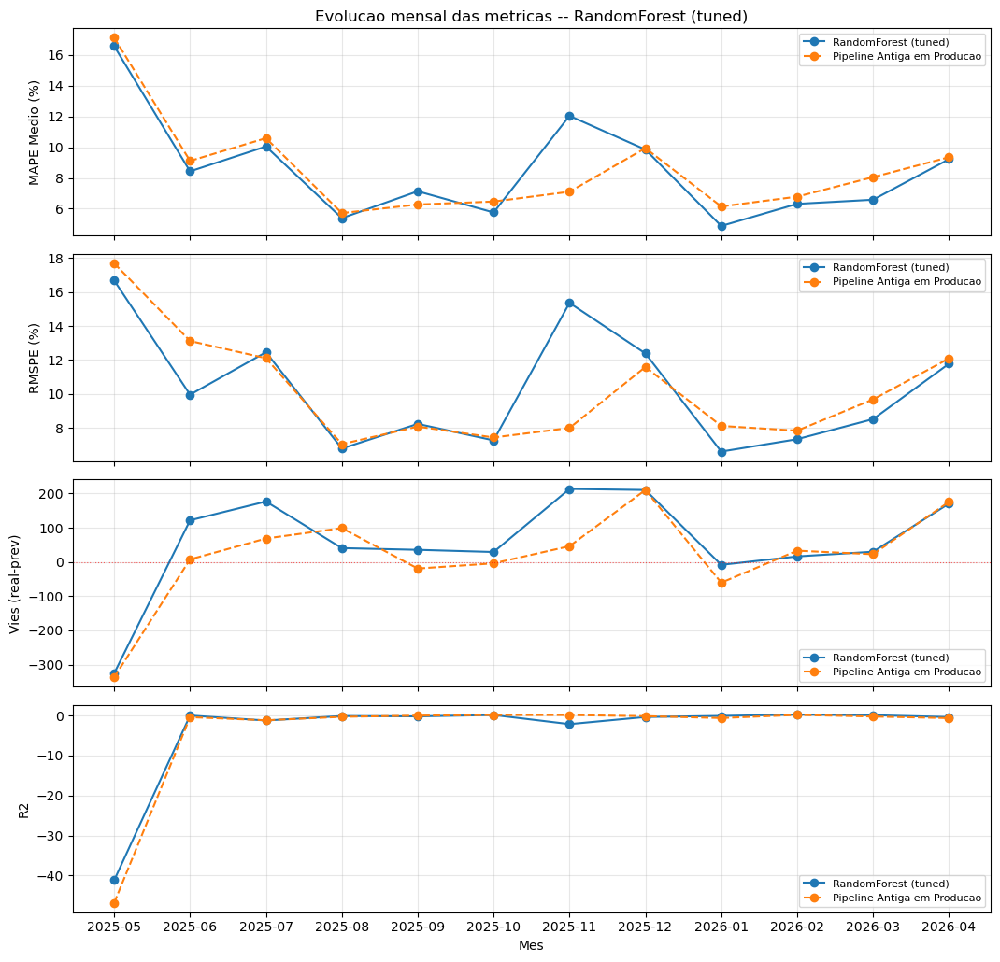

COMPARATIVO  |  RandomForest (tuned)   vs   Pipeline Antiga em Producao
Metrica                     Modelo   Pipeline Antiga         Delta   Resultado
------------------------------------------------------------------------------------
MAPE Medio (%)                7.88              7.89         -0.01   melhor
RMSPE (%)                    10.19              9.88         +0.31   pior
R2                           0.239             0.313         -0.07   pior
Vies (real-prev)              82.9              40.5        +42.40   
|Vies|                        82.9              40.5        +42.40   pior
MAE                          222.3             220.8         +1.50   pior
DP Erro                      280.8             275.2         +5.60   pior
Mediana (%)                   6.19              6.42         -0.23   melhor
N                              211               211         +0.00   


In [46]:
comparar_modelo('RandomForest (tuned)')


In [47]:
# ============================================================
# Comparativo diario de MARCO: SVR x FEAT+ABR-3 x Pipeline Antiga
# Gera df_marco_qtd (base _df_db, sem correcao de vies): dia previsto,
# realizado, previsto de cada modelo, vies diario (Realizado - Previsto)
# e qual modelo previu melhor (menor |vies|).
# ============================================================
_mods = {'SVR': 'SVR', 'FEAT+ABR-3': 'FEAT+ABR-3',
         'Pipeline Antiga em Producao': 'Pipeline Antiga'}

def _comparativo_marco(_src):
    _d = _src[_src['Modelo'].isin(_mods)].copy()
    _d['Dia Prevista'] = pd.to_datetime(_d['Dia Prevista'])
    _d = _d[_d['Dia Prevista'].dt.month == 3]   # somente MARCO
    _prev = _d.pivot_table('Valor Previsto', 'Dia Prevista', 'Modelo', aggfunc='first').rename(columns=_mods)
    _real = _d.groupby('Dia Prevista')['Valor Realizado'].first()
    _df = pd.DataFrame({'Realizado': _real})
    for _s in _mods.values():
        _df[f'Prev {_s}'] = _prev.get(_s)
    for _s in _mods.values():
        _df[f'Vies {_s}'] = _df['Realizado'] - _df[f'Prev {_s}']
    _vcols = [f'Vies {_s}' for _s in _mods.values()]
    _df['Melhor Previsao'] = (_df[_vcols].abs().idxmin(axis=1).str.replace('Vies ', '', regex=False))
    _df = (_df.reset_index().rename(columns={'Dia Prevista': 'Dia Previsto'})
              .sort_values('Dia Previsto').reset_index(drop=True))
    _num = _df.select_dtypes('number').columns
    _df[_num] = _df[_num].round(1)
    return _df

df_marco_qtd = _comparativo_marco(_df_db)   # sem correcao de vies

print(f'Marco: {len(df_marco_qtd)} dias | melhor previsao: '
      f'{df_marco_qtd["Melhor Previsao"].value_counts().to_dict()}')

print('\n=== MARCO (df_marco_qtd) ===')
display(df_marco_qtd)


Marco: 22 dias | melhor previsao: {'Pipeline Antiga': 10, 'FEAT+ABR-3': 6, 'SVR': 6}

=== MARCO (df_marco_qtd) ===


,Dia Previsto,Realizado,Prev SVR,Prev FEAT+ABR-3,Prev Pipeline Antiga,Vies SVR,Vies FEAT+ABR-3,Vies Pipeline Antiga,Melhor Previsao
0,2026-03-02,2844.0,2998.1,2988.6,2996.3,-154.1,-144.6,-152.3,FEAT+ABR-3
1,2026-03-03,2487.0,3000.3,3005.1,2970.3,-513.3,-518.1,-483.3,Pipeline Antiga
2,2026-03-04,2680.0,2980.9,3030.3,2678.8,-300.9,-350.3,1.2,Pipeline Antiga
3,2026-03-05,2608.0,2983.1,2930.6,2807.3,-375.1,-322.6,-199.3,Pipeline Antiga
4,2026-03-06,2715.0,2987.9,2931.3,2625.2,-272.9,-216.3,89.8,Pipeline Antiga
5,2026-03-09,2332.0,2956.6,2891.2,2658.7,-624.6,-559.2,-326.7,Pipeline Antiga
6,2026-03-10,2823.0,2937.7,2984.3,2720.4,-114.7,-161.3,102.6,Pipeline Antiga
7,2026-03-11,2989.0,2946.0,2910.8,2669.2,43.0,78.2,319.8,SVR
8,2026-03-12,2975.0,2942.0,3059.9,3268.2,33.0,-84.9,-293.2,SVR
9,2026-03-13,2985.0,2987.2,2985.3,2720.4,-2.2,-0.3,264.6,FEAT+ABR-3
